# House Prices - Kaggle Copetitions
## Preparing environment and uploading data
### Import Packages

In [1]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
import pylab 

from scipy.stats import skew, norm, probplot, boxcox
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler
from sklearn.feature_selection import f_regression, mutual_info_regression, SelectKBest, RFECV, SelectFromModel
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.feature_extraction import FeatureHasher
from sklearn.decomposition import PCA, KernelPCA
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.linear_model import LinearRegression, OrthogonalMatchingPursuit, Lasso, ElasticNet, ElasticNetCV
from sklearn.linear_model import ARDRegression, SGDRegressor, PassiveAggressiveRegressor, HuberRegressor, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, BaggingRegressor, ExtraTreesRegressor
import xgboost as xgb
from xgboost import XGBRegressor
from xgboost import plot_importance
from boruta import BorutaPy
from rfpimp import *
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping

Using TensorFlow backend.


### Load Datastes
I start with a data types dict, since pandas read_cvs make some mistakes on the data types definitions.
Futhermore, the pandas read_csv has the inconvinent of didn´t read data that has integer columns with nan (nulls). So I firts read the columns BsmtFullBath, BsmtHalfBath, GarageYrBlt and GarageCars as np.float32, and after had treated theirs nulls I make the coerce to np.int32.

In [2]:
dcols = {'Id': np.int64, 'MSSubClass': np.int64, 'MSZoning': np.object, 'LotFrontage': np.float64, 'LotArea': np.float64,
         'Street': np.object, 'Alley': np.object, 'LotShape': np.object, 'LandContour': np.object, 'Utilities': np.object,
         'LotConfig': np.object, 'LandSlope': np.object, 'Neighborhood': np.object, 'Condition1': np.object,
         'Condition2': np.object, 'BldgType': np.object, 'HouseStyle': np.object, 'OverallQual': np.int64,
         'OverallCond': np.int64, 'YearBuilt': np.int64, 'YearRemodAdd': np.int64, 'RoofStyle': np.object, 'RoofMatl': np.object,
         'Exterior1st': np.object, 'Exterior2nd': np.object, 'MasVnrType': np.object, 'MasVnrArea': np.float64,
         'ExterQual': np.object, 'ExterCond': np.object, 'Foundation': np.object, 'BsmtQual': np.object, 'BsmtCond': np.object,
         'BsmtExposure': np.object, 'BsmtFinType1': np.object, 'BsmtFinSF1': np.float64, 'BsmtFinType2': np.object,
         'BsmtFinSF2': np.float64, 'BsmtUnfSF': np.float64, 'TotalBsmtSF': np.float64, 'Heating': np.object,
         'HeatingQC': np.object, 'CentralAir': np.object, 'Electrical': np.object, '1stFlrSF': np.float64, '2ndFlrSF': np.float64,
         'LowQualFinSF': np.float64, 'GrLivArea': np.float64, 'BsmtFullBath': np.float64, 'BsmtHalfBath': np.float64,
         'FullBath': np.int64, 'HalfBath': np.int64, 'BedroomAbvGr': np.int64, 'KitchenAbvGr': np.int64, 'KitchenQual': np.object,
         'TotRmsAbvGrd': np.int64, 'Functional': np.object, 'Fireplaces': np.int64, 'FireplaceQu': np.object, 
         'GarageType': np.object, 'GarageYrBlt': np.float64, 'GarageFinish': np.object, 'GarageCars': np.float64, 
         'GarageArea': np.float64, 'GarageQual': np.object, 'GarageCond': np.object, 'PavedDrive': np.object, 
         'WoodDeckSF': np.float64, 'OpenPorchSF': np.float64, 'EnclosedPorch': np.float64, 'TSsnPorch': np.float64, 
         'ScreenPorch': np.float64, 'PoolArea': np.float64, 'PoolQC': np.object, 'Fence': np.object, 'MiscFeature': np.object, 
         'MiscVal': np.float64, 'MoSold': np.int64, 'YrSold': np.int64, 'SaleType': np.object, 'SaleCondition': np.object, 
         'SalePrice': np.float64}

data = pd.read_csv('../house/train.csv', dtype=dcols)
#data.drop(['Id'], axis=1, inplace=True)

test = pd.read_csv('../house/test.csv', dtype=dcols)
test['SalePrice'] = 0
Test_ID = test.Id
#test.drop(['Id'], axis=1, inplace=True)

In [3]:
all_data = data.append(test)

city = pd.read_csv('../house/Ames_Real_Estate_Data.txt', sep='\t', lineterminator='\r')
pid   = pd.read_csv('../house/AmesHousing.txt', sep='\t', lineterminator='\r')
merge = pd.merge(pid, city, how='left', left_on=['PID'], right_on=['GeoRefNo'])
del pid, city

inter_data = merge[['MS Zoning', 'Lot Area', 'Mo Sold', 'Overall Qual', 'Overall Cond', 'Bsmt Exposure',  'Sale Condition', 
       'Yr Sold', 'YrBuilt', 'Neighborhood_x', 'Gr Liv Area' , 'PID', 'ClassPr_S', 'ClassSc_S', 'MA_City', 
       'MA_State', 'MA_Zip1', 'TtlVal_AsrYr', 'ValType']]

inter_data.columns = ['MSZoning', 'LotArea', 'MoSold',  'OverallQual' , 'OverallCond', 'BsmtExposure', 'SaleCondition',
                      'YrSold', 'YearBuilt', 'Neighborhood', 'GrLivArea', 'PID', 'ClassPr_S', 'ClassSc_S', 
                      'MA_City', 'MA_State', 'MA_Zip1',  'TtlVal_AsrYr', 'ValType']

Max_PID = inter_data.\
            groupby(['MSZoning', 'LotArea', 'MoSold',  'OverallQual' , 'OverallCond', 'BsmtExposure', 'SaleCondition',
                    'YrSold', 'YearBuilt', 'Neighborhood', 'GrLivArea'], as_index=False).max()

inter_data = pd.merge(Max_PID, inter_data)

all_data = pd.merge(all_data, inter_data, how='left' )

data = all_data[(all_data.SalePrice>0)].drop_duplicates()
test = all_data[(all_data.SalePrice==0)].drop_duplicates()

del inter_data, Max_PID#, all_data

In [4]:
all_data = data.append(test)

display(all_data.MA_Zip1.value_counts()[all_data.MA_Zip1.value_counts()>5])
zip_data = city = pd.read_csv('../house/ACS_16_5YR_DP03_with_ann.csv', skiprows=1)

poverty = zip_data.loc[:, [ 'Id2',
  'Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - All people']]
poverty.columns = ['MA_Zip1', 'PovertyRate']
poverty.PovertyRate = poverty.PovertyRate.str.replace('-', '-1')
poverty.PovertyRate = poverty.PovertyRate.astype(np.float32)


all_data = pd.merge(all_data, poverty, how='left')

del zip_data, poverty
all_data.drop('MA_Zip1', axis=1, inplace=True)

50010.0    1683
50014.0     906
50021.0       7
Name: MA_Zip1, dtype: int64

In [5]:
display(all_data.MA_City.value_counts()[all_data.MA_City.value_counts()>2])
all_data.MA_City = all_data.MA_City.apply(lambda x: x if x=='AMES' else 'others')

AMES                  2589
ANKENY                  10
IOWA CITY                7
WEST DES MOINES          5
URBANDALE                5
CLIVE                    5
DES MOINES               5
STATE COLLEGE            5
CARROLL                  5
POLK CITY                4
BOONE                    4
SPENCER                  4
GRIMES                   4
BONDURANT                3
NEVADA                   3
STORY CITY               3
CAMBRIDGE                3
JOHNSTON                 3
GREEN COVE SPRINGS       3
Name: MA_City, dtype: int64

In [6]:
display(all_data.MA_State.value_counts()[all_data.MA_State.value_counts()>2])
all_data.MA_State = all_data.MA_State.apply(lambda x: x if x=='IA' else 'others')

IA    2741
IL       8
PA       7
MN       7
CA       7
FL       5
CO       3
Name: MA_State, dtype: int64

In [7]:
display(all_data.ClassSc_S.value_counts()[all_data.ClassSc_S.value_counts()>2])
others = ['1-STORY W/FINISHED ATTIC ALL AGES', 'MISC. CHARITABLE', 
          '1-1/2 STORY TWNHM - ALL AGES', 'RELIGIOUS - RESIDENCE - PARSONAGE']
all_data.ClassSc_S = all_data.ClassSc_S.apply(lambda x: 'others' if x in others else x)

data = all_data[(all_data.SalePrice>0)].drop_duplicates()
test = all_data[(all_data.SalePrice==0)].drop_duplicates()

1-STORY 1946 & NEWER ALL STYLES              1035
2-STORY 1946 & NEWER                          566
1-1/2 STORY FINISHED ALL AGES                 288
1-STORY TWNHM - 1946 & NEWER                  187
2-STORY TWNHM - 1946 & NEWER                  126
2-STORY 1945 & OLDER                          125
1-STORY 1945 & OLDER                          125
SPLIT OR MULTI-LEVEL                          118
DUPLEX - ALL STYLES AND AGES                   82
SPLIT FOYER                                    47
2 FAMILY CONVERSION - ALL STYLES AND AGES      39
2-1/2 STORY ALL AGES                           26
1-1/2 STORY - UNFINISHED ALL AGES              19
MULTILEVEL TWNHM  - INCL SPLIT LEV/FOYER       17
Name: ClassSc_S, dtype: int64

## 2. Exploratory Data Analysis (EDA)
### Take a First Look of our Data:
I created the function below to simplify the analysis of general characteristics of the data. Inspired on the str function of R, this function returns the types, counts, distinct, count nulls, missing ratio and uniques values of each field/feature.

If the study involve some supervised learning, this function can return the study of the correlation, for this we just need provide the independent variable to the pred parameter.

Also, if your return is stored in a variable you can evaluate it in more detail, specific of a field, or sort them from different perspectives

In [8]:
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: [x.unique()])
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ration = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing ration', 'uniques', 'skewness', 'kurtosis']
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ration', 'uniques', 'skewness', 'kurtosis', corr_col ]
    
    str.columns = cols
    dtypes = str.types.value_counts()
    print('___________________________\nData types:\n',str.types.value_counts())
    print('___________________________')
    return str

In [9]:
details = rstr(data, 'SalePrice')
display(details.sort_values(by='corr SalePrice', ascending=False))

Data shape: (1460, 89)
___________________________
Data types:
 object     48
float64    26
int64      14
float32     1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr SalePrice
SalePrice,float64,1460,663,0,0.000000,"[[208500.0, 181500.0, 223500.0, 140000.0, 2500...",1.882876,6.536282,1.000000
TtlVal_AsrYr,float64,1405,1089,55,3.767123,"[[255000.0, 248200.0, 266900.0, 208200.0, 3502...",2.261217,13.798971,0.884285
OverallQual,int64,1460,10,0,0.000000,"[[7, 6, 8, 5, 9, 4, 10, 3, 1, 2]]",0.216944,0.096293,0.790982
GrLivArea,float64,1460,861,0,0.000000,"[[1710.0, 1262.0, 1786.0, 1717.0, 2198.0, 1362...",1.366560,4.895121,0.708624
GarageCars,float64,1460,5,0,0.000000,"[[2.0, 3.0, 1.0, 0.0, 4.0]]",-0.342549,0.220998,0.640409
GarageArea,float64,1460,441,0,0.000000,"[[548.0, 460.0, 608.0, 642.0, 836.0, 480.0, 63...",0.179981,0.917067,0.623431
TotalBsmtSF,float64,1460,721,0,0.000000,"[[856.0, 1262.0, 920.0, 756.0, 1145.0, 796.0, ...",1.524255,13.250483,0.613581
1stFlrSF,float64,1460,753,0,0.000000,"[[856.0, 1262.0, 920.0, 961.0, 1145.0, 796.0, ...",1.376757,5.745841,0.605852
FullBath,int64,1460,4,0,0.000000,"[[2, 1, 3, 0]]",0.036562,-0.857043,0.560664
TotRmsAbvGrd,int64,1460,12,0,0.000000,"[[8, 6, 7, 9, 5, 11, 4, 10, 12, 3, 2, 14]]",0.676341,0.880762,0.533723


In [10]:
add_details = rstr(data[['ClassPr_S', 'ClassSc_S', 'MA_City', 'MA_State', 'TtlVal_AsrYr', 'ValType', 'SalePrice']], 
                   'SalePrice')
display(add_details.sort_values(by='corr SalePrice', ascending=False))

Data shape: (1460, 7)
___________________________
Data types:
 object     5
float64    2
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr SalePrice
SalePrice,float64,1460,663,0,0.000000,"[[208500.0, 181500.0, 223500.0, 140000.0, 2500...",1.882876,6.536282,1.000000
TtlVal_AsrYr,float64,1405,1089,55,3.767123,"[[255000.0, 248200.0, 266900.0, 208200.0, 3502...",2.261217,13.798971,0.884285
ClassPr_S,object,1405,3,55,3.767123,"[[RESIDENTIAL, nan, EXEMPT]]",NaN,NaN,NaN
ClassSc_S,object,1405,16,55,3.767123,"[[2-STORY 1946 & NEWER, 1-STORY 1946 & NEWER A...",NaN,NaN,NaN
MA_City,object,1460,2,0,0.000000,"[[AMES, others]]",NaN,NaN,NaN
MA_State,object,1460,2,0,0.000000,"[[IA, others]]",NaN,NaN,NaN
ValType,object,1405,6,55,3.767123,"[[F, nan, B, P, A, I]]",NaN,NaN,NaN


### Some Observations from the STR Details:
- For know the descriptions of each data click [here](data_description.txt).
- Independent variabel, **SalePrice**, are ***skewed*** and ***heavy-tailed distribution***. We need investigate its distribution with a plot and check if a **transformation by Log 1P** could correct it, withou drop most of the **outiliers**.
<p>
 
- Nulls: The data have 19 features with nulls, five of then area categorical and with more then 47% of missing ration. They are candidates to drop or use them to create another more interesting feature:
 - PoolQC
 - MiscFeature
 - Alley
 - Fence
 - FireplaceQu

<p>
    
- Features ***high skewed right***, ***heavy-tailed distribution***, and with ***high correlation*** to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
 - TotalBsmtSF
 - 1stFlrSF
 - GrLivArea

<p>
    
- Features ***skewed***, ***heavy-tailed distribution***, and with ***good correlation*** to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
 - LotArea
 - KitchenAbvGr
 - ScreenPorch
 - EnclosedPorch
 - MasVnrArea
 - OpenPorchSF
 - LotFrontage
 - BsmtFinSF1
 - WoodDeckSF
 - MSSubClass

<p>
    
- Features ***high skewed***, ***heavy-tailed distribution***, and with ***low correlation*** to Sales Price. Maybe we can drop these features, or just use they with other to create a new more importants feature:
 - MiscVal
 - TSsnPorch
 - LowQualFinSF
 - BsmtFinSF2
 - BsmtHalfBa

<p>
    
- Features ***low skewed***, and with ***good to low correlation*** to Sales Price. Just use a Robustscaler probably reduce the few  distorcions:
 - BsmtUnfSF
 - 2ndFlrSF
 - TotRmsAbvGrd
 - HalfBath
 - Fireplaces
 - BsmtFullBath
 - OverallQual
 - BedroomAbvGr
 - GarageArea
 - FullBath
 - GarageCars
 - OverallCond

<p>
    
- Transforme from Yaer Feature to Age, 2011 - Year feature, or YEAR(TODAY()) - Year Feature
 - YearRemodAdd: 
 - YearBuilt
 - GarageYrBlt
 - YrSold

When we apply this data to a Keras, we need to chnage the float64 and Int64 to float32 and Int32!

### First see of some stats of Numeric Data
So, for the main statistics of our numeric data describe the function (like the summary of R)

In [11]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,7.305000e+02,4.216100e+02,1.0,3.657500e+02,730.5,1.095250e+03,1.460000e+03
MSSubClass,1460.0,5.689726e+01,4.230057e+01,20.0,2.000000e+01,50.0,7.000000e+01,1.900000e+02
LotFrontage,1201.0,7.004996e+01,2.428475e+01,21.0,5.900000e+01,69.0,8.000000e+01,3.130000e+02
LotArea,1460.0,1.051683e+04,9.981265e+03,1300.0,7.553500e+03,9478.5,1.160150e+04,2.152450e+05
OverallQual,1460.0,6.099315e+00,1.382997e+00,1.0,5.000000e+00,6.0,7.000000e+00,1.000000e+01
OverallCond,1460.0,5.575342e+00,1.112799e+00,1.0,5.000000e+00,5.0,6.000000e+00,9.000000e+00
YearBuilt,1460.0,1.971268e+03,3.020290e+01,1872.0,1.954000e+03,1973.0,2.000000e+03,2.010000e+03
YearRemodAdd,1460.0,1.984866e+03,2.064541e+01,1950.0,1.967000e+03,1994.0,2.004000e+03,2.010000e+03
MasVnrArea,1452.0,1.036853e+02,1.810662e+02,0.0,0.000000e+00,0.0,1.660000e+02,1.600000e+03
BsmtFinSF1,1460.0,4.436397e+02,4.560981e+02,0.0,0.000000e+00,383.5,7.122500e+02,5.644000e+03


### Overall Quality

Overall Quality has the highest correlation with SalePrice among the numeric variables (0.79). It rates the overall material and finish of the house on a scale from 1 (very poor) to 10 (very excellent). The positive correlation is certainly there indeed, and seems to be a slightly upward curve. Regarding outliers, I do not see any extreme values. If there is a candidate to take out as an outlier later on, it seems to be the expensive house with grade 4.

Especially the two houses with really big living areas and low SalePrices seem outliers. I will not take them out yet, as taking outliers can be dangerous. For instance, a low score on the Overall Quality could explain a low price. However, as you can see below, these two houses actually also score maximum points on Overall Quality. Therefore, I will keep theses houses in mind as prime candidates to take out as outliers.

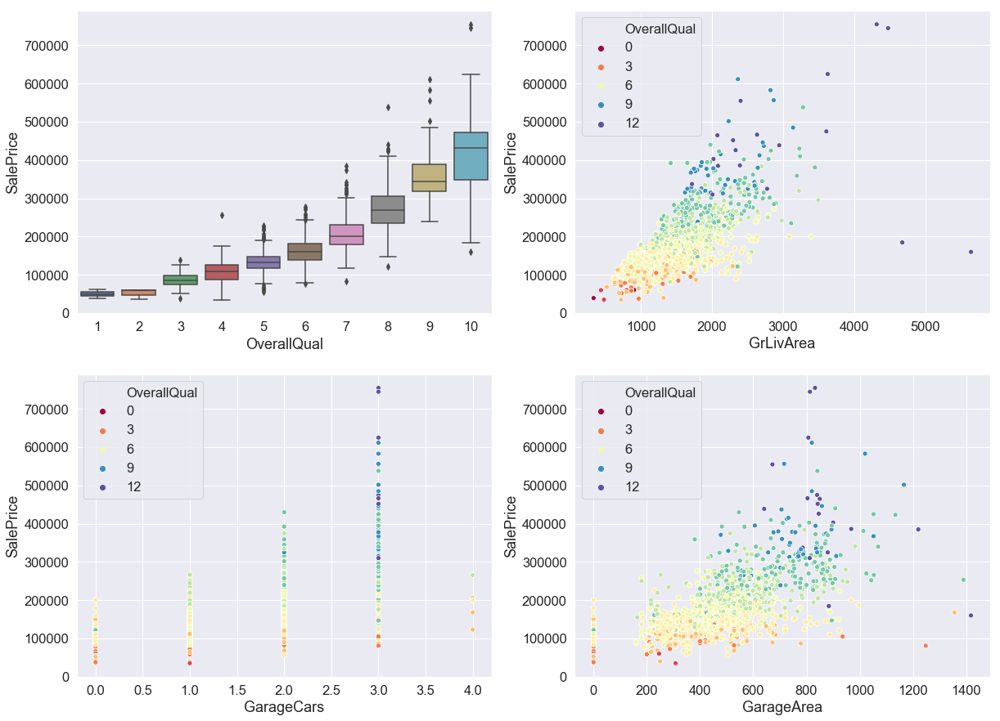

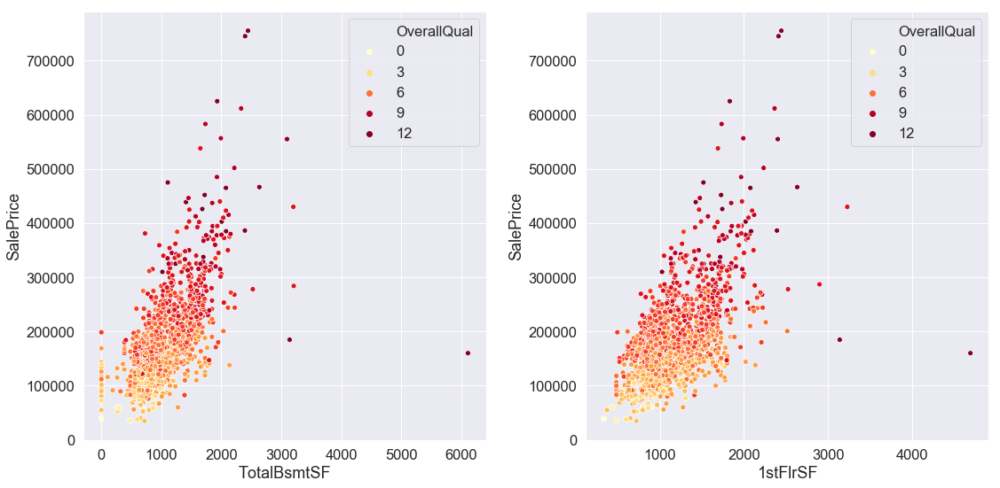

In [12]:
fig = plt.figure(figsize=(20, 15))
sns.set(font_scale=1.5)

# (Corr= 0.817185) Box plot overallqual/salePrice
fig1 = fig.add_subplot(221); sns.boxplot(x='OverallQual', y='SalePrice', data=data[['SalePrice', 'OverallQual']])

# (Corr= 0.700927) GrLivArea vs SalePrice plot
fig2 = fig.add_subplot(222); sns.scatterplot(x = data.GrLivArea, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

# (Corr= 0.680625) GarageCars vs SalePrice plot
fig3 = fig.add_subplot(223); sns.scatterplot(x = data.GarageCars, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

# (Corr= 0.650888) GarageArea vs SalePrice plot
fig4 = fig.add_subplot(224); sns.scatterplot(x = data.GarageArea, y = data.SalePrice, hue=data.OverallQual, palette= 'Spectral')

fig5 = plt.figure(figsize=(16, 8))
fig6 = fig5.add_subplot(121); sns.scatterplot(y = data.SalePrice , x = data.TotalBsmtSF, hue=data.OverallQual, palette= 'YlOrRd')

fig7 = fig5.add_subplot(122); sns.scatterplot(y = data.SalePrice, x = data['1stFlrSF'], hue=data.OverallQual, palette= 'YlOrRd')

plt.tight_layout(); plt.show()

#### Total Rooms above Ground and Living Area

                                                                  Outliers: 3


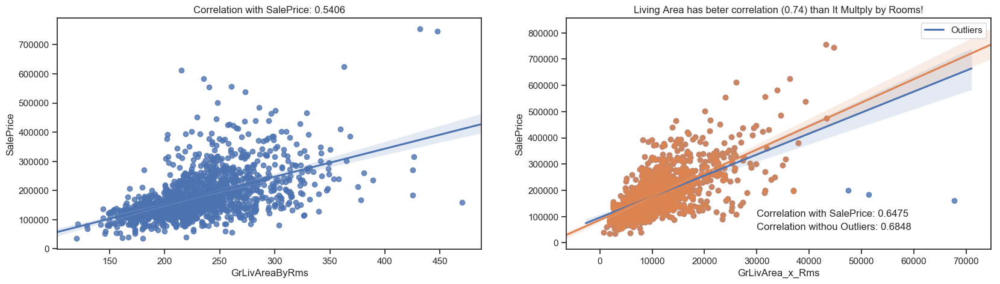

In [13]:
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)

df = data[['SalePrice', 'GrLivArea', 'TotRmsAbvGrd']]
df['GrLivAreaByRms'] = data.GrLivArea/data.TotRmsAbvGrd
df['GrLivArea_x_Rms'] = data.GrLivArea*data.TotRmsAbvGrd
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GrLivAreaByRms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GrLivAreaByRms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=30000, y=100000, s='Correlation with SalePrice: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))

print('                                                                  Outliers:',(df.GrLivArea_x_Rms>=45000).sum())
df = df.loc[df.GrLivArea_x_Rms<45000]
sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); 
plt.title('Living Area has beter correlation ({:1.2f}) than It Multply by Rooms!'.format(df.GrLivArea.corr(df.SalePrice)))
plt.text(x=30000, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))
plt.show()
del df

As we can see, the interaction between the two features did not present a better correlation than that already seen in the living area, include it improves to 0.74 with the cut of the outliers.

On the other hand, the ***multiplication*** not only demonstrated the living area **outliers** already identified, but it still **emphasized another**. If the strategy is to ***drop the TotRmsAbvGrd***, we should also ***exclude this additional outlier***.

In [14]:
data = data[data.GrLivArea * data.TotRmsAbvGrd < 45000]
data.shape

(1457, 89)

#### Garage areas and parking

From the boxplot below, we can note that more than 3 parking cars and more than 900 of area are outliers, since a few number of their observations. Although there is a relationship between them, most likely with a smaller number of parking spaces, there may be more garage area for other purposes, reason why the correlation between them is 0.88 and not 1.

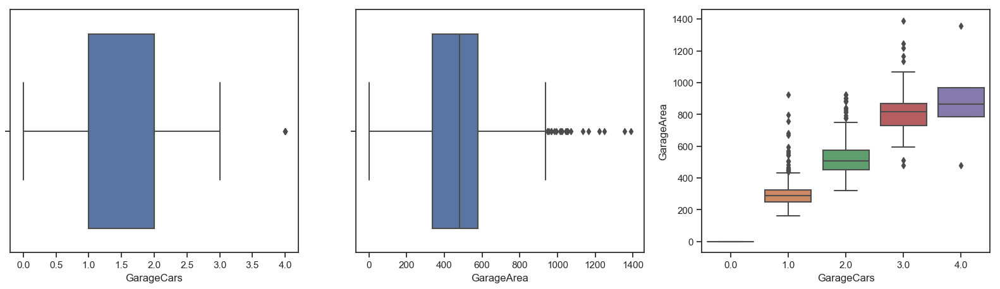

In [15]:
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(131); sns.boxplot(data.GarageCars)
fig2 = fig.add_subplot(132); sns.boxplot(data.GarageArea)
fig3 = fig.add_subplot(133); sns.boxplot(data.GarageCars, data.GarageArea)
plt.show()

                                                                 Outliers: 4


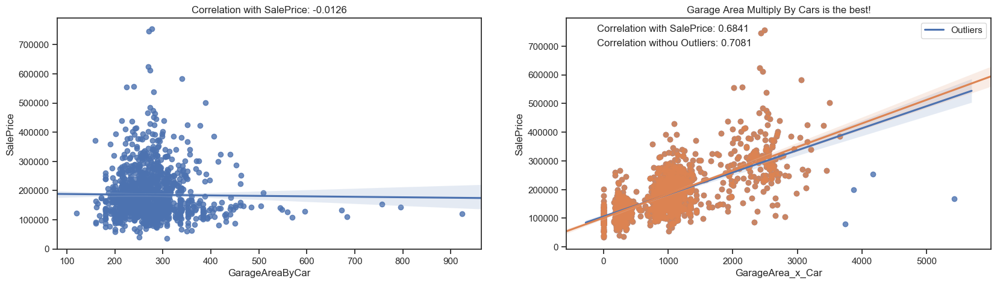

In [16]:
df = data[['SalePrice', 'GarageArea', 'GarageCars']]
df['GarageAreaByCar'] = data.GarageArea/data.GarageCars
df['GarageArea_x_Car'] = data.GarageArea*data.GarageCars

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GarageAreaByCar', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageAreaByCar.corr(df['SalePrice'])))

fig2 = fig.add_subplot(122); sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=-100, y=750000, s='Correlation with SalePrice: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.GarageArea_x_Car>=3700).sum())
df = df.loc[df.GarageArea_x_Car<3700]
sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.title('Garage Area Multiply By Cars is the best!')
plt.text(x=-100, y=700000, s='Correlation withou Outliers: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
plt.show()
del df

As can be seen the area by car is little useful, but contrary to common sense the multiplication of the area by the number of vacancies yes is. In the division we lose the magnitude and we have to maintain one or another functionality to recover it. With the multiplication we solve the problem of 1 parking space of 10 square feet against another of 10 with 1 square feet each. We could still ***improve the correlation*** by **0.06**, already considering the exclusion of only 4 outliers. 

The identification of the outliers was facilitated, note that before we would have a greater number of outliers, since the respective of each features alone are not conhencidentes.

So let's continue with the multiplication strategy, remove the two original metrics that have high correlation with each other, and exclude the 4 outliers from the training base.

In [17]:
data = data[data.GarageArea * data.GarageCars < 3700]
data.shape

(1453, 89)

#### Total Basement Area Vs 1st Flor Area

                                                             Outliers: 1


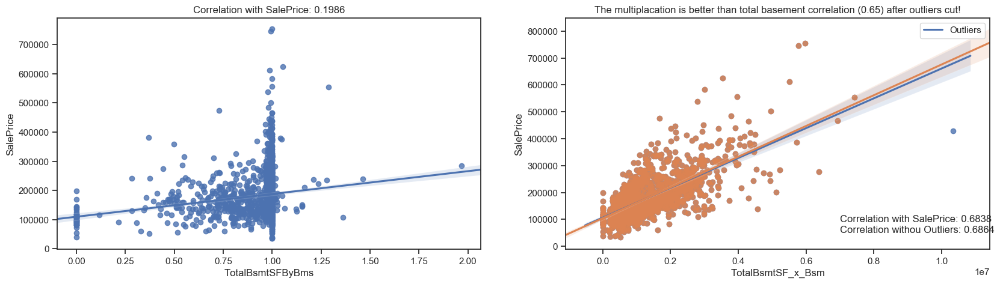

In [18]:
df = data[['SalePrice', 'TotalBsmtSF', '1stFlrSF']]
df['TotalBsmtSFByBms'] = data.TotalBsmtSF/data['1stFlrSF']
df['TotalBsmtSF_x_Bsm'] = data.TotalBsmtSF*data['1stFlrSF']
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='TotalBsmtSFByBms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalBsmtSFByBms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=7e06, y=90000, s='Correlation with SalePrice: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))

print('                                                             Outliers:',(df.TotalBsmtSF_x_Bsm>=0.9e07).sum())
df = df.loc[df.TotalBsmtSF_x_Bsm<0.9e07]
sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); 
plt.title('The multiplacation is better than total basement correlation ({:1.2f}) after outliers cut!'.format(df.TotalBsmtSF.corr(df.SalePrice)))
plt.text(x=7e06, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))
plt.show()
del df

Similar to what we saw in the garage analysis, we again have a better correlation by multiplying the variables, but now we don't have a significant gain with outlier exclusion. So let's continue with the multiplication strategy and remove only the two original metrics that have high correlation with each other.

#### Year Built Vs Garage Year Built
From the graphs below, we confirm that this two features are highly correlated, but as expect is not easy to find a good substitute by iteration.

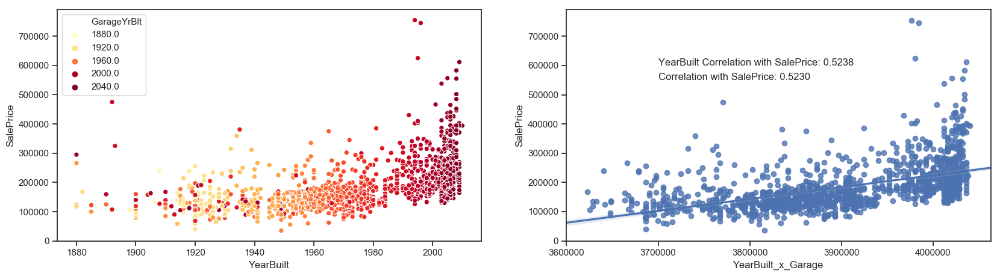

In [19]:
df = data[['SalePrice', 'YearBuilt', 'GarageYrBlt']]
df['YearBuilt_x_Garage'] = data.YearBuilt*data.GarageYrBlt
df['Garage_Newest'] = data.YearBuilt < data.GarageYrBlt

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.scatterplot(y = data.SalePrice, x = data.YearBuilt, hue=data.GarageYrBlt, palette= 'YlOrRd')
fig2 = fig.add_subplot(122); sns.regplot(x='YearBuilt_x_Garage', y='SalePrice', data=df); 
plt.text(x=3700000, y=600000, s='YearBuilt Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt.corr(df['SalePrice'])))
plt.text(x=3700000, y=550000, s='Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt_x_Garage.corr(df['SalePrice'])))
plt.show()

However, by making the year of construction of the garage an indicator of whether it is newer, it becomes easiest to identify a pattern of separation. But note that although we have a rising price due to the lower age.

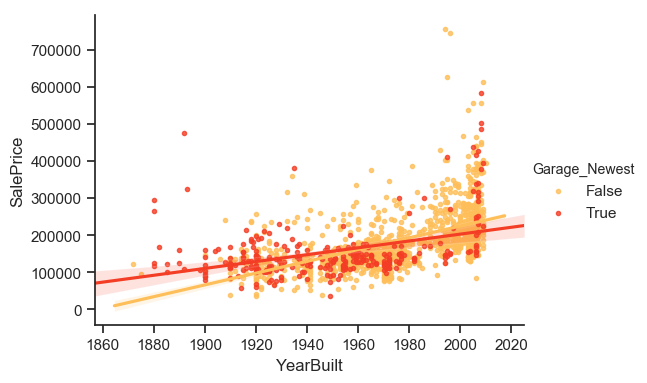

In [20]:
sns.lmplot(y = 'SalePrice', x = 'YearBuilt', data=df, markers='.', aspect=1.4, height=4, hue= 'Garage_Newest', palette= 'YlOrRd')
plt.show();  
del df

But note that although we have a rising price the newer the house, the growth rate is very smooth, even with the rate gain with a newer garage. This makes sense, given that the prices of these regressors are meeting with the mean price of each year.

#### Bathrooms Features
There are 4 bathroom variables. FullBath has the largest correlation with SalePrice between than. The others individually, these features are not very important. 

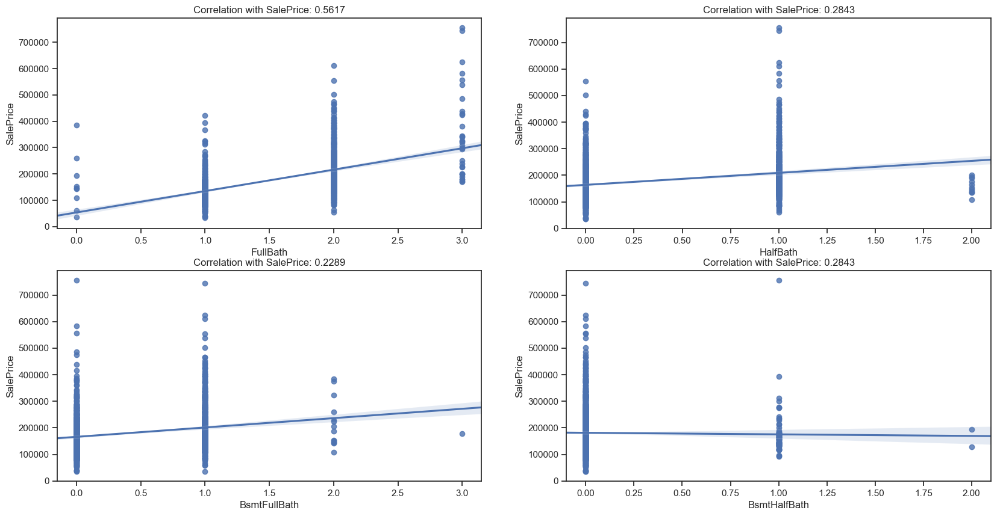

In [21]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(221); sns.regplot(x='FullBath', y='SalePrice', data=data)
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.FullBath.corr(data['SalePrice'])))

fig2 = fig.add_subplot(222); sns.regplot(x='HalfBath', y='SalePrice', data=data);
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.HalfBath.corr(data['SalePrice'])))

fig3 = fig.add_subplot(223); sns.regplot(x='BsmtFullBath', y='SalePrice', data=data)
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.BsmtFullBath.corr(data['SalePrice'])))

fig4 = fig.add_subplot(224); sns.regplot(x='BsmtHalfBath', y='SalePrice', data=data);
plt.title('Correlation with SalePrice: {:6.4f}'.format(data.HalfBath.corr(data['SalePrice'])))

plt.show()

However, I assume that I if I add them up into one predictor, this predictor is likely to become a strong one. A half-bath, also known as a powder room or guest bath, has only two of the four main bathroom components-typically a toilet and sink. Consequently, I will also count the half bathrooms as half.

In [22]:
df = data[['SalePrice', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']]
df['TotBathrooms'] = df.FullBath + (df.HalfBath*0.5) + df.BsmtFullBath + (df.BsmtHalfBath*0.5)

                                                                 Outliers: 2


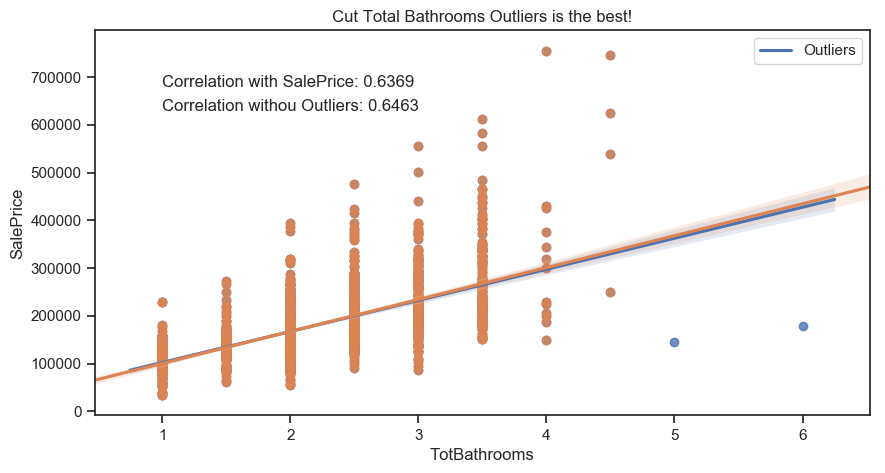

In [23]:
fig = plt.figure(figsize=(10,5))
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=1, y=680000, s='Correlation with SalePrice: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.TotBathrooms>=5).sum())
df = df.loc[df.TotBathrooms<5]
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.title('Cut Total Bathrooms Outliers is the best!')
plt.text(x=1, y=630000, s='Correlation withou Outliers: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
plt.show()

So, with our best predictor, we can cut only two outliers, use it and substitute all others bath features with a existence indicator.

In [24]:
data = data[(data.FullBath + (data.HalfBath*0.5) + data.BsmtFullBath + (data.BsmtHalfBath*0.5))<5]

### Reviwe Porsh Features:

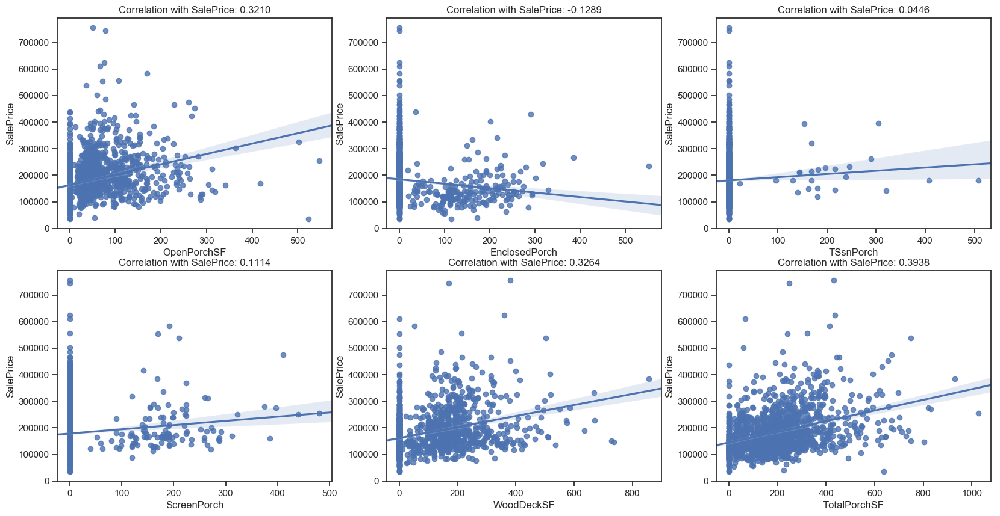

In [25]:
def PorshPlots():
    fig = plt.figure(figsize=(20,10))
    fig1 = fig.add_subplot(231); sns.regplot(x='OpenPorchSF', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OpenPorchSF.corr(df['SalePrice'])))

    fig2 = fig.add_subplot(232); sns.regplot(x='EnclosedPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.EnclosedPorch.corr(df['SalePrice'])))

    fig3 = fig.add_subplot(233); sns.regplot(x='TSsnPorch', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TSsnPorch.corr(df['SalePrice'])))

    fig4 = fig.add_subplot(234); sns.regplot(x='ScreenPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ScreenPorch.corr(df['SalePrice'])))

    fig5 = fig.add_subplot(235); sns.regplot(x='WoodDeckSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.WoodDeckSF.corr(df['SalePrice'])))

    fig6 = fig.add_subplot(236); sns.regplot(x='TotalPorchSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPorchSF.corr(df['SalePrice'])))

    plt.show()

df = data[['SalePrice', 'OpenPorchSF', 'EnclosedPorch', 'TSsnPorch', 'ScreenPorch', 'WoodDeckSF']]
df['TotalPorchSF'] = df.OpenPorchSF + df.EnclosedPorch + df.TSsnPorch + df.ScreenPorch + df.WoodDeckSF
#df = df[df.TotalPorchSF<=600]
PorshPlots()

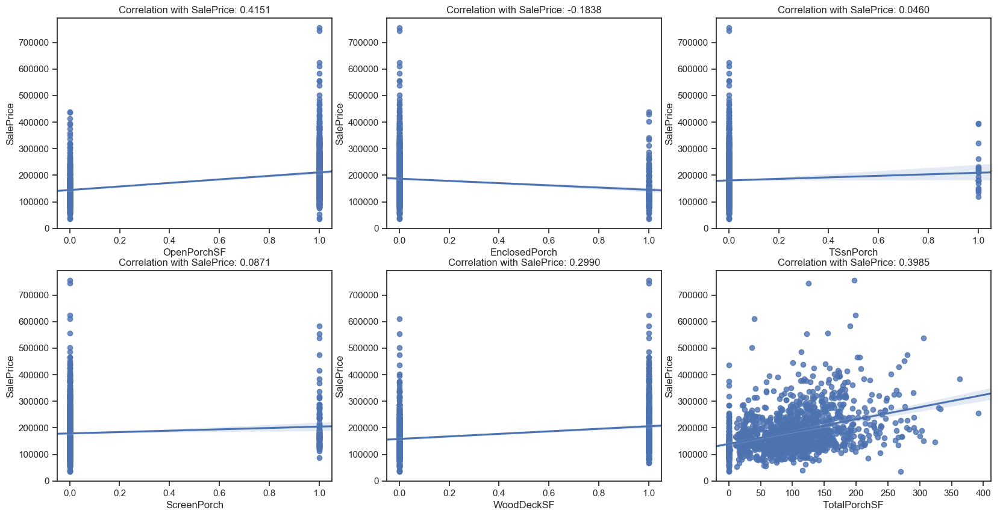

In [26]:
df.OpenPorchSF = df.OpenPorchSF > 0
df.EnclosedPorch =  df.EnclosedPorch > 0
df.TSsnPorch = df.TSsnPorch > 0
df.ScreenPorch = df.ScreenPorch > 0
df.WoodDeckSF = df.WoodDeckSF > 0
df.TotalPorchSF = np.sqrt(df.TotalPorchSF) * (np.log1p(np.sqrt(df.TotalPorchSF))**2)

PorshPlots()

### Slope of property and Lot area

     SalePrice  LandSlope   LotArea  LotAreaMultSlope
249   277000.0          1  159000.0          159000.0
313   375000.0          1  215245.0          215245.0
335   228950.0          1  164660.0          164660.0


Text(0.5,1,'Correlation with SalePrice: 0.4106')

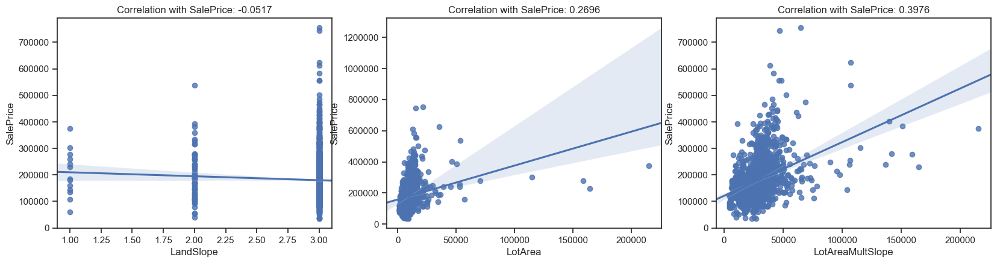

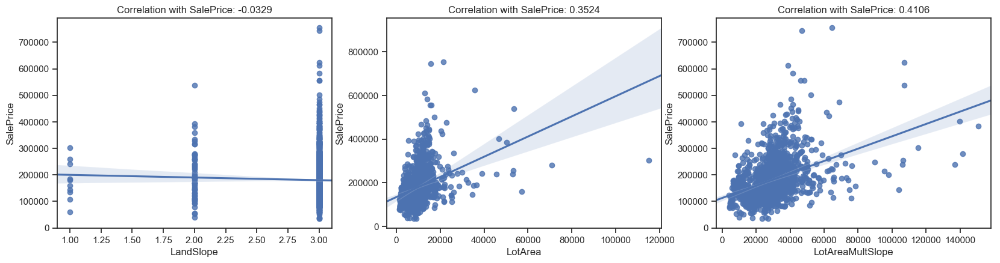

In [27]:
# LandSlope: Slope of property
LandSlope = {}
LandSlope['Gtl'] = 3 #'Gentle slope'
LandSlope['Mod'] = 2 #'Moderate Slope'
LandSlope['Sev'] = 1 #'Severe Slope'

df = data[['SalePrice', 'LandSlope', 'LotArea']]
df.LandSlope = df.LandSlope.map(LandSlope)
df['LotAreaMultSlope'] = (df.LotArea * df.LandSlope)

fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))

print(df[df.LotArea>155000])
df = df[df.LotArea<155000]
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(234); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(235); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(236); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))

### Neighborhood

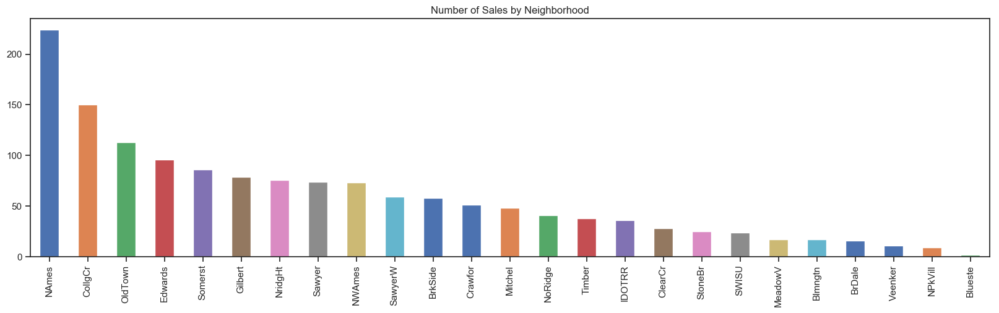

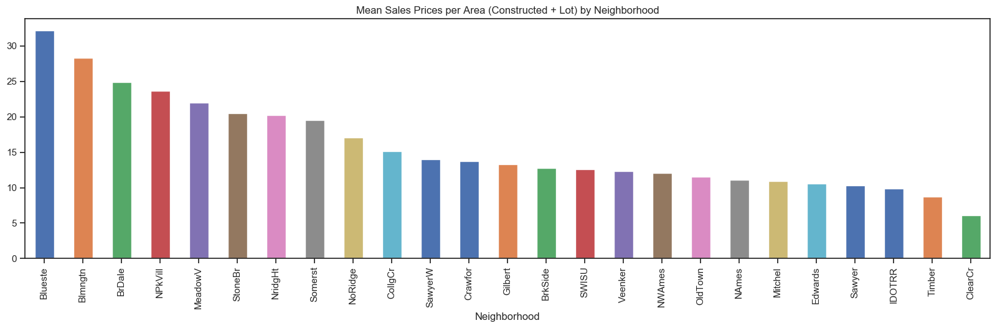

In [28]:
figa = plt.figure(figsize=(20, 5))
g = data.Neighborhood.value_counts().plot(kind='bar', title='Number of Sales by Neighborhood')

figb = plt.figure(figsize=(20, 5))
plt.tight_layout()
df = data[['SalePrice', 'YrSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) + data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
 
df = df.groupby(by=['Neighborhood', 'YrSold'], as_index=False).sum()
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
g = Neig.groupby('Neighborhood').NeigPrice.sum().sort_values(ascending = False).plot(kind='bar', title='Mean Sales Prices per Area (Constructed + Lot) by Neighborhood')
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:


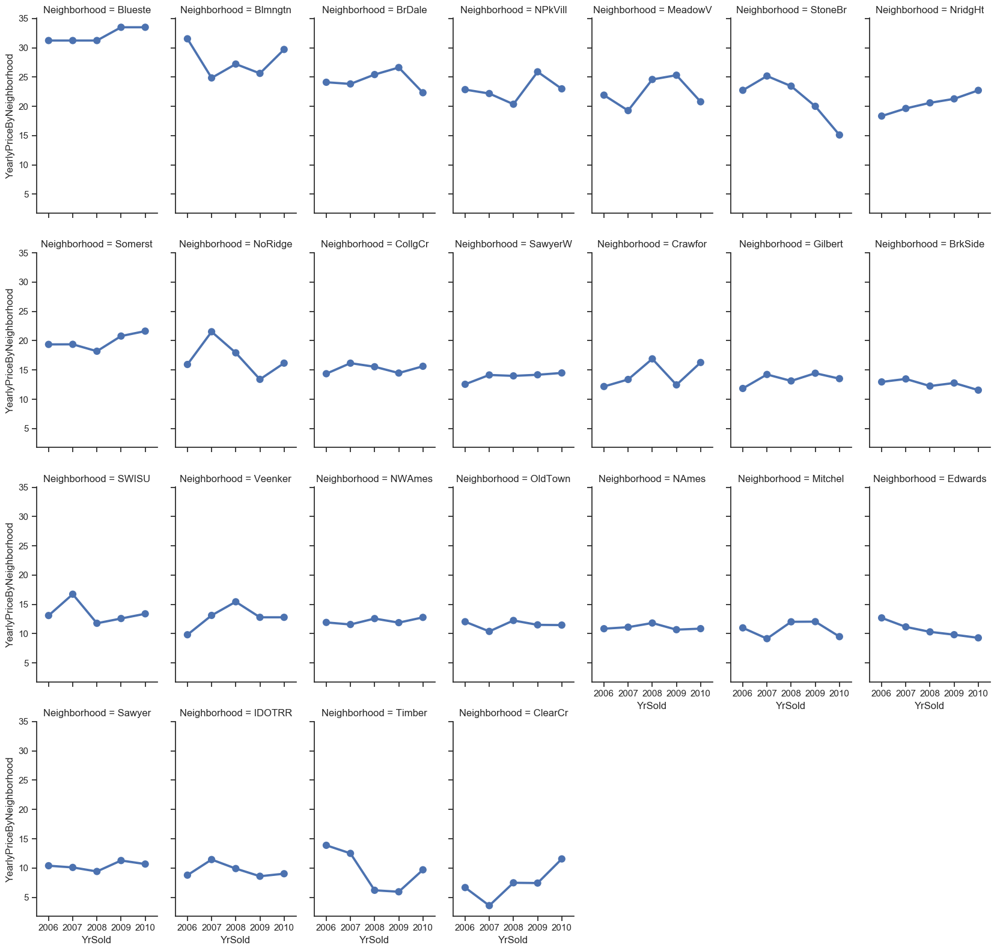

In [29]:
# Yearly Sales Price per Area (Constructed + Lot) by Neighborhood:
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['NPkVill', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2009, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2007, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].max()]], 
                            columns=df.columns))

# Reserve data to merge with all data set of train and test data
YearlyPrice = df
YearlyPrice.columns = ['Neighborhood', 'YrSold', 'YearlyPriceByNeighborhood']

print('                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)

                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:


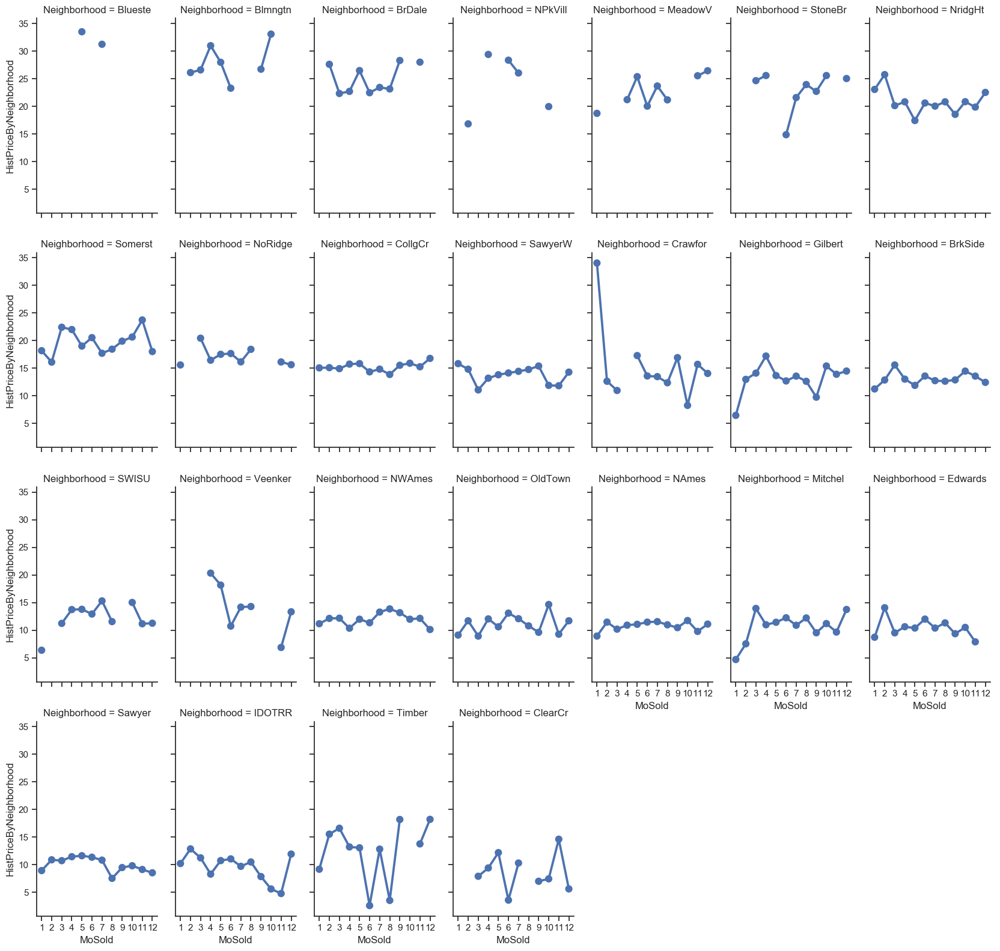

In [30]:
# Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:
df = data[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                   data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

print('                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'HistPriceByNeighborhood', x = 'MoSold', col='Neighborhood', data=df, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )

In [31]:
# Outliers from Crawfor Neighborhood
df = data[data.Neighborhood=='Crawfor'][['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )

df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df[df.HistPriceByNeighborhood>30]

,SalePrice,MoSold,Neighborhood,TotalArea,HistPriceByNeighborhood
1181,392500.0,11,Crawfor,9875.0,39.746835
1405,275000.0,1,Crawfor,8074.0,34.059946


In [32]:
data = data.loc[~(data.SalePrice==392500.0)]
data = data.loc[~((data.SalePrice==275000.0) & (data.Neighborhood=='Crawfor'))]

                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:


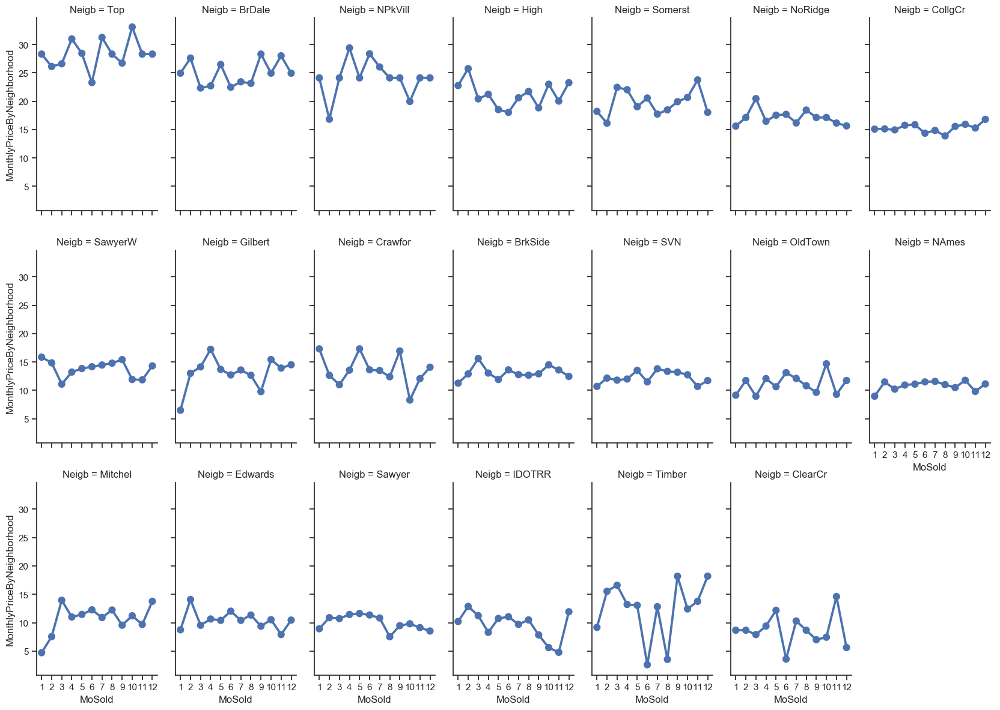

In [33]:
# Bin neighborhood for trade cases with low observations on monthly sales prices per Area (Constructed + Lot) by Neighborhood:
Neigb = {}
Neigb['Blueste'] = 'Top'     # 32.212721
Neigb['Blmngtn'] = 'Top'     # 28.364756
Neigb['BrDale']  = 'BrDale'  # 24.903923
Neigb['NPkVill'] = 'NPkVill' # 23.681105
Neigb['MeadowV'] = 'High'    # 22.034923
Neigb['StoneBr'] = 'High'    # 20.475090
Neigb['NridgHt'] =  'High'   # 20.209245
Neigb['Somerst'] = 'Somerst' # 19.551888
Neigb['NoRidge'] = 'NoRidge' # 17.038145
Neigb['CollgCr'] = 'CollgCr' # 15.134767
Neigb['SawyerW'] = 'SawyerW' # 13.992995
Neigb['Crawfor'] = 'Crawfor' # 13.773418
Neigb['Gilbert'] = 'Gilbert' # 13.260281
Neigb['BrkSide'] = 'BrkSide' # 12.785202
Neigb['SWISU']   = 'SVN'     # 12.635171
Neigb['Veenker'] = 'SVN'     # 12.343735
Neigb['NWAmes']  = 'SVN'     # 12.066590
Neigb['OldTown'] = 'OldTown' # 11.571331
Neigb['NAmes']   = 'NAmes'   # 11.091393
Neigb['Mitchel'] = 'Mitchel' # 10.936368
Neigb['Edwards'] = 'Edwards' # 10.614919
Neigb['Sawyer']  = 'Sawyer'  #10.334445
Neigb['IDOTRR']  = 'IDOTRR'  # 9.880838
Neigb['Timber']  = 'Timber'  # 8.723326
Neigb['ClearCr'] = 'ClearCr' # 6.113654

# Preper dataset for Sales Price per Area (Constructed + Lot) by Neighborhood:
df = data[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + data.LotArea.fillna(0) +                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
df['Price'] = df.SalePrice/df.TotalArea

# Cut Outliers from Crawfor Neighborhood
df = df[(((df.Neighborhood == 'Crawfor') & (df.Price<30.)) | (df.Neighborhood != 'Crawfor'))]
df.drop(['Price'], axis=1, inplace=True)

df.Neighborhood = data.Neighborhood.map(Neigb)

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea

# Get the index for order by value
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['Top', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 8, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 11, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 1, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 10, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 12, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 1, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 3, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 5, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 8, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 11, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 12, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 2, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 10, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].max()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 4, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Timber', 10, df.HistPriceByNeighborhood[df.Neighborhood=='Timber'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 1, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 2, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 8, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Edwards', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Edwards'].mean()]], 
                            columns=df.columns))


# Reserve data to merge with all data set of train and test data
MonthlyPrice = df
MonthlyPrice.columns = ['Neigb', 'MoSold', 'MonthlyPriceByNeighborhood']

print('                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:')
g = sns.catplot(y= 'MonthlyPriceByNeighborhood', x = 'MoSold', col='Neigb', data=MonthlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )


### Check the Dependent Variable - SalePrice:

Since most of the machine learning algorithms start from the principle that our data has a normal distribution, we first take a look at the distribution of our **independent variable**. For this, I create a procedure to plot the **Sales Dsitribution** and **QQ-plot** to identify substantive departures from normality, likes ***outliers***, ***skewness*** and ***kurtosis***.

In [34]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20,7))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()

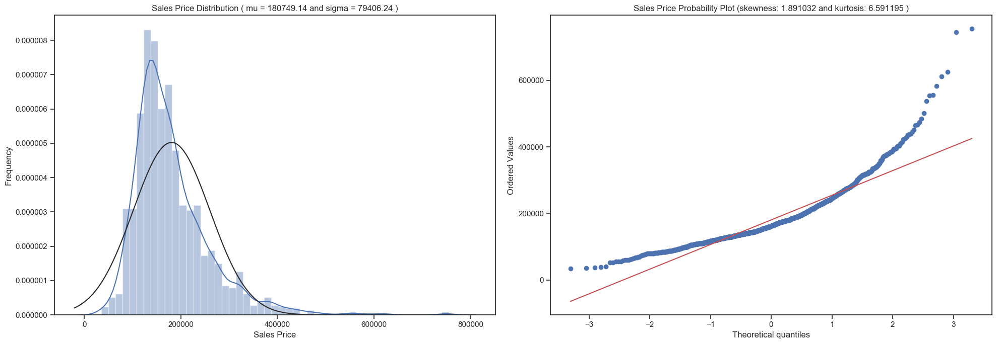

In [35]:
QQ_plot(data.SalePrice, 'Sales Price')

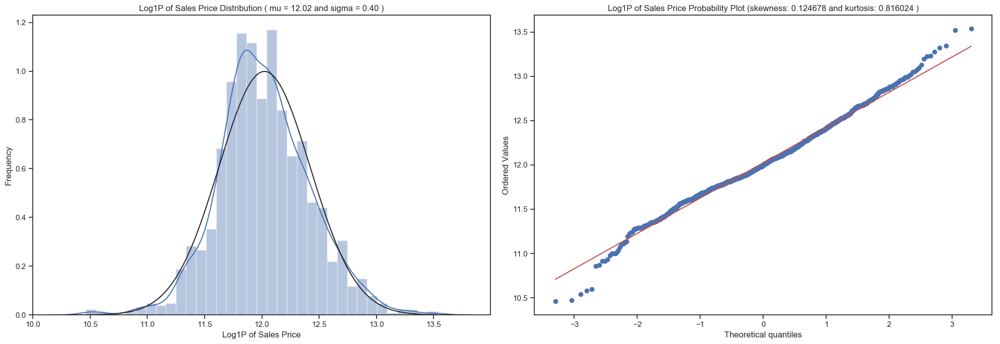

In [36]:
# y, lambda_opt_y = boxcox(1 + data.SalePrice) # -2.6542833469202254
y = data.SalePrice
Sale = np.log1p(data.SalePrice)

QQ_plot(Sale, 'Log1P of Sales Price')

From the first graph above we can see that Sales Price distribution is ***skewed***, has a **peak**, it **deviates from normal distribution** and is **positively biased**.
From the **Probability Plot**, we could see that **Sales Price** also does **not align with the diagonal  <span style="color:red">red line</span>** which represent normal distribution. The form of its distribution confirm that is a skewed right. 

With ***skewness positive of 1.9***, we confirm the **lack of symmetry** and indicate that Sales Price are **skewed right**, as we can see too at the Sales Distribution plot, skewed right means that the right tail is **long relative to the left tail**. The skewness for a normal distribution is zero, and any symmetric data should have a skewness near zero. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.

**Kurtosis** is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution. That is, data sets with high kurtosis tend to have heavy tails, or outliers, and **positive** kurtosis indicates a **heavy-tailed distribution** and **negative** kurtosis indicates a **light tailed distribution**. So, with 6.5 of positive kurtosis **Sales Price** are definitely heavy-tailed and has some **outliers** that we need take care.

Note that in contrast to common belief, training a linear regression model does not require that the explanatory or target variables are normally distributed. The normality assumption is only a requirement for certain statistical tests and hypothesis tests
So, I try diferents linear regressors with both, with and without transformantion of SalePrice to chek their results.

### Test hypothesis of better feature: Construction Area
Let's create a new feature that sum all area features, the construct area, and evaluates if is better than their parcels.

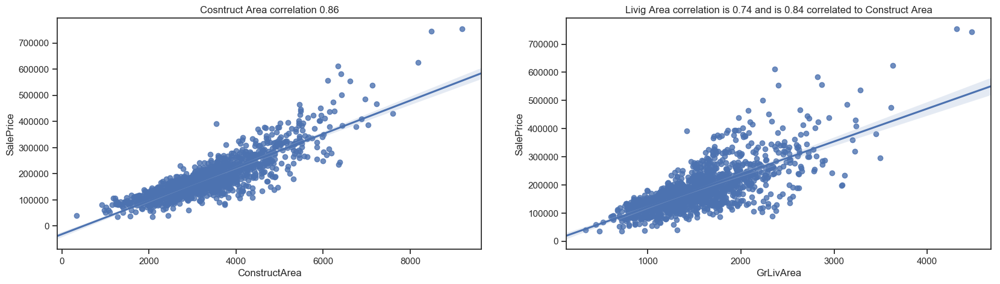

In [37]:
df = data[['SalePrice', 'GrLivArea']]
df['ConstructArea'] = (data.TotalBsmtSF.fillna(0) + data.WoodDeckSF.fillna(0) + data.GrLivArea.fillna(0) + 
                       data.MasVnrArea.fillna(0) + data.GarageArea.fillna(0) + data.OpenPorchSF.fillna(0) + 
                       data.TSsnPorch.fillna(0) + data.ScreenPorch.fillna(0) + data.EnclosedPorch.fillna(0) + data.PoolArea.fillna(0) )
                         
fig8 = plt.figure(figsize=(20,5))
fig9 = fig8.add_subplot(121); sns.regplot((df.ConstructArea), df.SalePrice)
plt.title('Cosntruct Area correlation {:1.2f}'.format(df.ConstructArea.corr(df.SalePrice)))

fig10 = fig8.add_subplot(122); sns.regplot((df.GrLivArea.fillna(0)), df.SalePrice)
tit = 'Livig Area correlation is {:1.2f} and is {:1.2f} correlated to Construct Area'
plt.title(tit.format(df.GrLivArea.fillna(0).corr(df.SalePrice), df.GrLivArea.corr(df.ConstructArea)))
plt.show()

As we can see, our built metric performs better than its pacelas, even more than the living area. Besides better correlation, it presents less bias and variance.

This may lead us to think of a model option that uses only the constructed area, without including any of the parcels, that would be replaced by an indication variable of existence or not if there is no categorical variable associated with it.

We can also use them to compose other variables and finally remove them.

Anyway the **living area** seems ***useless*** now, to prove it let's go see how a single linear regressor perform with this options:

In [38]:
def print_results():
    # The coefficients
    print('Coefficients: \n', lr.coef_)
    # The mean squared error
    print("Root mean squared error: %.4f"
          % np.expm1(np.sqrt(mean_squared_error(y_test, y_pred))))
    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.4f' % r2_score(y_test, y_pred))
    print('--------------------------------------------------------------------------------\n')
    
scale = RobustScaler()
y = np.log1p(df.SalePrice)

X = scale.fit_transform(df[['ConstructArea', 'GrLivArea']])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

lr = LinearRegression()

print('1. Linear regressor with only living Area:')
lr.fit(X_train[: , 1].reshape(-1, 1), y_train)

# Make predictions using the testing set
y_pred = lr.predict(X_test[: , 1].reshape(-1, 1))
print_results()

print('2. Linear regressor with bouth features:')
lr.fit(X_train, y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test)
print_results()

print('3. Linear regressor with only Construct Area:')
lr = LinearRegression()
lr.fit(X_train[: , 0].reshape(-1, 1), y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test[: , 0].reshape(-1, 1))
print_results()

print('4. Polinomial regressor of orden 3 with only Construction Area:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train[: , 0].reshape(-1, 1))

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test[: , 0].reshape(-1, 1)))
print_results()

print('5. Polinomial regressor of orden 3 with both features:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train)

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test))
print_results()

1. Linear regressor with only living Area:
Coefficients: 
 [0.37373448]
Root mean squared error: 0.3135
Variance score: 0.5547
--------------------------------------------------------------------------------

2. Linear regressor with bouth features:
Coefficients: 
 [0.40446921 0.02013973]
Root mean squared error: 0.2275
Variance score: 0.7484
--------------------------------------------------------------------------------

3. Linear regressor with only Construct Area:
Coefficients: 
 [0.42050449]
Root mean squared error: 0.2276
Variance score: 0.7481
--------------------------------------------------------------------------------

4. Polinomial regressor of orden 3 with only Construction Area:
Coefficients: 
 [ 0.437434   -0.0420375   0.00630214]
Root mean squared error: 0.2212
Variance score: 0.7608
--------------------------------------------------------------------------------

5. Polinomial regressor of orden 3 with both features:
Coefficients: 
 [ 0.41182783  0.03846449 -0.0503578

According to the above results, we can safely eliminate the living area, and as there are no records with it zero or null we will not create an existence indicator for it.

Other importante point is the **polynomial transformation of ordem 3** presents ***improvements*** of **2.6%** and **1.8%** of  RMSE and R2 respectively. So, now we have a simple regressor to bit!

Before create new features and other test, is better to make the data cleaning and fill nas.

## 3. Check Data Quality:
### Nulls Check:
In this section, I am going to fix the 34 predictors that contains missing values. I will go through them working my way down from most NAs until I have fixed them all. If I stumble upon a variable that actually forms a group with other variables, I will also deal with them as a group. For instance, there are multiple variables that relate to Pool, Garage, and Basement.

In [39]:
#all_data = pd.concat((data.loc[:, 'MSSubClass': 'SaleCondition'], test.loc[:,'MSSubClass':'SaleCondition']))
all_data = pd.concat((data, test))

print("All data observations have {0} rows and {1} columns".format(all_data.shape[0], all_data.shape[1]))
details = rstr(all_data)
print("All data have {1:2.2%} of null at {0} features".format(details[details.nulls>0].shape[0], 
                                                   details.nulls[details.nulls>0].sum()/all_data.size))
print('\nBelow the table with all columns with nulls oredered by missin ration:')
display(details.loc[(details.nulls>0), 'types':'uniques'].sort_values(by= 'missing ration', ascending=False))

All data observations have 2908 rows and 89 columns
Data shape: (2908, 89)
___________________________
Data types:
 object     48
float64    26
int64      14
float32     1
Name: types, dtype: int64
___________________________
All data have 5.64% of null at 40 features

Below the table with all columns with nulls oredered by missin ration:


,types,counts,distincts,nulls,missing ration,uniques
PoolQC,object,9,4,2899,99.690509,"[[nan, Ex, Fa, Gd]]"
MiscFeature,object,104,5,2804,96.423659,"[[nan, Shed, Gar2, Othr, TenC]]"
Alley,object,197,3,2711,93.225585,"[[nan, Grvl, Pave]]"
Fence,object,570,5,2338,80.398900,"[[nan, MnPrv, GdWo, GdPrv, MnWw]]"
FireplaceQu,object,1493,6,1415,48.658872,"[[nan, TA, Gd, Fa, Ex, Po]]"
LotFrontage,float64,2423,129,485,16.678129,"[[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, na..."
GarageYrBlt,float64,2752,104,156,5.364512,"[[2003.0, 1976.0, 2001.0, 1998.0, 2000.0, 1993..."
GarageQual,object,2752,6,156,5.364512,"[[TA, Fa, Gd, nan, Ex, Po]]"
GarageFinish,object,2752,4,156,5.364512,"[[RFn, Unf, Fin, nan]]"
GarageCond,object,2752,6,156,5.364512,"[[TA, Fa, nan, Gd, Po, Ex]]"


In [40]:
class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

### Some Observations Respect Data Quality:
<p>The total training observations are 1,460 and have 79 features ( 3 float64, 33 int64, 43 object ) with 19 columns with nulls
All data observations, including test dataste, have 2919 rows and 79 features, where 6.06% are nulls, but found nulls at 34 diferente features. So the test dataset has null in features that training dataset doesn't have!

***Based on feature description provide, A feature that has NA means it is absent***
<p>
First, before we assume this as a total reality, we need check some quality issues, like the record has Garage, but doesn't have Garage Quality and vice versa.


 - 14 has few null, so are good candidates for imputer strategies:
   - GarageFinish  1379  object.  Interior finish of the garage.
   - GarageQual    1379  object:  Garage quality. 
   - GarageCond    1379  object:  Garage condition. 
   - GarageType    1379  object:  Garage location
   - GarageYrBlt   1379  float64: Year garage was built
   - Electrical    1459  object.  Only one, can apply the most commun.
   - MasVnrType    1452  object:  is the masonry veneer type, hasn't CBlock!
   - MasVnrArea    1452  float64: Masonry veneer area in square feet.   
   - BsmtExposure  1422  object:  Refers to walkout or garden level walls.
   - BsmtFinType2  1422  object:  Rating of basement finished area (if multiple types).
   - BsmtQual      1423  object:  Evaluates the height of the basement Doesn't have PO.
   - BsmtCond      1423  object:  Ealuates the general condition of the basement. 
   - BsmtFinType1  1423  object:  Rating of basement finished area (if multiple types).    
   - LotFrontage   1201  float64: is the linear feet of street connected to property.
<p>
 - 5 has miss ration grater than 47%, maybe candidates to exclude, especially if their have below correlation with price.
    - Fence         281  object: Fence quality.
    - FireplaceQu   770  object: Fireplace quality.
    - MiscFeature    54  object: Miscellaneous feature not covered in other categories. 
    - Alley          91  object: is the type of alley access to property.
    - PoolQC          7  object: Pool quality. Atention for the related other feature PoolArea: Pool area in square feet

Some numeric data are ordinal or categorical already translate to codes. We need correct identify the ordinal from the description and can maintain as is, but need to change de categoricals.<p>
    
Utilities : For this categorical feature all records are "AllPub", except for one "NoSeWa" and 2 NA . Since the house with 'NoSewa' is in the training set, this feature won't help in predictive modelling. We can then safely remove it.

In [41]:
all_data.drop('Utilities', axis=1, inplace=True)

### Identify the Most Commun Electrical:

In [42]:
display(all_data.Electrical.value_counts())

all_data.Electrical = all_data.Electrical.fillna('SBrkr')

SBrkr    2661
FuseA     187
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

### Fill Missing Values of Garage Features:
Identify if has some special cases where we find some garage feature inputted, where's others garages features are null.

In [43]:
feat = ['GarageYrBlt', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'GarageArea', 'GarageCars']
print(all_data[feat].isnull().sum())
print("GarageArea equal a 0: ", (all_data.GarageArea==0).sum())
print("GarageCars equal a 0: ", (all_data.GarageCars==0).sum())
c = all_data[~all_data.GarageType.isnull()][feat]
c[c.GarageYrBlt.isnull()]

GarageYrBlt     156
GarageType      154
GarageFinish    156
GarageQual      156
GarageCond      156
GarageArea        1
GarageCars        1
dtype: int64
GarageArea equal a 0:  154
GarageCars equal a 0:  154


,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
2126,NaN,Detchd,NaN,NaN,NaN,360.0,1.0
2576,NaN,Detchd,NaN,NaN,NaN,NaN,NaN


#### Group by GarageType and fill missing value with median or mode where GarageType equal a Detchd and 0 or NA for the others

In [44]:
all_data.GarageType = all_data.GarageType.fillna('NA')

# Group by GarageType and fill missing value with median where GarageType=='Detchd' and 0 for the others
cmedian = all_data[all_data.GarageType=='Detchd'].GarageArea.median()
print("GarageArea median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageArea'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageArea'].fillna(cmedian)
all_data.GarageArea = all_data.GarageArea.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageCars.median()
print("GarageCars median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCars'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCars'].fillna(cmedian)
all_data.GarageCars = all_data.GarageCars.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageYrBlt.median()
print("GarageYrBlt median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageYrBlt'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                          'GarageYrBlt'].fillna(cmedian)
all_data.GarageYrBlt = all_data.GarageYrBlt.fillna(0)

# Group by GarageType and fill missing value with mode where GarageType=='Detchd' and 'NA' for the others
cmode = all_data[all_data.GarageType=='Detchd'].GarageFinish.mode()[0]
print("GarageFinish mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageFinish'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                           'GarageFinish'].fillna(cmode)
all_data.GarageFinish = all_data.GarageFinish.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageQual.mode()[0]
print("GarageQual mode of Type Detchd: %s" %cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageQual'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageQual'].fillna(cmode)
all_data.GarageQual = all_data.GarageQual.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageCond.mode()[0]
print("GarageCond mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCond'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCond'].fillna(cmode)
all_data.GarageCond = all_data.GarageCond.fillna('NA')

GarageArea median of Type Detchd: 397.5
GarageCars median of Type Detchd: 2.0
GarageYrBlt median of Type Detchd: 1962.0
GarageFinish mode of Type Detchd: Unf
GarageQual mode of Type Detchd: TA
GarageCond mode of Type Detchd: TA


### Check if all nulls of Garage features are inputed

In [45]:
print(all_data[feat].isnull().sum())

GarageYrBlt     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
GarageArea      0
GarageCars      0
dtype: int64


### Masonry veneer - Check Nulls and Data Quality Problems:

In [46]:
feat = ['MasVnrArea', 'MasVnrType']
c = all_data[~all_data.MasVnrArea.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')
print("Has MasVnrType but not has MasVnrArea:",all_data[~all_data.MasVnrType.isnull()].MasVnrArea.isnull().sum())
print("Has MasVnrArea but not has MasVnrType:",c[c.MasVnrType.isnull()].MasVnrArea.count())
print(c[c.MasVnrType.isnull()], '\n')

print("Has MasVnrType but MasVnrArea is equal a Zero:",c[c.MasVnrArea==0].MasVnrType.count())
print("MasVnrArea equal a 0: ", (all_data.MasVnrArea==0).sum(), '\n')
print("Has Type and Area == 0:")
print(c[c.MasVnrArea==0].MasVnrType.value_counts(), '\n')

print("Type None with Area > 0 ?")
print(all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType','MasVnrArea']])

print('\n What is the most comumn MasVnrType after None?')
print(all_data.MasVnrType.value_counts())

Masonry veneer Nulls:
MasVnrArea    23
MasVnrType    24
dtype: int64 

Has MasVnrType but not has MasVnrArea: 0
Has MasVnrArea but not has MasVnrType: 1
      MasVnrArea MasVnrType
2610       198.0        NaN 

Has MasVnrType but MasVnrArea is equal a Zero: 1734
MasVnrArea equal a 0:  1734 

Has Type and Area == 0:
None       1731
BrkFace       2
Stone         1
Name: MasVnrType, dtype: int64 

Type None with Area > 0 ?
     MasVnrType  MasVnrArea
624        None       288.0
773        None         1.0
1230       None         1.0
1300       None       344.0
1334       None       312.0
1669       None       285.0
2452       None         1.0

 What is the most comumn MasVnrType after None?
None       1738
BrkFace     877
Stone       244
BrkCmn       25
Name: MasVnrType, dtype: int64


### Masonry veneer - Input nulls and Solve Data Quality Problames:

In [47]:
all_data.MasVnrType.value_counts()

None       1738
BrkFace     877
Stone       244
BrkCmn       25
Name: MasVnrType, dtype: int64

#### Corret to BrkFace the Massory Veneer Types Nulls and Nones wheres records has Massory Veneer Area

In [48]:
# All None Types with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types null with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType.isnull()) & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types different from None with Are equal to 0 update to median Area of no None types with Areas
all_data.loc[(all_data.MasVnrType!='None') & 
             (all_data.MasVnrArea==0), ['MasVnrArea']] = all_data.loc[(all_data.MasVnrType!='None') & 
                                                                      (all_data.MasVnrArea>0), ['MasVnrArea']].median()[0]
# Filling 0 and None for records wheres both are nulls
all_data.MasVnrArea = all_data.MasVnrArea.fillna(0)
all_data.MasVnrType = all_data.MasVnrType.fillna('None')

#### Check if all Null are updeted

In [49]:
c = all_data[~all_data.MasVnrType.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')

Masonry veneer Nulls:
MasVnrArea    0
MasVnrType    0
dtype: int64 



### Check and Input Basement Features Nulls:

In [50]:
feat = ['BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF','BsmtFullBath', 'BsmtHalfBath', 
        'BsmtQual', 'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
print(all_data[feat].isnull().sum())
print("BsmtFinSF1 equal a 0: ", (all_data.BsmtFinSF1==0).sum())
print("BsmtFinSF2 equal a 0: ", (all_data.BsmtFinSF2==0).sum())
print("BsmtUnfSF equal a 0: ", (all_data.BsmtUnfSF==0).sum())
print("TotalBsmtSF equal a 0: ", (all_data.TotalBsmtSF==0).sum())
print("BsmtFullBath equal a 0: ", (all_data.BsmtFullBath==0).sum())
print("BsmtHalfBath equal a 0: ", (all_data.BsmtHalfBath==0).sum())
#c = all_data[~all_data.GarageType.isnull()][feat]
#c[c.GarageYrBlt.isnull()]

BsmtFinSF1       1
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
BsmtFullBath     2
BsmtHalfBath     2
BsmtQual        81
BsmtCond        82
BsmtExposure    82
BsmtFinType1    79
BsmtFinType2    80
dtype: int64
BsmtFinSF1 equal a 0:  927
BsmtFinSF2 equal a 0:  2560
BsmtUnfSF equal a 0:  240
TotalBsmtSF equal a 0:  78
BsmtFullBath equal a 0:  1702
BsmtHalfBath equal a 0:  2734


In [51]:
# No Basement Av is the most comumn BsmtExposure. 
display(all_data.BsmtExposure.value_counts())

# Update nulls Exposure to Av wheres TotalBsmntSF is grenter tham zero 
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtExposure.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtExposure'] = 'Av'

No    1899
Av     417
Gd     271
Mn     239
Name: BsmtExposure, dtype: int64

In [52]:
# TA is the most comumn BsmtQual. 
display(all_data.BsmtQual.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtQual.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtQual'] = 'TA'

TA    1278
Gd    1208
Ex     253
Fa      88
Name: BsmtQual, dtype: int64

In [53]:
# TA is the most comumn BsmtCond. 
display(all_data.BsmtCond.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & (all_data.BsmtCond.isnull()) & (all_data.TotalBsmtSF>0), 'BsmtCond'] = 'TA'

TA    2597
Gd     121
Fa     103
Po       5
Name: BsmtCond, dtype: int64

In [54]:
# Unf is the most comumn BsmtFinType2. 
display(all_data.BsmtFinType2.value_counts())

# We use Unf for all cases wheres BsmtFinType2 is null but BsmtFinSF2 is grater than Zro
all_data.loc[(all_data.BsmtFinSF2>0) & (all_data.BsmtFinType2.isnull()) , 'BsmtFinType2'] = 'Unf'

Unf    2482
Rec     105
LwQ      87
BLQ      68
ALQ      52
GLQ      34
Name: BsmtFinType2, dtype: int64

In [55]:
# See below that we have one case where BsmtFinType2 is BLQ and the Area is Zero, but its area was inputed at Unfinesh
display(all_data[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull())][feat])

# Correct BsmtFinSF2 and BsmtUnfSF:
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtFinSF2'] = 354.0
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtUnfSF'] = 0.0

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
1470,1051.0,0.0,354.0,1405.0,1.0,0.0,Gd,TA,No,GLQ,BLQ


In [56]:
# All these cases are clear don´t have basement. 
print("Rest cases where Cond is Null", (all_data[all_data.BsmtCond.isnull()]).shape[0], '\n')
print('Others categories basement features are Null when Cond is Null:\n',
      (all_data[all_data.BsmtCond.isnull()][['BsmtQual', 'BsmtCond', 'BsmtExposure',
                                             'BsmtFinType1' , 'BsmtFinType2']]).isnull().sum())
print('\nOthers numerics basement features are Null or Zero when Cond is Null:\n',
      all_data[all_data.BsmtCond.isnull()][['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF' ,'TotalBsmtSF',
                                            'BsmtFullBath', 'BsmtHalfBath']].sum())
print("\nThe particular cases where's numeric basement features see below are Null were included in the previous groups:") 
display(all_data[all_data.BsmtFullBath.isnull()][feat])

# So, we update these Zero or NA according to their dictionary:
nulls_cols = {'BsmtExposure': 'NA', 'BsmtFinType2': 'NA', 'BsmtQual': 'NA', 'BsmtCond': 'NA', 'BsmtFinType1': 'NA',
              'BsmtFinSF1': 0, 'BsmtFinSF2': 0, 'BsmtUnfSF': 0 ,'TotalBsmtSF': 0, 'BsmtFullBath': 0, 'BsmtHalfBath': 0}

all_data = all_data.fillna(value=nulls_cols)

print('\nFinal Check if all nulls basement features are treated:', all_data[feat].isnull().sum().sum())

Rest cases where Cond is Null 79 

Others categories basement features are Null when Cond is Null:
 BsmtQual        79
BsmtCond        79
BsmtExposure    79
BsmtFinType1    79
BsmtFinType2    79
dtype: int64

Others numerics basement features are Null or Zero when Cond is Null:
 BsmtFinSF1      0.0
BsmtFinSF2      0.0
BsmtUnfSF       0.0
TotalBsmtSF     0.0
BsmtFullBath    0.0
BsmtHalfBath    0.0
dtype: float64

The particular cases where's numeric basement features see below are Null were included in the previous groups:


,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
2120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2188,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Final Check if all nulls basement features are treated: 0


### LotFrontage - Check and Fill Nulls

In [57]:
# Group by Neigborhood and fill missing value with Lot frontage median of the respect Neigborhood
NegMean = all_data.groupby('Neighborhood').LotFrontage.mean()

all_data.loc[all_data.LotFrontage.isnull() , 'LotFrontage'] = all_data.loc[all_data.LotFrontage.isnull() , 
                                                                            'Neighborhood'].apply(lambda x: NegMean[x])

### PoolQC - Fill Nulls
Probably models won't use Pools Features, since they has few correlation to price (0.069798) and more than 99% of missing.
But for the moment, we still filling null of PoolQC that has Area with based on the Overall Quality of the houses divied by 2.

In [58]:
PoolQC = {0: 'None', 1: 'Po', 2: 'Fa', 3: 'TA', 4: 'Gd', 5: 'Ex'}

all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), 
                    ['PoolQC']] =  ((all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), 
                    ['OverallQual']]/2).round()).apply(lambda x: x.map(PoolQC))

all_data.PoolQC = all_data.PoolQC.fillna('NA')

### Functional - Miss Values Treatment
Since Functional description include the statement "Assume typical unless deductions are warranted", we assume Typ for nulls cases.

In [59]:
all_data.Functional = all_data.Functional.fillna('Typ')

### FireplaceQu - Miss Values Tretment
Since all FireplaceQu nulls has Fireplaces equal a zero, its sure that FireplaceQu could be update to NA.

In [60]:
all_data.loc[(all_data.Fireplaces==0) & (all_data.FireplaceQu.isnull()), ['FireplaceQu']] = 'NA'

### KitchenQual - Miss Values Tretment
Since all KitchenQual nulls has KitchenAbvGr grater than zero, we assume mode for KitchenQual.

In [61]:
all_data.loc[(all_data.KitchenAbvGr>0) & (all_data.KitchenQual.isnull()), 
             ['KitchenQual']] = all_data.KitchenQual.mode()[0]

### Alley, Fence and MiscFeature - Miss Values Tretment
- Miscellaneous feature not covered in other categories. 
- Alley has a few records, and is not common to have Alley in propeties.
- It's not uncommon to see properties without fence at USA.

So, don't lose time and update nulls for NA.

In [62]:
all_data.Alley = all_data.Alley.fillna('NA')
all_data.Fence = all_data.Fence.fillna('NA')
all_data.MiscFeature = all_data.MiscFeature.fillna('NA')

### Back to the Past! GarageYrBlt from 2207

In [63]:
display(all_data.loc[all_data.GarageYrBlt==2207, ['GarageYrBlt', 'YearBuilt']])
all_data.loc[all_data.GarageYrBlt==2207.0, 'GarageYrBlt'] = 2007.0

,GarageYrBlt,YearBuilt
2592,2207.0,2006


### Treat Nulls on Additional Data from cityofames.org/assessor and Census

In [64]:
all_data.loc[all_data.PID.isnull(), 'PID'] = 0

all_data.loc[all_data.ClassSc_S.isnull(), 'ClassSc_S'] = 'NA'

all_data.loc[all_data.MA_City.isnull(), 'MA_City'] = 'NA'

all_data.loc[all_data.MA_City.isnull(), 'MA_City'] = 'NA'

all_data.loc[all_data.MA_State.isnull(), 'MA_State'] = 'NA'

median_TtlVal = all_data[['YearBuilt', 'Neighborhood', 'TtlVal_AsrYr']].\
                groupby(['YearBuilt', 'Neighborhood'], as_index=False).median()

all_data.TtlVal_AsrYr[all_data.TtlVal_AsrYr.isnull()] = \
  pd.merge(all_data.loc[all_data.TtlVal_AsrYr.isnull(), ['YearBuilt', 'Neighborhood']], median_TtlVal).TtlVal_AsrYr.values

all_data.PovertyRate[all_data.PovertyRate<0] = all_data.PovertyRate[all_data.PovertyRate>0].median()

### Final Check and Filling Nulss

In [65]:
all_data = DataFrameImputer().fit_transform(all_data)

# Final check if we have some NA
print("Data nulls:", all_data.isnull().sum().sum())

Data nulls: 0


## Mapping Ordinal Features

In [66]:
def map_ordinals(data):
    
    # LandSlope: Slope of property
    LandSlope = {}
    LandSlope['Gtl'] = 3 #'Gentle slope'
    LandSlope['Mod'] = 2 #'Moderate Slope'
    LandSlope['Sev'] = 1 #'Severe Slope'

    data.LandSlope = data.LandSlope.map(LandSlope)
        
    # ExterQual: Evaluates the quality of the material on the exterior 
    ExterQual = {}
    ExterQual['Ex'] = 5 #'Excellent'
    ExterQual['Gd'] = 4 #'Good'
    ExterQual['TA'] = 3 #'Average/Typical'
    ExterQual['Fa'] = 2 #'Fair'
    ExterQual['Po'] = 1 #'Poor'
    ExterQual['NA'] = 0 #'NA'

    data.ExterQual = data.ExterQual.map(ExterQual)

    # ExterCond: Evaluates the present condition of the material on the exterior
    data.ExterCond = data.ExterCond.map(ExterQual)

    #HeatingQC: Heating quality and condition
    data.HeatingQC = data.HeatingQC.map(ExterQual)

    # KitchenQual: Kitchen quality
    data.KitchenQual = data.KitchenQual.map(ExterQual)

    # FireplaceQu: Fireplace quality
    data.FireplaceQu = data.FireplaceQu.map(ExterQual)

    # GarageCond: Garage Conditionals
    data.GarageCond = data.GarageCond.map(ExterQual)

    PavedDrive = {}
    PavedDrive['Y'] = 3 #'Paved'
    PavedDrive['P'] = 2 #'Partial Pavement'
    PavedDrive['N'] = 1 #'Dirt/Gravel'

    data.PavedDrive = data.PavedDrive.map(PavedDrive)

    # LotShape: General shape of property
    LotShape = {}
    LotShape['Reg'] = 4 #'Regular'
    LotShape['IR1'] = 3 #'Slightly irregular'
    LotShape['IR2'] = 2 #'Moderately Irregular'
    LotShape['IR3'] = 1 #'Irregular'

    data.LotShape = data.LotShape.map(LotShape)

    # BsmtQual: Evaluates the height of the basement
    BsmtQual = {}
    BsmtQual['Ex'] = 5 #'Excellent (100+ inches)'
    BsmtQual['Gd'] = 4 #'Good (90-99 inches)'
    BsmtQual['TA'] = 3 #'Typical (80-89 inches)'
    BsmtQual['Fa'] = 2 #'Fair (70-79 inches)'
    BsmtQual['Po'] = 1 #'Poor (<70 inches'
    BsmtQual['NA'] = 0 #'No Basement'

    data.BsmtQual = data.BsmtQual.map(BsmtQual)

    # BsmtCond: Evaluates the general condition of the basement
    data.BsmtCond = data.BsmtCond.map(BsmtQual)

    # GarageQual: Garage quality
    data.GarageQual = data.GarageQual.map(BsmtQual)

    # PoolQC: Pool quality
    data.PoolQC = data.PoolQC.map(BsmtQual)
    
    # BsmtExposure: Refers to walkout or garden level walls
    BsmtExposure = {}
    BsmtExposure['Gd'] = 4 #'Good Exposure'
    BsmtExposure['Av'] = 3 #'Average Exposure (split levels or foyers typically score average or above)'
    BsmtExposure['Mn'] = 2 #'Mimimum Exposure'
    BsmtExposure['No'] = 1 #'No Exposure'
    BsmtExposure['NA'] = 0 #'No Basement'

    data.BsmtExposure = data.BsmtExposure.map(BsmtExposure)

    # BsmtFinType1: Rating of basement finished area
    BsmtFinType1 = {}
    BsmtFinType1['GLQ'] = 6 #'Good Living Quarters'
    BsmtFinType1['ALQ'] = 5 # 'Average Living Quarters'
    BsmtFinType1['BLQ'] = 4 # 'Below Average Living Quarters'
    BsmtFinType1['Rec'] = 3 # 'Average Rec Room'
    BsmtFinType1['LwQ'] = 2 # 'Low Quality'
    BsmtFinType1['Unf'] = 1 # 'Unfinshed'
    BsmtFinType1['NA'] = 0 #'No Basement'

    data.BsmtFinType1 = data.BsmtFinType1.map(BsmtFinType1)

    # BsmtFinType2: Rating of basement finished area (if multiple types)
    data.BsmtFinType2 = data.BsmtFinType2.map(BsmtFinType1)

    #CentralAir: Central air conditioning
    # Since with this transformatio as the same as binarize this feature
    CentralAir = {}
    CentralAir['N'] = 0
    CentralAir['Y'] = 1

    data.CentralAir = data.CentralAir.map(CentralAir)

    # GarageFinish: Interior finish of the garage
    GarageFinish = {}
    GarageFinish['Fin'] = 3 #'Finished'
    GarageFinish['RFn'] = 2 #'Rough Finished'
    GarageFinish['Unf'] = 1 #'Unfinished'
    GarageFinish['NA'] = 0 #'No Garage'
    
    data.GarageFinish = data.GarageFinish.map(GarageFinish)
    
    # Functional: Home functionality
    Functional = {}
    Functional['Typ'] = 7   # Typical Functionality
    Functional['Min1'] = 6  # Minor Deductions 1
    Functional['Min2'] = 5  # Minor Deductions 2
    Functional['Mod'] = 4   # Moderate Deductions
    Functional['Maj1'] = 3  # Major Deductions 1
    Functional['Maj2'] = 2  # Major Deductions 2
    Functional['Sev'] = 1   # Severely Damaged
    Functional['Sal'] = 0   # Salvage only

    data.Functional = data.Functional.map(Functional)
    
    #Street: Type of road access to property
    # Since with this transformatio as the same as binarize this feature
    Street = {}
    Street['Grvl'] = 0 # Gravel 
    Street['Pave'] = 1 # Paved

    data.Street = data.Street.map(Street)

    '''
    # Fence: Fence quality
    Fence = {}
    Fence['GdPrv'] = 5 #'Good Privacy'
    Fence['MnPrv'] = 4 #'Minimum Privacy'
    Fence['GdWo'] = 3 #'Good Wood'
    Fence['MnWw'] = 2 #'Minimum Wood/Wire'
    Fence['NA'] = 1 #'No Fence'

    data.Fence = data.Fence.map(Fence)
    #But No Fence has the higest median Sales Price. So I try to use it as categorical
          
    '''    
    return data

all_data = map_ordinals(all_data)

## Feature Engineering: Create New Features:

### Include pool in the Miscfeatures

In [67]:
all_data.loc[(all_data.PoolArea>0) & (all_data.MiscVal>0), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']]

,MiscFeature,MiscVal,PoolArea,PoolQC
1386,TenC,2000.0,519.0,2


Check if we had others TenC in the dataset:

In [68]:
all_data.loc[(all_data.MiscFeature=='TenC'), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']]

,MiscFeature,MiscVal,PoolArea,PoolQC
1386,TenC,2000.0,519.0,2


Since we don't have other TenC and others Pools don´t coincide with any MiscFeature, we include the pools into the Misc Features and drop Pools columns after used it in the creation of others features,

In [69]:
all_data.loc[(all_data.PoolArea>0), ['MiscFeature']] = 'Pool'
all_data.loc[(all_data.PoolArea>0), ['MiscVal']] = all_data.loc[(all_data.PoolArea>0), 
                                                                ['MiscVal', 
                                                                 'PoolArea']].apply(lambda x: (x.MiscVal + x.PoolArea), axis=1)

### Points Review

In [70]:
all_data['TotalExtraPoints'] = all_data.HeatingQC + all_data.PoolQC + all_data.FireplaceQu  + all_data.KitchenQual
all_data['TotalPoints'] =  (all_data.ExterQual + all_data.FireplaceQu + all_data.GarageQual + all_data.KitchenQual +
                            all_data.BsmtQual + all_data.BsmtExposure + all_data.BsmtFinType1 + all_data.PoolQC + 
                            all_data.ExterCond + all_data.BsmtCond + all_data.GarageCond + all_data.OverallCond +
                            all_data.BsmtFinType2 + all_data.HeatingQC ) + all_data.OverallQual**2


#ntrain = data.shape[0]                             
df = all_data.loc[(all_data.SalePrice>0), ['TotalPoints', 'TotalExtraPoints', 'OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 
               'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'PoolQC', 'KitchenQual', 
               'FireplaceQu', 'GarageQual', 'GarageCond', 'SalePrice']] #[:ntrain]
#df['SalePrice'] = Sale

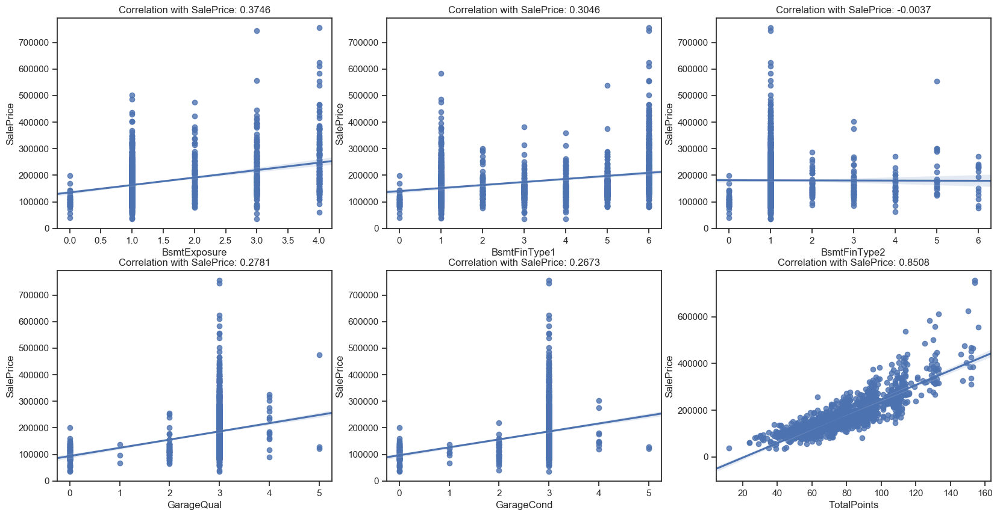

In [71]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='BsmtExposure', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtExposure.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='BsmtFinType1', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType1.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='BsmtFinType2', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType2.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='GarageQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageQual.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='GarageCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageCond.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='TotalPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPoints.corr(df['SalePrice'])))
plt.show()

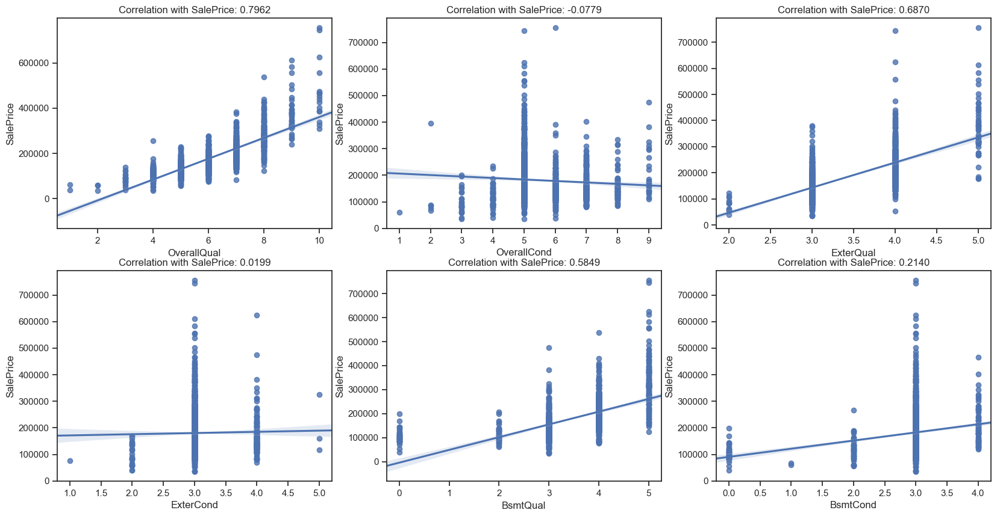

In [72]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='OverallQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallQual.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='OverallCond', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallCond.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='ExterQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='ExterCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterCond.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='BsmtQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtQual.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='BsmtCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtCond.corr(df['SalePrice'])))
plt.show()

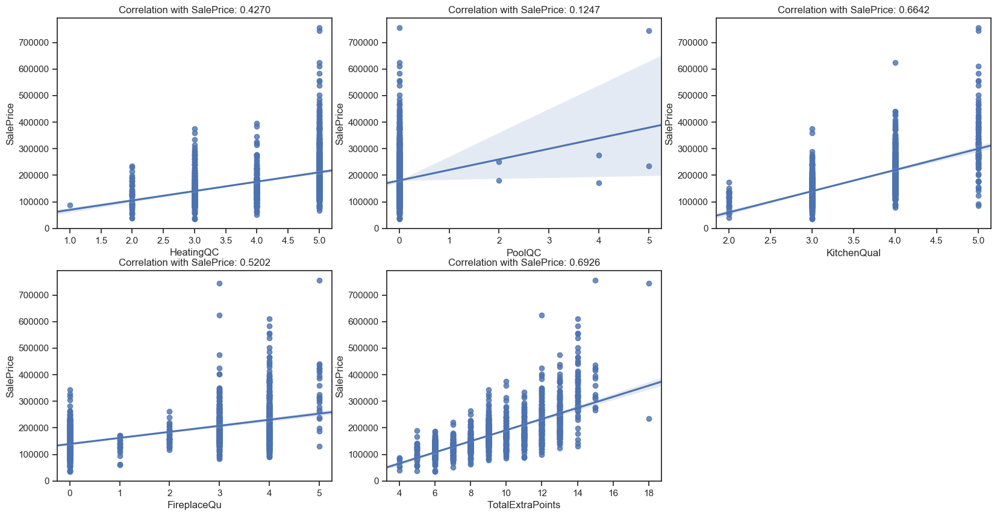

In [73]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='HeatingQC', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.HeatingQC.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='PoolQC', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.PoolQC.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='KitchenQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.KitchenQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='FireplaceQu', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.FireplaceQu.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='TotalExtraPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalExtraPoints.corr(df['SalePrice'])))

plt.show()

In [74]:
all_data['GarageArea_x_Car'] = all_data.GarageArea * all_data.GarageCars

all_data['TotalBsmtSF_x_Bsm'] = all_data.TotalBsmtSF * all_data['1stFlrSF']

# We don´t have a feature with all construct area, maybe it is an interesting feature to create.
all_data['ConstructArea'] = (all_data.TotalBsmtSF + all_data.WoodDeckSF + all_data.GrLivArea +
                             all_data.OpenPorchSF + all_data.TSsnPorch + all_data.ScreenPorch + all_data.EnclosedPorch +
                             all_data.MasVnrArea + all_data.GarageArea + all_data.PoolArea )

#all_data['TotalArea'] = all_data.ConstructArea + all_data.LotArea

all_data['Garage_Newest'] = all_data.YearBuilt > all_data.GarageYrBlt
all_data.Garage_Newest =  all_data.Garage_Newest.apply(lambda x: 1 if x else 0)

all_data['TotalPorchSF'] = all_data.OpenPorchSF + all_data.EnclosedPorch + all_data.TSsnPorch + all_data.ScreenPorch + all_data.WoodDeckSF
all_data.EnclosedPorch = all_data.EnclosedPorch.apply(lambda x: 1 if x else 0)

all_data['LotAreaMultSlope'] = all_data.LotArea * all_data.LandSlope


all_data['BsmtSFPoints'] = (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                            all_data.BsmtFinType1 + all_data.BsmtFinType2)


all_data['BsmtSFMultPoints'] = all_data.TotalBsmtSF * (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                                                       all_data.BsmtFinType1 + all_data.BsmtFinType2)

all_data['TotBathrooms'] = all_data.FullBath + (all_data.HalfBath*0.5) + all_data.BsmtFullBath + (all_data.BsmtHalfBath*0.5)
all_data.FullBath = all_data.FullBath.apply(lambda x: 1 if x else 0)
all_data.HalfBath = all_data.HalfBath.apply(lambda x: 1 if x else 0)
all_data.BsmtFullBath = all_data.BsmtFullBath.apply(lambda x: 1 if x else 0)
all_data.BsmtHalfBath = all_data.BsmtHalfBath.apply(lambda x: 1 if x else 0)

#all_data.Neighborhood = all_data.Neighborhood.map(Neigb)

### One Hot Encode Categorical Features

In [75]:
def one_hot_encode(df):
    categorical_cols = df.select_dtypes(include=['object']).columns

    print(len(categorical_cols), "categorical columns")
    print(categorical_cols)
    # Remove special charactres and withe spaces. 
    for col in categorical_cols:
        df[col] = df[col].str.replace('\W', '').str.replace(' ', '_') #.str.lower()

    dummies = pd.get_dummies(df[categorical_cols], columns = categorical_cols).columns
    df = pd.get_dummies(df, columns = categorical_cols)

    print("Total Columns:",len(df.columns))
    print(df.info())
    
    return df, dummies

all_data, dummies = one_hot_encode(all_data)

27 categorical columns
Index(['MSZoning', 'Alley', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
       'Heating', 'Electrical', 'GarageType', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'ClassPr_S', 'ClassSc_S', 'MA_City',
       'MA_State', 'ValType'],
      dtype='object')
Total Columns: 268
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2908 entries, 0 to 2918
Columns: 268 entries, Id to ValType_P
dtypes: float32(1), float64(30), int64(41), uint8(196)
memory usage: 2.2 MB
None


#### Removing Dummies with  none observations in train or test datasets

In [76]:
# Number of Training Observations
ntrain = data.shape[0]

# Find Dummies with all test observatiosn are equal to 0
ZeroTest = all_data[dummies][ntrain:].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in test dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

# Find dummies with all training observatiosn are equal to 0
ZeroTest = all_data[dummies][:ntrain].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in trainig dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

# Find dummies with the sum of all observatiosn is less than 10
LessTest = all_data[dummies].sum()<10
all_data.drop(dummies[LessTest], axis=1, inplace=True)
print('Dummins in trainig dataset with sum of all observatios less than 10:',len(dummies[LessTest]),'of \n',dummies[LessTest])

del ZeroTest

Dummins in test dataset with all observatios equal to 0: 13 of 
 Index(['Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn',
       'HouseStyle_25Fin', 'RoofMatl_Membran', 'RoofMatl_Metal',
       'RoofMatl_Roll', 'Exterior1st_ImStucc', 'Exterior1st_Stone',
       'Exterior2nd_Other', 'Heating_Floor', 'Heating_OthW', 'Electrical_Mix'],
      dtype='object') 

Dummins in trainig dataset with all observatios equal to 0: 0 of 
 Index([], dtype='object') 

Dummins in trainig dataset with sum of all observatios less than 10: 27 of 
 Index(['Condition1_RRNe', 'Condition1_RRNn', 'Condition2_Artery',
       'Condition2_PosA', 'Condition2_PosN', 'RoofStyle_Shed',
       'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'Exterior1st_AsphShn',
       'Exterior1st_BrkComm', 'Exterior1st_CBlock', 'Exterior2nd_AsphShn',
       'Exterior2nd_CBlock', 'Exterior2nd_Stone', 'Foundation_Wood',
       'Heating_Grav', 'Heating_Wall', 'Electrical_FuseP', 'MiscFeature_Gar2',
       'MiscFeature_Othr', 'SaleType_Con

### Check for any correlations between features
To quantify the linear relationship between the features, I will now create a correlation matrix. 
 
The correlation matrix is identical to a covariance matrix computed from standardized data. The correlation matrix is a square matrix that contains the Pearson product-moment correlation coefficients (often abbreviated as Pearson's r), which measure the linear dependence between pairs of features. Pearson's correlation coefficient can simply be calculated as the covariance between two features x and y (numerator) divided by the product of their standard deviations (denominator):
![image.png](attachment:image.png)
The covariance between standardized features is in fact equal to their linear correlation coefficient.
Use NumPy's corrcoef and seaborn's heatmap function to plot the correlation matrix array as a heat map.

To fit a linear regression model, we are interested in those features that have a high correlation with our target variable. So, I will make a zoom in these features in order of their correlation with SalePrice.

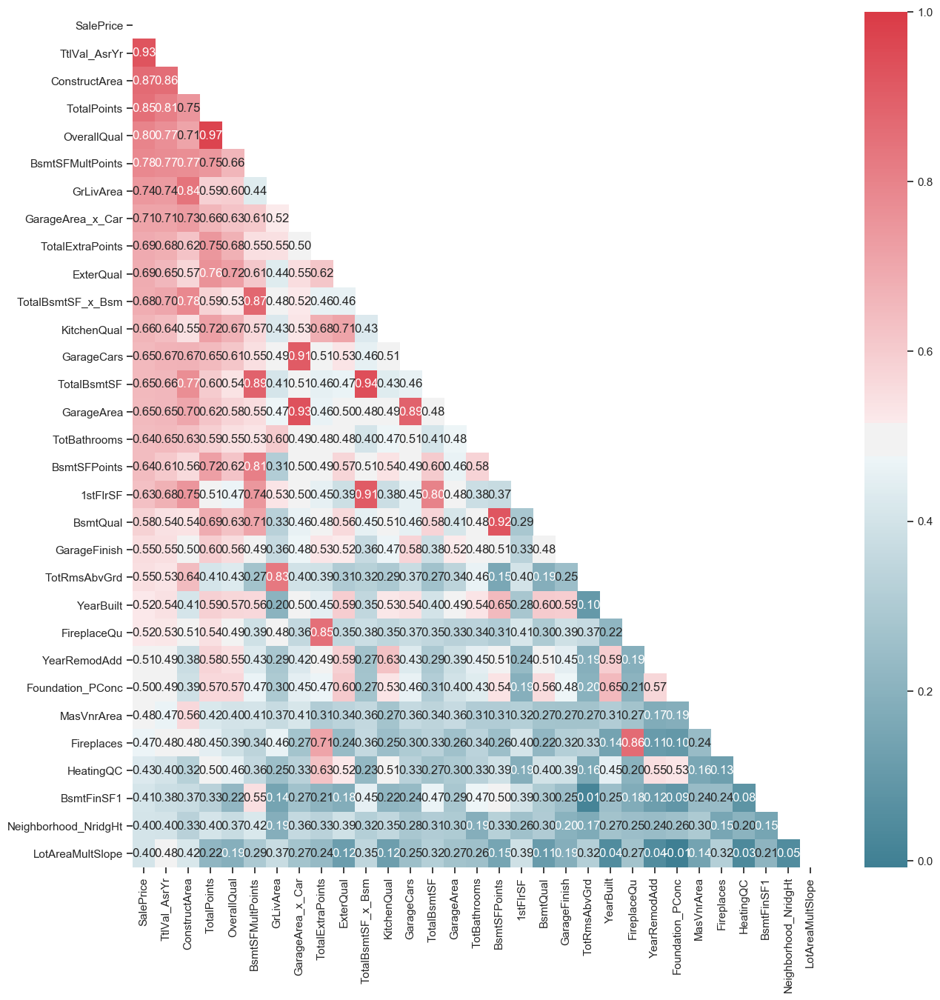

In [77]:
corr = all_data[all_data.SalePrice>1].corr()
top_corr_cols = corr[abs(corr.SalePrice)>=.4].SalePrice.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(15, 15))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=0.7)
plt.show()
del corr, dropSelf, top_corr

We can see that our target variable SalePrice shows the largest correlation with the OverallQual variable (0.79), followed by.  GrLivArea (0.71). This seems to make sense, since in fact we expect the overall quality and size of the living area to have a greater influence on our value judgments about a property.

From the graph above, it also becomes clear the multicollinearity is an issue. 
 - The correlation between GarageCars and GarageArea is very high (0.88), and has very close correlation with the SalePrice. 
 - From total square feet of basement area (TotalBsmtSF) and first Floor square feet (1stFlrSF), we found 0.81 of correlation and same correlation with sale price (0.61).
 - Original construction date (YearBuilt) has a little more correlation with price (0.52) than GarageYrBlt (0.49), and a high correlation between them (0.83)
 - 0.83 is the correlation between total rooms above grade not include bathrooms (TotRmsAbvGrd) and GrLivArea, but TotRmsAbvGrd has only 0.51 of correlation with sale price.
 
Let's see their distributions and type of relation curve between the 10th features with largest correlation with sales price:

#### Drop the features with highest correlations to other Features:

**Colinearity** is the state where two variables are highly correlated and contain similar information about the variance within a given dataset. And as you see above, it is easy to find ***highest collinearities*** (***Personal_Titles_Mrs***, ***Personal_Titles_Mr*** and ***Fare***.

You should always be concerned about the collinearity, regardless of the model/method being linear or not, or the main task being prediction or classification.

Assume a number of linearly correlated covariates/features present in the data set and Random Forest as the method. Obviously, random selection per node may pick only (or mostly) collinear features which may/will result in a poor split, and this can happen repeatedly, thus negatively affecting the performance.

Now, the collinear features may be less informative of the outcome than the other (non-collinear) features and as such they should be considered for elimination from the feature set anyway. However, assume that the features are ranked high in the 'feature importance' list produced by RF. As such they would be kept in the data set unnecessarily increasing the dimensionality. So, in practice, I'd always, as an exploratory step (out of many related) check the pairwise association of the features, including linear correlation.

In [78]:
all_data.drop(['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 'OverallQual', 'GrLivArea', 
               'TotalBsmtSF_x_Bsm', '1stFlrSF', 'PoolArea', 'LotArea', 'GarageYrBlt', 'GarageCond'], axis=1, inplace=True) 

In [79]:
top_corr_cols = top_corr_cols.drop(['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 
                                    'OverallQual', 'GrLivArea', 'TotalBsmtSF_x_Bsm', '1stFlrSF']) 

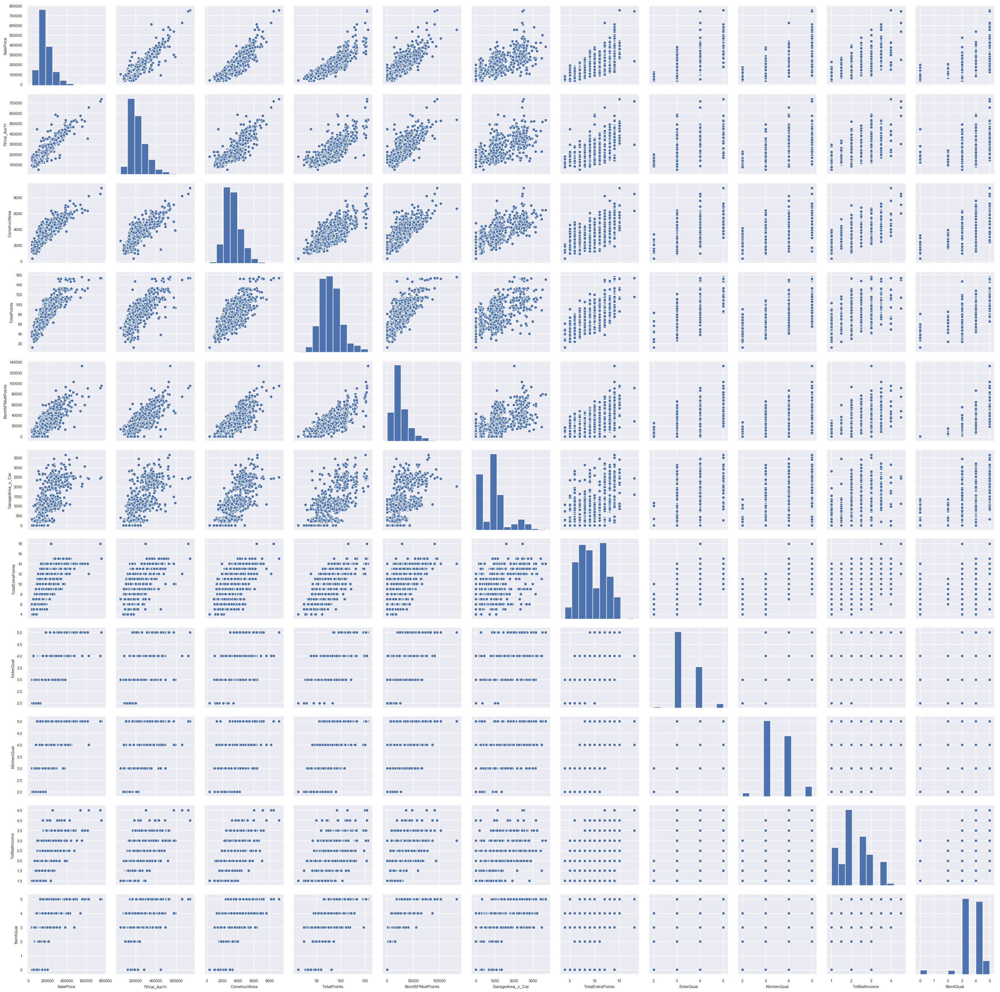

In [80]:
g = sns.pairplot(all_data.loc[all_data.SalePrice>0, top_corr_cols[:11]])

From the pairplot abovewe note some points the need atention, like:
 - Some outliers: GrLivArea, GarageCars, GarageArea, TotalBsmtSF, 1stFlrSF. TotalRmsAbvGrd, YearBuilt and YearRemodAdd, most of then is area featutres. 
   - So, it's possibly reduce this with a little cut of outliers that probably pertain to the same few records.
   - On the other hand, probably we continue to see some of others  outliers after cut this few records. So:
     - it is suggested use of a robust scaler.
     - As an alternative to throwing out outliers, we will look at a robust method of regression using the RANdom SAmple Consensus (RANSAC) algorithm, which fits a regression model to a subset of the data, the so-called inliers.
   - The five observations with higher number of Garage Cars and low price is strange.
 - We can see that most of data appears skewed and some of than has peaks long tails. It is suggest a use of box cox transformation
 - TotalBsmtSF and 1stFlrSf has the same correlation with SalePrice,  although 1stFlrSf appears to have a better angle.
 - The Sale Price appears skewed and hás a long right tail.

#### Identify  and treat multicollinearity:
**Multicollinearity** is more troublesome to detect because it emerges when three or more variables, which are highly correlated, are included within a model, leading to unreliable and unstable estimates of regression coefficients. To make matters worst multicollinearity can emerge even when isolated pairs of variables are not collinear.

To identify, we need start with the coefficient of determination, r<sup>2</sup>, is the square of the Pearson correlation coefficient r. The coefficient of determination, with respect to correlation, is the proportion of the variance that is shared by both variables. It gives a measure of the amount of variation that can be explained by the model (the correlation is the model). It is sometimes expressed as a percentage (e.g., 36% instead of 0.36) when we discuss the proportion of variance explained by the correlation. However, you should not write r<sup>2</sup> = 36%, or any other percentage. You should write it as a proportion (e.g., r<sup>2</sup> = 0.36).

Already the **Variance Inflation Factor** (**VIF**) is a measure of collinearity among predictor variables within a multiple regression.  It is may be calculated for each predictor by doing a linear regression of that predictor on all the other predictors, and then obtaining the R<sup>2</sup> from that regression.  It is calculated by taking the the ratio of the variance of all a given model's betas divide by the variance of a single beta if it were fit alone [1/(1-R<sup>2</sup>)]. Thus, a VIF of 1.8 tells us that the variance (the square of the standard error) of a particular coefficient is 80% larger than it would be if that predictor was completely uncorrelated with all the other predictors. The VIF has a lower bound of 1 but no upper bound. Authorities differ on how high the VIF has to be to constitute a problem (e.g.: 2.50 (R<sup>2</sup> equal to 0.6), sometimes 5 (R<sup>2</sup> equal to .8), or greater than 10 (R<sup>2</sup> equal to 0.9) and so on). 

But there are several situations in which multicollinearity can be safely ignored:

 - ***Interaction terms*** and ***higher-order terms*** (e.g., ***squared*** and ***cubed predictors***) ***are correlated*** with main effect terms because they include the main effects terms. **Ops!** Sometimes we use ***polynomials*** to solve problems, **indeed!** But keep calm, in these cases,  **standardizing** the predictors can **removed the multicollinearity**. 
 - ***Indicator***, like ***dummy*** or ***one-hot-encode***, that represent a ***categorical variable with three or more categories***. If the proportion of cases in the reference category is small, the indicator will necessarily have high VIF's, even if the categorical is not associated with other variables in the regression model. But, you need check if some dummy is collinear or has multicollinearity with other features outside of their dummies.
 - ***Control feature** if the ***feature of interest*** **do not have high VIF's**. Here's the thing about multicollinearity: it's only a problem for the features that are **collinear**. It increases the standard errors of their coefficients, and it may make those coefficients unstable in several ways. But so long as the collinear feature are only used as control feature, and they are not collinear with your feature of interest, there's no problem. The coefficients of the features of interest are not affected, and the performance of the control feature as controls is not impaired.

So, generally, we could run the same model twice, once with severe multicollinearity and once with moderate multicollinearity. This provides a great head-to-head comparison and it reveals the classic effects of multicollinearity. However, when standardizing your predictors doesn't work, you can try other solutions such as:
- removing highly correlated predictors
- linearly combining predictors, such as adding them together
- running entirely different analyses, such as partial least squares regression or principal components analysis

When considering a solution, keep in mind that all remedies have potential drawbacks. If you can live with less precise coefficient estimates, or a model that has a high R-squared but few significant predictors, doing nothing can be the correct decision because it won't impact the fit.

Given the potential for correlation among the predictors, we'll have display the variance inflation factors (VIF), which indicate the extent to which multicollinearity is present in a regression analysis. Hence such variables need to be removed from the model. Deleting one variable at a time and then again checking the VIF for the model is the best way to do this.

So, I start the analysis removed the 3 features with he highest collinearities and the surnames different from my control surname_Alone and correlation with survived less then 0.05, and run VIF.

In [81]:
all_data.rename(columns={'2ndFlrSF':'SndFlrSF'}, inplace=True)

In [82]:
def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['SalePrice'] = y.values

    # get y and X dataframes based on this regression:
    y, X = dmatrices(predict + ' ~' + features, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

# Remove the higest correlations and run a multiple regression
cols = all_data.columns
cols = cols.drop(['Id', 'PID', 'SalePrice'])
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
44,1.179842,MoSold
45,1.264605,YrSold
179,1.417721,SaleType_CWD
25,1.511330,BsmtHalfBath
11,1.524577,ExterCond
32,1.586395,Functional
3,1.591397,Street
26,1.598065,FullBath
4,1.718621,LotShape


From the results, I conclude that can safe maintain the dummies of Embarked, but need work in the remaining features where's the VIF stated as inf. You can see that surname Alone has a VIF of 2.2. We're going to treat it as our baseline and exclude it from our fit. This is done to prevent multicollinearity, or the dummy variable trap caused by including a dummy variable for every single category. let's try remove the dummy alone, that is pretty similar, and check if it solves the other dummies from its category:

In [83]:
# Remove one feature with VIF on Inf from the same category and run a multiple regression
cols = cols.drop(['Alley_NA', 'Neighborhood_Blueste', 'MasVnrType_BrkCmn', 'GarageType_Detchd', 'BldgType_TwnhsE', 
                  'MSZoning_RM', 'Fence_GdPrv', 'LandContour_HLS', 'LotConfig_Corner', 'MA_City_AMES', 'MA_State_others', 
                  'SaleCondition_Abnorml'])

vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
44,1.179842,MoSold
68,1.223597,LotConfig_FR3
45,1.264605,YrSold
160,1.388633,GarageType_CarPort
176,1.398093,SaleCondition_Family
164,1.398353,Fence_MnWw
67,1.407286,LotConfig_FR2
170,1.417721,SaleType_CWD
156,1.433586,GarageType_2Types


In [84]:
# Remove one feature with highest VIF from the same category and run a multiple regression
cols = cols.drop(['ClassSc_S_1STORY1946NEWERALLSTYLES', 'HouseStyle_1Story', 'RoofStyle_Gable',  'Foundation_CBlock'])
                 
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
176,1.158250,ClassPr_S_RESIDENTIAL
44,1.178948,MoSold
68,1.223114,LotConfig_FR3
45,1.263386,YrSold
114,1.308509,RoofStyle_Gambrel
116,1.336103,RoofStyle_Mansard
157,1.383311,GarageType_CarPort
161,1.395209,Fence_MnWw
173,1.397797,SaleCondition_Family


In [85]:
# Remove one feature with highest VIF from the same category and run a multiple regression
cols = cols.drop(['Exterior1st_VinylSd', 'Neighborhood_CollgCr', 'Exterior2nd_VinylSd', 'Neighborhood_OldTown', 
                  'Exterior1st_MetalSd', 'MSSubClass', 'Neighborhood_Edwards', 'Neighborhood_Somerst', 'BldgType_1Fam',
                  'SaleType_New', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalPorchSF', 'WoodDeckSF', 'SndFlrSF', 'MiscFeature_NA'])
              
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
160,1.133511,ClassPr_S_RESIDENTIAL
35,1.143504,TSsnPorch
39,1.156850,MoSold
38,1.209036,MiscVal
62,1.213650,LotConfig_FR3
40,1.242116,YrSold
36,1.248656,ScreenPorch
150,1.260319,MiscFeature_Shed
103,1.275577,RoofStyle_Gambrel


In [86]:
# Remove one feature with highest VIF from the same category and run a multiple regression
cols = cols.drop(['Electrical_SBrkr', 'Electrical_FuseA', 'Condition1_Norm', 'MasVnrType_None', 'MasVnrType_BrkFace', 
                  'Exterior1st_CemntBd', 'Exterior2nd_CmentBd'])
              
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
35,1.117536,TSsnPorch
153,1.131256,ClassPr_S_RESIDENTIAL
39,1.149071,MoSold
62,1.172616,LotConfig_FR3
38,1.208181,MiscVal
87,1.211792,Condition1_PosN
86,1.217090,Condition1_PosA
40,1.235978,YrSold
88,1.241679,Condition1_RRAe


In [87]:
# Remove one feature with highest VIF from the same category and run a multiple regression
cols = cols.drop(['TotalExtraPoints', 'GarageQual', 'PoolQC', 'ClassSc_S_112STORYFINISHEDALLAGES', 
                   'ClassSc_S_SPLITORMULTILEVEL', 'YearBuilt', 'HouseStyle_SLvl', 'ValType_F', 
                   'ClassSc_S_2STORY1946NEWER', 'BsmtSFMultPoints', 'HouseStyle_2Story', 'GarageType_NA'])
              
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000000,Intercept
145,1.081875,ClassPr_S_RESIDENTIAL
33,1.106128,TSsnPorch
36,1.136393,MoSold
57,1.164867,LotConfig_FR3
159,1.179929,ValType_B
161,1.184059,ValType_P
35,1.193883,MiscVal
82,1.196059,Condition1_PosN
34,1.203135,ScreenPorch


### Transform Years to Ages and Create Flags to New and Remod

In [88]:
def AgeYears(feature): 
    return feature.apply(lambda x: 0 if x==0 else (2011 - x))

def categoricalYears(feature):
    feature = feature.apply(lambda x: 'New' if x>=2006 else 
                                      '2000-2005' if x>=2000 else 
                                      '1990-2000' if x>=1990 else 
                                      '1980-1990' if x>=1980 else 
                                      '1970-1980' if x>=1970 else 
                                      '1960-1970' if x>=1960 else 
                                      '1950-1960' if x>=1950 else 
                                      '1900-1950' if x>=1900 else 
                                      'None' if x == 0 else
                                      'Before 1900' )
    return feature


all_data.YearBuilt = AgeYears(all_data.YearBuilt)
all_data.YearRemodAdd = AgeYears(all_data.YearRemodAdd)
#all_data.GarageYrBlt = AgeYears(all_data.GarageYrBlt) 
all_data.YrSold =  AgeYears(all_data.YrSold) # all_data.YrSold.apply(str) 

Altogether, there are 3 variables that are relevant with regards to the Age of a house; YearBlt, YearRemodAdd, and YearSold. YearRemodAdd defaults to YearBuilt if there has been no Remodeling/Addition. I will use YearRemodeled and YearSold to determine the Age. However, as parts of old constructions will always remain and only parts of the house might have been renovated, I will also introduce a Remodeled Yes/No variable. This should be seen as some sort of penalty parameter that indicates that if the Age is based on a remodeling date, it is probably worth less than houses that were built from scratch in that same year.

In [89]:
all_data['Remod'] = 2
all_data.loc[(all_data.YearBuilt==all_data.YearRemodAdd), ['Remod']] = 0
all_data.loc[(all_data.YearBuilt!=all_data.YearRemodAdd), ['Remod']] = 1

all_data.Age = all_data.YearRemodAdd - all_data.YrSold # sice I convert both to age

all_data["IsNew"] = 2
all_data.loc[(all_data.YearBuilt==all_data.YrSold), ['IsNew']] = 1
all_data.loc[(all_data.YearBuilt!=all_data.YrSold), ['IsNew']] = 0

### Defining Categorical Data as Category

In order that the models do not make inappropriate use of features transformed into numbers and apply only calculations relevant to categorical, we have to transform their type into category type

In [90]:
# Reserve a copy for futer analysis:
df_copy = all_data[all_data.SalePrice>0].copy()

all_data.CentralAir = all_data.CentralAir.astype('category')
all_data.Street = all_data.Street.astype('category')
all_data.Garage_Newest = all_data.Garage_Newest.astype('category')
all_data.EnclosedPorch = all_data.EnclosedPorch.astype('category')
all_data.FullBath = all_data.FullBath.astype('category')
all_data.HalfBath = all_data.HalfBath.astype('category')
all_data.BsmtFullBath = all_data.BsmtFullBath.astype('category')
all_data.BsmtHalfBath = all_data.BsmtHalfBath.astype('category')
all_data.Remod = all_data.Remod.astype('category')
all_data.IsNew = all_data.IsNew.astype('category') # bool
all_data.MSSubClass = all_data.MSSubClass.astype('category')
all_data.MoSold = all_data.MoSold.astype('category')
for feat in cols:
    if all_data[feat].dtype=='uint8':
        all_data[feat] = all_data[feat].astype('category')

## Box cox transformation of highly skewed features
A Box Cox transformation is a way to transform non-normal dependent variables into a normal shape. 

Why does this matter?
- **Model bias and spurious interactions**: If you are performing a regression or any statistical modeling, this asymmetrical behavior may lead to a bias in the model. If a factor has a significant effect on the average, because the variability is much larger, many factors will seem to have a stronger effect when the mean is larger. This is not due, however, to a true factor effect but rather to an increased amount of variability that affects all factor effect estimates when the mean gets larger. This will probably generate spurious interactions due to a non-constant variation, resulting in a **very complex model** with many **spurious** and **unrealistic** interactions.
- **Normality is an important assumption for many statistical techniques**: such as individuals control charts, Cp/Cpk analysis, t-tests and analysis of variance (ANOVA). A substantial departure from normality will bias your capability estimates.

One solution to this is to transform your data into normality using a [Box-Cox transformation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.boxcox.html) means that you are able to run a broader number of tests.

At the core of the Box Cox transformation is an exponent, lambda (λ), which varies from -5 to 5. All values of λ are considered and the optimal value for your data is selected; The 'optimal value' is the one which results in the best approximation of a normal distribution curve. The transformation of Y has the form:
<a href="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcox.png"><img src="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcox.png" alt="" width="222" height="70" class="aligncenter size-full wp-image-13940" /></a>

The scipy implementation proceeded with this formula, then you need before take care of negatives values if you have. A common technique for handling negative values is to add a constant value to the data prior to applying the log transform. The transformation is therefore log(Y+a) where a is the constant. Some people like to choose a so that min(Y+a) is a very small positive number (like 0.001). Others choose a so that min(Y+a) = 1. For the latter choice, you can show that a = b – min(Y), where b is either a small number or is 1.
This test only works for positive data. However, Box and Cox did propose a second formula that can be used for negative y-values, not implemented in scipy:
<a href="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcoxNeg.png"><img src="http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/boxcoxNeg.png" alt="" width="272" height="76" class="aligncenter size-full wp-image-13941" /></a>
The formula are deceptively simple. Testing all possible values by hand is unnecessarily labor intensive.

<p align='center'> Common Box-Cox Transformations 
</p>

| Lambda value (λ) | Transformed data (Y’) |
|------------------|-----------------------|
|        -3	       | Y\*\*-3 = 1/Y\*\*3    |
|        -2        | Y\*\*-2 = 1/Y\*\*2    |
|        -1        | Y\*\*-1 = 1/Y         |
|       -0.5       | Y\*\*-0.5 = 1/(√(Y))  |
|         0        | log(Y)(\*)            |
|        0.5       | Y0.5 = √(Y)           |
|         1        | Y\*\*1 = Y            |
|         2        | Y\*\*2                |
|         3        | Y\*\*3                |

(\*)Note: the transformation for zero is log(0), otherwise all data would transform to Y\*\*0 = 1.
The transformation doesn't always work well, so make sure you check your data after the transformation with a normal probability plot or if the skew are reduced, tending to zero.

In [92]:
numeric_features = list(all_data.loc[:, cols].dtypes[all_data.dtypes != "category"].index)
numeric_features.remove('TtlVal_AsrYr')
'''
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=RuntimeWarning)
'''
skewed_features = all_data[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    all_data[feat], l_opt[feat] = boxcox((all_data[feat]+1))

skewed_features2 = all_data[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 24 higest skewed numerical features to box cox transform


,Skew,New Skew
MiscVal,21.749816,4.772310
LowQualFinSF,12.383523,8.460360
TSsnPorch,11.497556,8.819882
KitchenAbvGr,4.348505,-2.059399
BsmtFinSF2,4.130274,2.343620
ScreenPorch,3.947821,2.915483
LotAreaMultSlope,3.493809,0.136331
BsmtFinType2,3.147178,-0.433887
MasVnrArea,2.621822,0.456830
OpenPorchSF,2.528983,-0.025044


As you can see, we were able at first to bring the numerical values closer to normal. Let's take a look at the QQ test of these features.

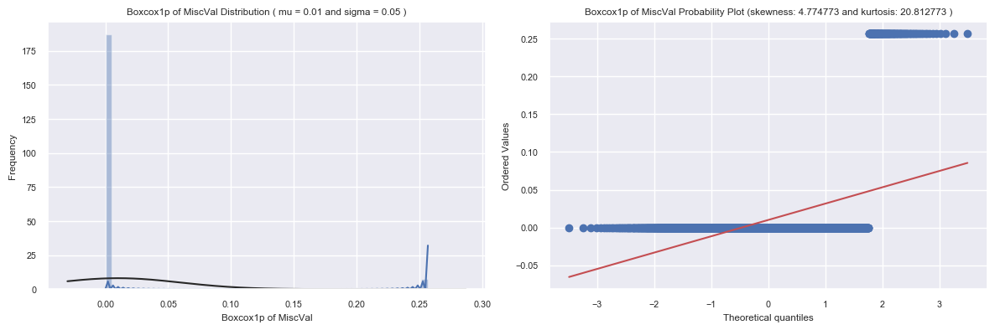

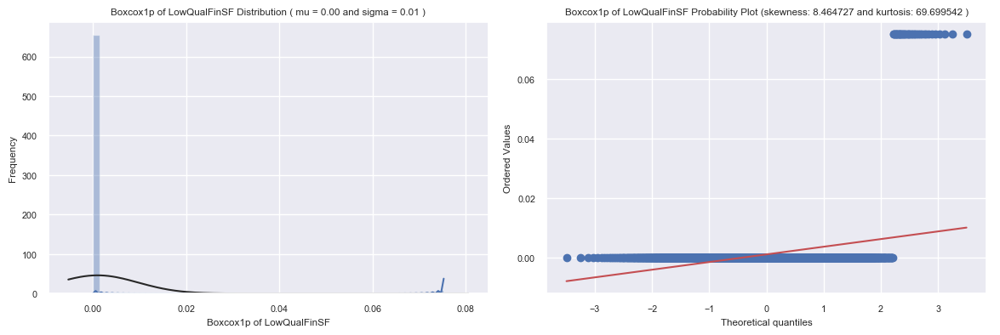

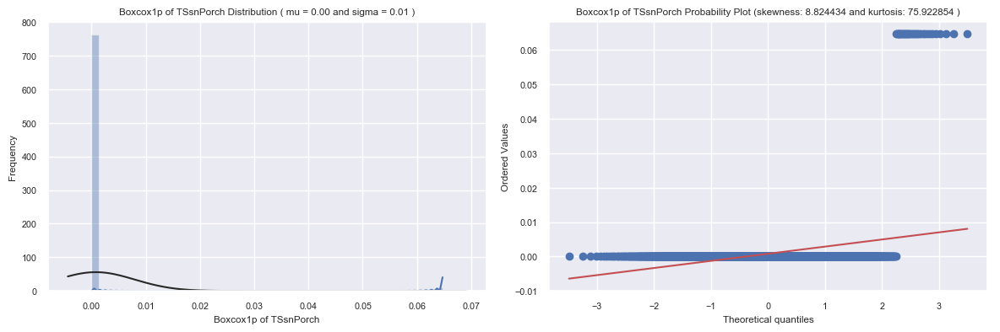

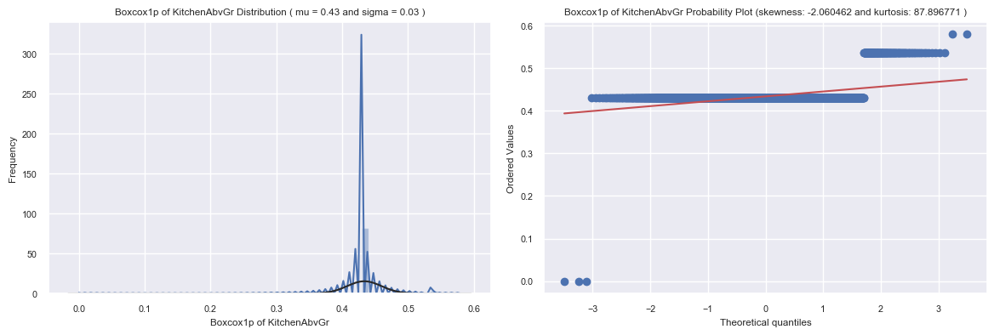

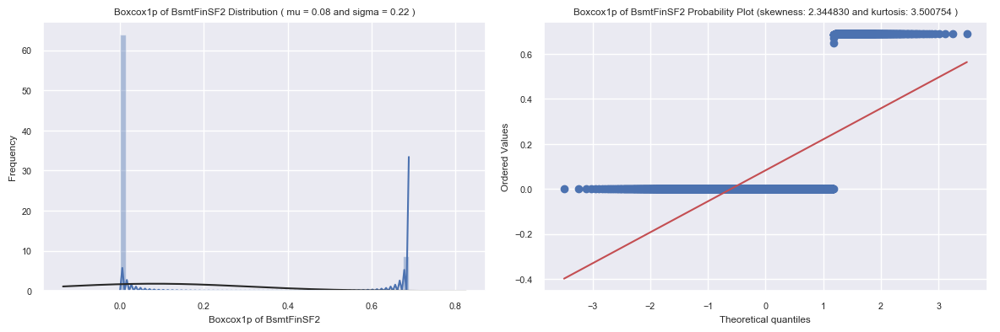

...

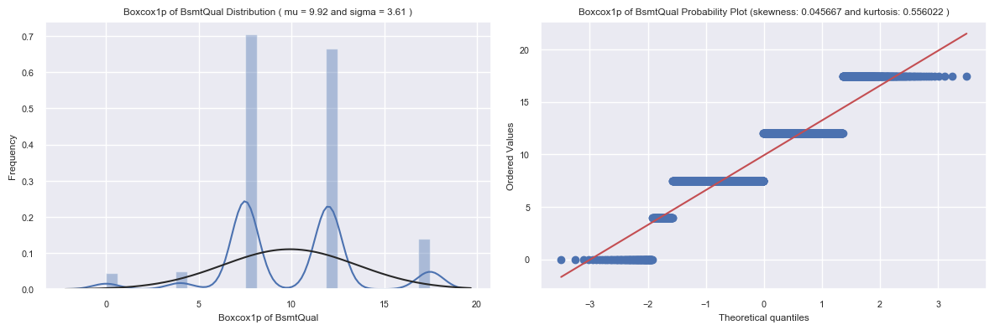

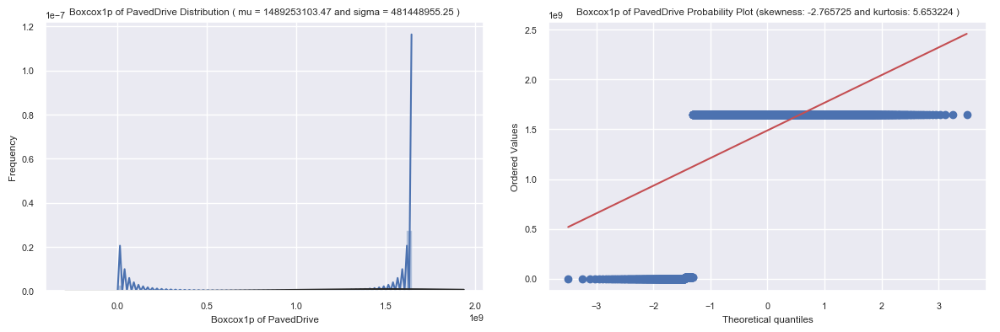

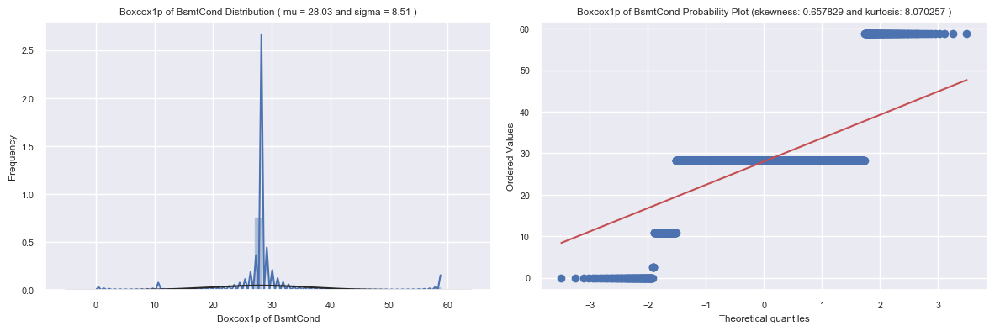

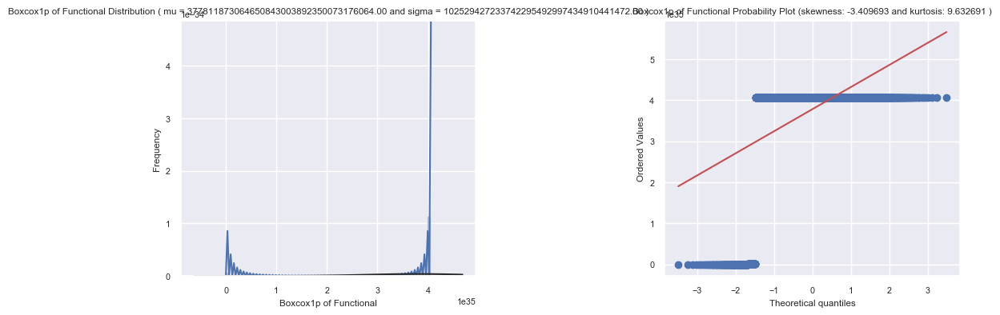

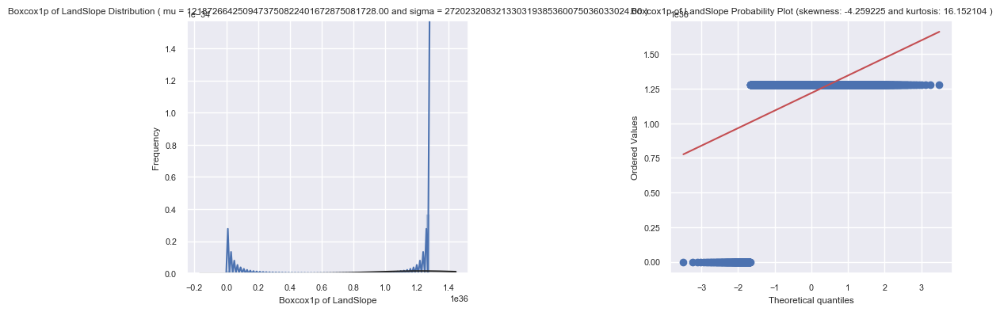

In [93]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(all_data[feat], ('Boxcox1p of {}'.format(feat)))

## Evaluate Apply Polyfit at the more Correlated Features 

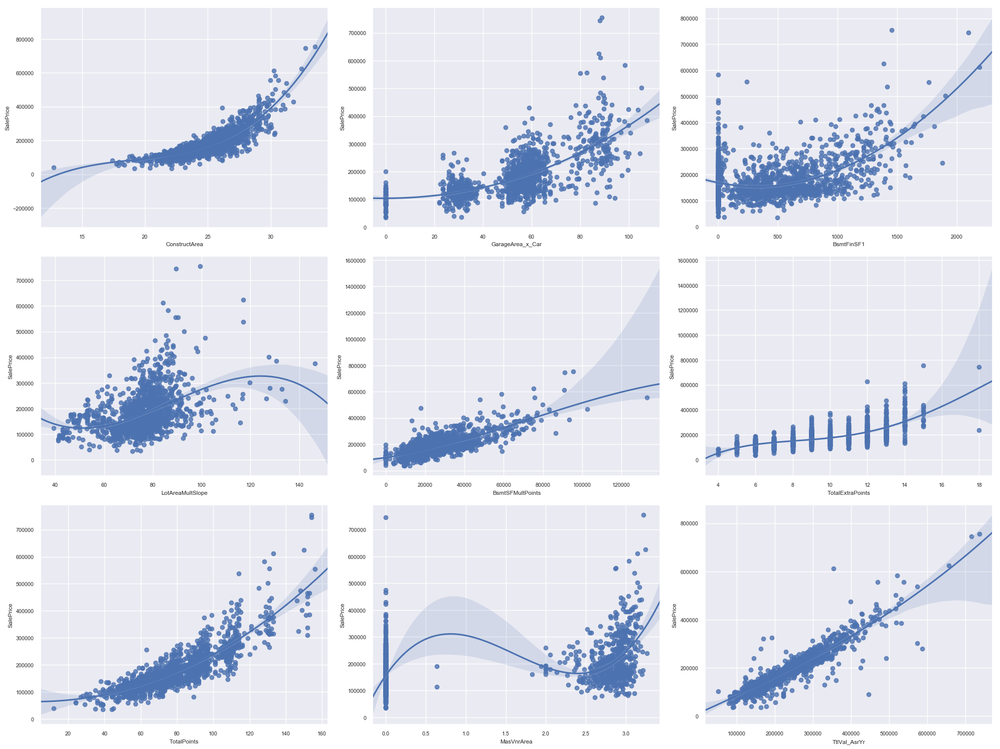

In [94]:
fig = plt.figure(figsize=(20,15)) 
ax = fig.add_subplot(331); g = sns.regplot(y='SalePrice', x='ConstructArea', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(332); g = sns.regplot(y='SalePrice', x='GarageArea_x_Car', data = all_data[all_data.SalePrice>0], order=3)
ax = fig.add_subplot(333); g = sns.regplot(y='SalePrice', x='BsmtFinSF1', data = all_data[all_data.SalePrice>0], order=3)
ax = fig.add_subplot(334); g = sns.regplot(y='SalePrice', x='LotAreaMultSlope', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(335); g = sns.regplot(y='SalePrice', x='BsmtSFMultPoints', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(336); g = sns.regplot(y='SalePrice', x='TotalExtraPoints', data = all_data[all_data.SalePrice>0], order=4) 
ax = fig.add_subplot(337); g = sns.regplot(y='SalePrice', x='TotalPoints', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(338); g = sns.regplot(y='SalePrice', x='MasVnrArea', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(339); g = sns.regplot(y='SalePrice', x='TtlVal_AsrYr', data = all_data[all_data.SalePrice>0], order=3) 

plt.tight_layout() 

## Evaluating Polynomilas Options Performance
One way to account for the violation of linearity assumption is to use a polynomial regression model by adding polynomial terms:
![image.png](attachment:image.png)
Here, d denotes the degree of the polynomial. Although we can use polynomial regression to model a nonlinear relationship, it is still considered a multiple linear regression model because of the linear regression coefficients w.

We should be aware that adding more and more polynomial features increases the complexity of a model and therefore increases the chance of overfitting.

In [95]:
def poly(X, y, feat=''):

    # Initializatin of regression models
    regr = LinearRegression()
    regr = regr.fit(X, y)
    y_lin_fit = regr.predict(X)
    linear_r2 = r2_score(y, regr.predict(X))

    # create polynomial features
    quadratic = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
    cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
    fourth = PolynomialFeatures(degree=4, interaction_only=False, include_bias=False)
    fifth = PolynomialFeatures(degree=5, interaction_only=False, include_bias=False)
    X_quad = quadratic.fit_transform(X)
    X_cubic = cubic.fit_transform(X)
    X_fourth = fourth.fit_transform(X)
    X_fifth = fifth.fit_transform(X)

    # quadratic fit
    regr = regr.fit(X_quad, y)
    y_quad_fit = regr.predict(quadratic.fit_transform(X))
    quadratic_r2 = r2_score(y, y_quad_fit)

    # cubic fit
    regr = regr.fit(X_cubic, y)
    y_cubic_fit = regr.predict(cubic.fit_transform(X))
    cubic_r2 = r2_score(y, y_cubic_fit)

    # Fourth fit
    regr = regr.fit(X_fourth, y)
    y_fourth_fit = regr.predict(fourth.fit_transform(X))
    four_r2 = r2_score(y, y_fourth_fit)

    # Fifth fit
    regr = regr.fit(X_fifth, y)
    y_fifth_fit = regr.predict(fifth.fit_transform(X))
    five_r2 = r2_score(y, y_fifth_fit)
    
    if len(feat)>0:
        fig = plt.figure(figsize=(20,5))
        # Plot lowest Polynomials
        fig1 = fig.add_subplot(121)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=0.5, linestyle=':')
        plt.plot(X[feat], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, color='red', lw=0.5, linestyle='-')
        plt.plot(X[feat], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2,  color='green', lw=0.5, linestyle='--')

        plt.xlabel(feat)
        plt.ylabel('Log1P Sale Price')
        plt.legend(loc='upper left')

        # Plot higest Polynomials
        fig2 = fig.add_subplot(122)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=2, linestyle=':')
        plt.plot(X[feat], y_fifth_fit, label='Fifth (d=5), $R^2=%.3f$' % five_r2, color='yellow', lw=2, linestyle='-')
        plt.plot(X[feat], y_fifth_fit, label='Fourth (d=4), $R^2=%.3f$' % four_r2, color='red', lw=2, linestyle=':')

        plt.xlabel(feat)
        plt.ylabel('Log1P Sale Price')
        plt.legend(loc='upper left')
    else:
        # Plot initialisation
        fig = plt.figure(figsize=(30,10))
        ax = fig.add_subplot(121, projection='3d')
        ax.scatter(X.iloc[:, 0], X.iloc[:, 1], y, s=40)

        # make lines of the regressors:
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, 
                 color='blue', lw=2, linestyle=':')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, 
                 color='red', lw=0.5, linestyle='-')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2, 
                 color='green', lw=0.5, linestyle='--')
        # label the axes
        ax.set_xlabel(X.columns[0])
        ax.set_ylabel(X.columns[1])
        ax.set_zlabel('Log1P Sales Price')
        ax.set_title("Poly up to 3 degree")
        plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

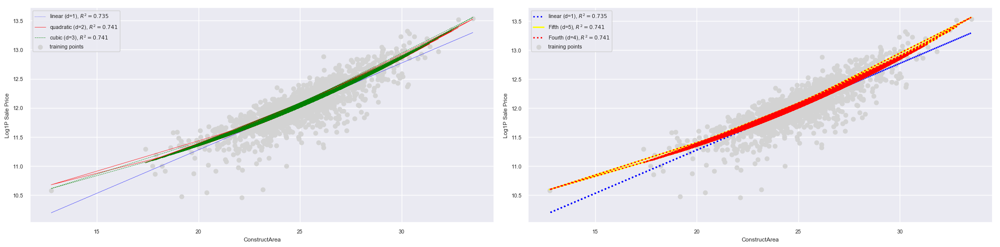

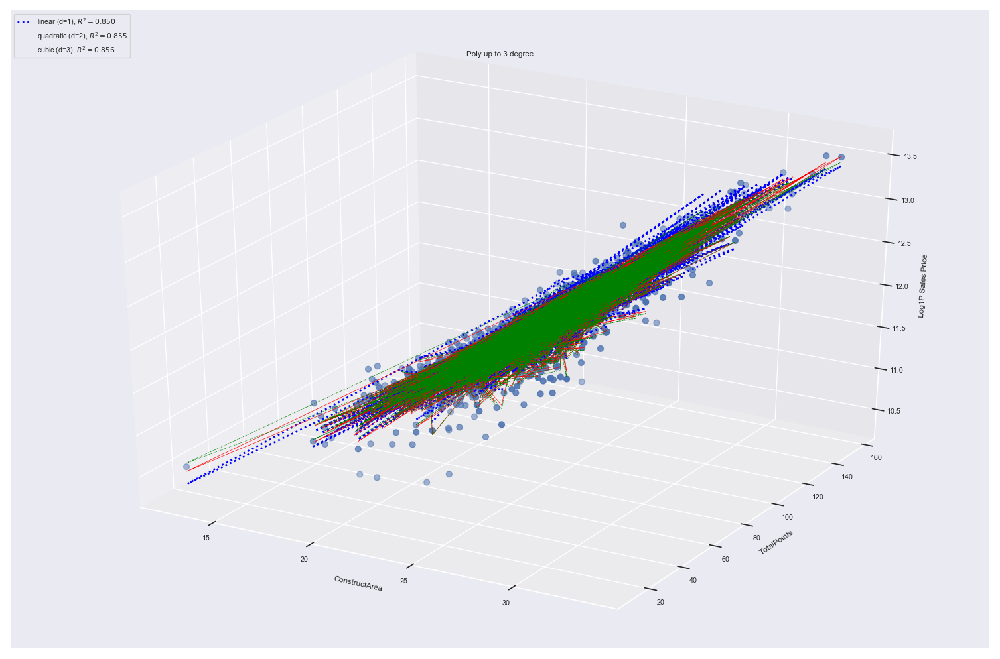

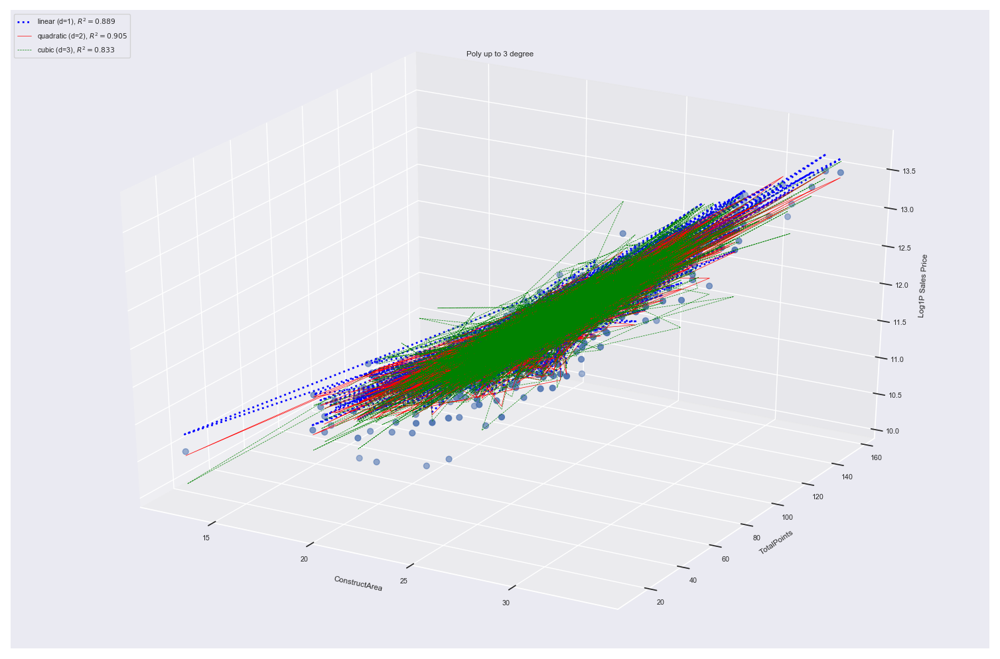

In [96]:
y = np.log1p(all_data.SalePrice[all_data.SalePrice>0])
X = all_data.loc[all_data.SalePrice>0, ['ConstructArea']] 
poly(X, y, 'ConstructArea')

X = all_data.loc[all_data.SalePrice>0, ['ConstructArea', 'TotalPoints']] 
poly(X, y)

X = all_data.loc[all_data.SalePrice>0, ['ConstructArea', 'TotalPoints', 'BsmtSFMultPoints', 'TtlVal_AsrYr', 'BsmtFinSF1',
                                        'TotalExtraPoints', 'LotAreaMultSlope', 'MasVnrArea', 'GarageArea_x_Car']] 
poly(X, y)

## Create Degree 3 Polynomial Features

In [97]:
poly_cols = ['ConstructArea', 'TotalPoints', 'BsmtSFMultPoints', 'TtlVal_AsrYr', 'BsmtFinSF1',
             'TotalExtraPoints', 'LotAreaMultSlope', 'MasVnrArea', 'GarageArea_x_Car']

# Separete Trainig and Test Datasets and Dependent Variabel

In [98]:
#ntrain = data.shape[0]
train = all_data.loc[(all_data.SalePrice>0), cols].reset_index(drop=True, inplace=False)
y_train = np.log1p(all_data.SalePrice[all_data.SalePrice>0].reset_index(drop=True, inplace=False))
#train = train.drop(['Id', 'PID'], axis=1)
test = all_data.loc[(all_data.SalePrice==0), cols].reset_index(drop=True, inplace=False)
Test_ID = all_data.loc[(all_data.SalePrice==0), 'Id'].reset_index(drop=True, inplace=False)
#test = test.drop(['Id', 'PID'], axis=1)

# Select Features
[ver](https://stats.stackexchange.com/questions/253334/how-to-solve-multicollinearity-problem-in-a-linear-regression)
It is important to consider feature selection a part of the model selection process. If you do not, you may inadvertently introduce bias into your models which can result in overfitting.

Compare several feature selection methods, including your new idea, correlation coefficients, backward selection and embedded methods. Use linear and non-linear predictors. Select the best approach with model selection.

Feature selection methods can be used to identify and remove unneeded, irrelevant and redundant attributes from data that do not contribute to the accuracy of a predictive model or may in fact decrease the accuracy of the model.

All of the features we find in the dataset might not be useful in building a machine learning model to make the necessary prediction. Using some of the features might even make the predictions worse. 
![selectFeat](http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/Select_features.png)
Often in data science we have hundreds or even millions of features and we want a way to create a model that only includes the most important features. This has three benefits.

1. It reduces the variance of the model, and therefore overfitting.
2. It reduces the complexity of a model and makes it easier to interpret.
3. It improves the accuracy of a model if the right subset is chosen.
4.Finally, it reduces the computational cost (and time) of training a model.
So, an alternative way to reduce the complexity of the model and avoid overfitting is dimensionality reduction via feature selection, which is especially useful for unregularized models. There are two main categories of dimensionality reduction techniques: feature selection and feature extraction. Using feature selection, we select a subset of the original features. In feature extraction, we derive information from the feature set to construct a new feature subspace.

Exist various methodologies and techniques that you can use to subset your feature space and help your models perform better and efficiently. So, let's get started.

## Prepare Data to Select Features

In [103]:
cols = train.columns

scale = RobustScaler()
df = pd.DataFrame(scale.fit_transform(train), columns= cols)

### Wrapper Methods
In wrapper methods, we try to use a subset of features and train a model using them. Based on the inferences that we draw from the previous model, we decide to add or remove features from your subset. The problem is essentially reduced to a search problem. 

The two main disadvantages of these methods are : 
- The increasing overfitting risk when the number of observations is insufficient.
- These methods are usually computationally very expensive.

#### Backward Elimination
In backward elimination, we start with all the features and removes the least significant feature at each iteration which improves the performance of the model. We repeat this until no improvement is observed on removal of features.

We will see below row implementation of backward elimination, one to select by P-values and other based on the accuracy of a model the we submitted to it.

##### Backward Elimination By P-values

The **P-value**, or probability value, or asymptotic significance, is a **probability** value for a given **statistical model** that, ***if the null hypothesis is true***, a set of statistical observations more commonly known as **the statistical summary** <i>is greater than or equal in magnitude to</i> **the observed results**.

The **null hypothesis** is a general statement that **there is no relationship between two measured phenomena**.

For example, if the correlation is very small and furthermore, the p-value is high meaning that it is very likely to observe such correlation on a dataset of this size purely by chance.

But you need to be careful how you interpret the statistical significance of a correlation. If your correlation coefficient has been determined to be statistically significant this does not mean that you have a strong association. It simply tests the null hypothesis that there is no relationship. By rejecting the null hypothesis, you accept the alternative hypothesis that states that there is a relationship, but with no information about the strength of the relationship or its importance.

Since removal of different features from the dataset will have different effects on the p-value for the dataset, we can remove different features and measure the p-value in each case. These measured p-values can be used to decide whether to keep a feature or not.

From statsmodels.api, the [linear models](https://www.statsmodels.org/dev/regression.html) allows estimation by ordinary least squares ([OLS](https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html)), weighted least squares ([WLS](https://www.statsmodels.org/dev/examples/notebooks/generated/wls.html)), generalized least squares ([GLS](https://www.statsmodels.org/dev/examples/notebooks/generated/gls.html)), and feasible generalized [recursive least squares](https://www.statsmodels.org/dev/examples/notebooks/generated/recursive_ls.html) with autocorrelated AR(p) errors.

Next we make the test of a ***Linear regression*** to check the result and **select features** based on its the **P-value**:

In [104]:
ln_model=sm.OLS(y_train,df)
result=ln_model.fit()
print(result.summary2())

                              Results: Ordinary least squares
Model:                       OLS                      Adj. R-squared:             -814.277  
Dependent Variable:          SalePrice                AIC:                        11167.9196
Date:                        2018-10-03 19:46         BIC:                        11178.4769
No. Observations:            1449                     Log-Likelihood:             -5582.0   
Df Model:                    1                        F-statistic:                -1445.    
Df Residuals:                1447                     Prob (F-statistic):         1.00      
R-squared:                   -813.714                 Scale:                      130.07    
--------------------------------------------------------------------------------------------
                                             Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
--------------------------------------------------------------------------------------------
LotFront

Like before, I excluded one by one of the features with the highest P-value and run again until get only P-values up to 0.05, but here I use a backward elimination process.

In [106]:
pv_cols = cols.values

def backwardElimination(x, Y, sl, columns):
    numVars = x.shape[1]
    for i in range(0, numVars):
        regressor = sm.OLS(Y, x).fit()
        maxVar = max(regressor.pvalues) #.astype(float)
        if maxVar > sl:
            for j in range(0, numVars - i):
                if (regressor.pvalues[j].astype(float) == maxVar):
                    columns = np.delete(columns, j)
                    x = x.loc[:, columns]
                    
    print('\nSelect {:d} features from {:d} by best p-values.'.format(len(columns), len(pv_cols)))
    print('The max p-value from the features selecte is {:.3f}.'.format(maxVar))
    print(regressor.summary())
    
    # odds ratios and 95% CI
    conf = np.exp(regressor.conf_int())
    conf['Odds Ratios'] = np.exp(regressor.params)
    conf.columns = ['2.5%', '97.5%', 'Odds Ratios']
    display(conf)
    
    return columns, regressor

SL = 0.05

pv_cols, LR = backwardElimination(df, y_train, SL, pv_cols)


Select 150 features from 161 by best p-values.
The max p-value from the features selecte is 0.000.
                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                    -813.714
Model:                            OLS   Adj. R-squared:               -814.277
Method:                 Least Squares   F-statistic:                    -1445.
Date:                Wed, 03 Oct 2018   Prob (F-statistic):               1.00
Time:                        19:47:48   Log-Likelihood:                -5582.0
No. Observations:                1449   AIC:                         1.117e+04
Df Residuals:                    1447   BIC:                         1.118e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975

,2.5%,97.5%,Odds Ratios
LotFrontage,1.0,1.0,1.0
Street,1.0,1.0,1.0
LotShape,1.0,1.0,1.0
LandSlope,1.0,1.0,1.0
OverallCond,1.0,1.0,1.0
YearRemodAdd,1.0,1.0,1.0
MasVnrArea,1.0,1.0,1.0
ExterQual,1.0,1.0,1.0
ExterCond,1.0,1.0,1.0
BsmtQual,1.0,1.0,1.0


##### Select Features by Statistical Methods: mutual_info_regression

This function estimated mutual information (MI) between each feature and the continuous target. The MI between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

The function relies on nonparametric methods based on entropy estimation from k-nearest neighbors distances.

From the results, we can highlight:
- we're very confident about some relationship between the probability of being survived:
 - there is an inverse  relationship with class, Age and genre of the passenger.
 - there is an positive relationship, from greater to low, with non relatives, Kids, passenger fare and distinction in name of the passenger.

- From the coefficient:
 - Non relatives, we confirm that fellows or companions of families had better chances to survived.
 - As we saw in the EDA, passengers who embarked on S had a higher fatality rate.  
 - The model is only able to translate a single straight line by variable, obviously pondered by the others. Then he points out that the greater the number of passengers with the same ticket, the greater the likelihood of death. As seen through the [ticket EDA](#Tikect), this is partly true, however, this coefficient does not adequately capture the fact that the chances of survival increase from 1 to 3 passengers with the same ticket. As you can see above, the model balances this through the variables of family relationships. However, this is a good example of why you should not ignore the EDA phase, and above all do not rely on a conclusion based on a single fact or point of view. Remember, models are not full truths, and possess precision, confident and accuracy!
 
Take the **exponential** of each of the **coefficients** to generate the ***odds ratios***. This tells you how a 1 unit increase or decrease in a variable affects the odds of being survived. For example, we can expect the odds of being survived to decrease by about 69.5% if the passenger embarked on S. Go back to the [embarked EDA](#Embarked) and see that this hits the stacked bar chart.

You must be wondering, after all, this model has how much of accuracy?

Although we did not do cross validation or even split, let's take a look, redeem the probabilities generated by it and take advantage to see how we can plot the results of models that return probabilities, so we can refine our perception much more than simply evaluate p-value, coefficients, accuracy, etc.

Fvalue: -1445.223916
MSE total on the train data: 0.1595


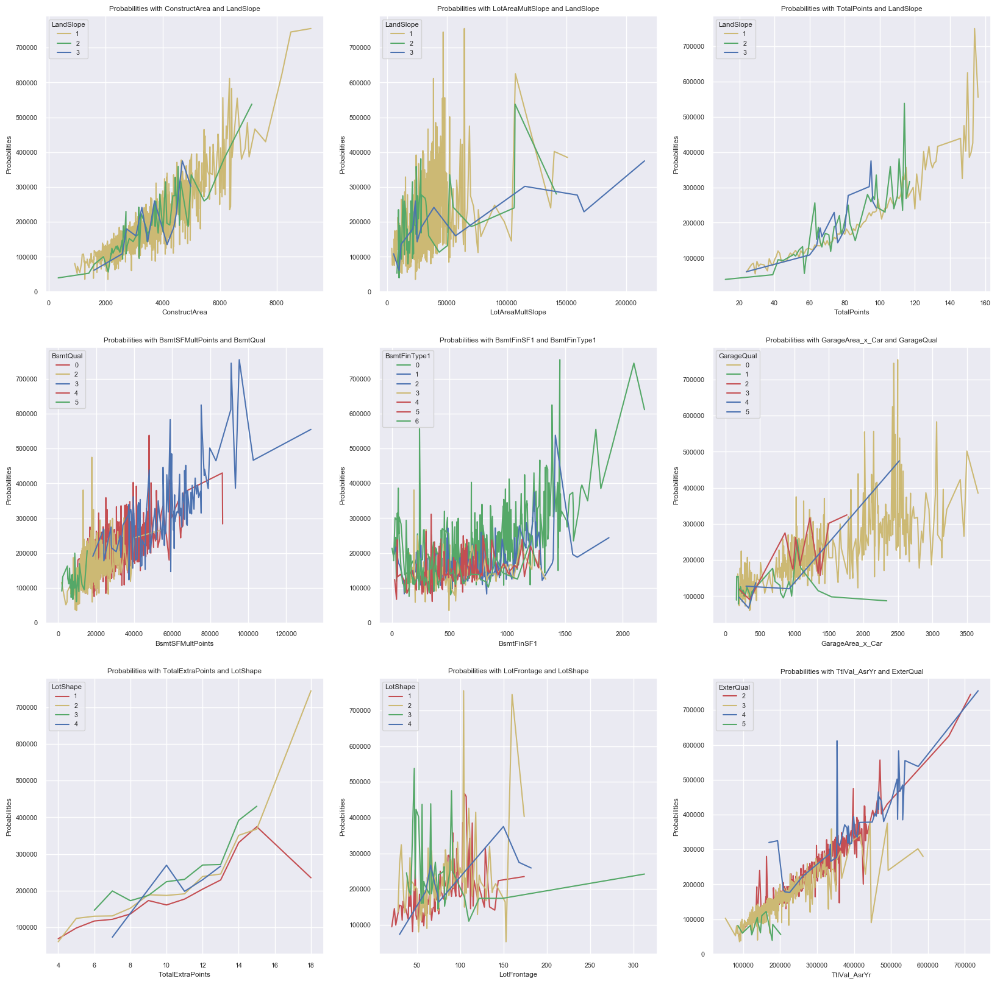

In [101]:
pred = LR.predict(df[pv_cols])

df_copy['proba'] = pred
y_pred = pred.apply(lambda x: 1 if x > 0.5 else 0)

print('Fvalue: {:.6f}'.format(LR.fvalue))
print('MSE total on the train data: {:.4f}'.format(LR.mse_total))
def plot_proba(continous, predict, discret, data):
    grouped = pd.pivot_table(data, values=[predict], index=[continous, discret], aggfunc=np.mean)
    colors = 'rbgyrbgy'
    for col in data[discret].unique():
        plt_data = grouped.ix[grouped.index.get_level_values(1)==col]
        plt.plot(plt_data.index.get_level_values(0), plt_data[predict], color=colors[int(col)])
    plt.xlabel(continous)
    plt.ylabel("Probabilities")
    plt.legend(np.sort(data[discret].unique()), loc='upper left', title=discret)
    plt.title("Probabilities with " + continous + " and " + discret)

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(331); plot_proba('ConstructArea', 'SalePrice', 'LandSlope', df_copy)
ax = fig.add_subplot(332); plot_proba('LotAreaMultSlope', 'SalePrice', 'LandSlope', df_copy)
ax = fig.add_subplot(333); plot_proba('TotalPoints', 'SalePrice', 'LandSlope', df_copy)
ax = fig.add_subplot(334); plot_proba('BsmtSFMultPoints', 'SalePrice', 'BsmtQual', df_copy)
ax = fig.add_subplot(335); plot_proba('BsmtFinSF1', 'SalePrice', 'BsmtFinType1', df_copy)
ax = fig.add_subplot(336); plot_proba('GarageArea_x_Car', 'SalePrice', 'GarageQual', df_copy)
ax = fig.add_subplot(337); plot_proba('TotalExtraPoints', 'SalePrice', 'LotShape', df_copy)
ax = fig.add_subplot(338); plot_proba('LotFrontage', 'SalePrice', 'LotShape', df_copy)
ax = fig.add_subplot(339); plot_proba('TtlVal_AsrYr', 'SalePrice', 'ExterQual', df_copy)

plt.show()

#### Select Features by Recursive Feature Elimination
The goal of [Recursive Feature Elimination](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html) (RFE) is to select features by recursively considering smaller and smaller sets of features.

RFE is based on the idea to repeatedly construct a model and choose either the best or worst performing feature, setting the feature aside and then repeating the process with the rest of the features. This process is applied until all features in the dataset are exhausted. 

Other option is sequential Feature Selector (SFS) from mlxtend, a separate Python library that is designed to work well with scikit-learn, also provides a S that works a bit differently.

RFE is computationally less complex using the feature's weight coefficients (e.g., linear models) or feature importances (tree-based algorithms) to eliminate features recursively, whereas SFSs eliminate (or add) features based on a user-defined classifier/regression performance metric.

The scikit-learn has two implementations of RFE, let's see the [RFECV](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html#sklearn.feature_selection.RFECV) through a Lasso model to make the feature ranking with recursive feature elimination and cross-validated selection of the best number of features.

In [ ]:
ls = Lasso(alpha = 0.0005, max_iter = 161, selection = 'cyclic', tol = 0.002, random_state = 101)
rfecv = RFECV(estimator=ls, n_jobs = -1, step=1, scoring = 'neg_mean_squared_error' ,cv=5)
rfecv.fit(df, y_train)

select_features_rfecv = rfecv.get_support()
RFEcv = cols[select_features_rfecv]
print(RFEcv)

##### Sequential feature selection

**Sequential feature selection algorithms** are a family of **greedy search algorithms** that are used to reduce an initial d-dimensional feature space to a k-dimensional feature subspace where k < d. The motivation behind feature selection algorithms is to automatically select a subset of features that are most relevant to the problem to improve computational efficiency or reduce the generalization error of the model by removing irrelevant features or noise, ***which can be useful for algorithms that don't support regularization***.

Greedy algorithms make locally optimal choices at each stage of a combinatorial search problem and generally yield a suboptimal solution to the problem in contrast to exhaustive search algorithms, which evaluate all possible combinations and are guaranteed to find the optimal solution. However, in practice, an exhaustive search is often computationally not feasible, whereas greedy algorithms allow for a less complex, computationally more efficient solution.

As you saw in the previous topic, RFE is computationally less complex using the feature weight coefficients (e.g., linear models) or feature importance (tree-based algorithms) to eliminate features recursively, whereas SFSs eliminate (or add) features based on a user-defined classifier/regression performance metric.

In a nutshell, SFAs remove or add one feature at the time based on the classifier performance until a feature subset of the desired size k is reached. There are 4 different flavors of SFAs available via the SequentialFeatureSelector from [mlxtend](https://rasbt.github.io/mlxtend/user_guide/feature_selection/SequentialFeatureSelector/):
- Sequential Forward Selection (SFS)
- Sequential Backward Selection (SBS)
- Sequential Forward Floating Selection (SFFS)
- Sequential Backward Floating Selection (SBFS)

The SBS aims to reduce the dimensionality of the initial feature subspace with a minimum decay in performance of the classifier to improve upon computational efficiency. In certain cases, SBS can even improve the predictive power of the model if a model suffers from overfitting.

SBS sequentially removes features from the full feature subset until the new feature subspace contains the desired number of features. In order to determine which feature is to be removed at each stage, we need to define criterion function J that we want to minimize. The criterion calculated by the criterion function can simply be the difference in performance of the classifier after and before the removal of a particular feature. Then the feature to be removed at each stage can simply be defined as the feature that maximizes this criterion.

From interactive executions, I already know that I need remove the surnames with less than 0.06 of correlation.

So, let's see a example of SBS in our data, 

In [ ]:
from itertools import combinations
class SBS():
    def __init__(self, estimator, k_features, scoring=r2_score, test_size=0.25, random_state=101):
        self.scoring = scoring
        self.estimator = clone(estimator)
        self.k_features = k_features
        self.test_size = test_size
        self.random_state = random_state

    def fit(self, X, y):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=self.test_size, random_state=self.random_state)
        dim = X_train.shape[1]
        self.indices_ = list(range(dim))
        self.subsets_ = [self.indices_]
        score = self._calc_score(X_train, y_train, X_test, y_test, self.indices_)
        self.scores_ = [score]
        
        while dim > self.k_features:
            scores = []
            subsets = []
            for p in combinations(self.indices_, r=dim-1):
                score = self._calc_score(X_train, y_train, X_test, y_test, list(p))
                scores.append(score)
                subsets.append(list(p))
                
            best = np.argmax(scores)
            self.indices_ = subsets[best]
            self.subsets_.append(self.indices_)
            dim -= 1
            self.scores_.append(scores[best])
            
        self.k_score_ = self.scores_[-1]
        return self

    def transform(self, X):
        return X.iloc[:, self.indices_]
    
    def _calc_score(self, X_train, y_train, X_test, y_test, indices):
        self.estimator.fit(X_train.iloc[:, indices], y_train)
        y_pred = self.estimator.predict(X_test.iloc[:, indices])
        score = self.scoring(y_test, y_pred)
        return score

score = r2_score
ls = Lasso(alpha = 0.0005, max_iter = 161, selection = 'cyclic', tol = 0.002, random_state = 101)
sbs = SBS(ls, k_features=1, scoring= score)
sbs.fit(df, y_train)

k_feat = [len(k) for k in sbs.subsets_]
fig = plt.figure(figsize=(10,5))
plt.plot(k_feat, sbs.scores_, marker='o')
plt.xlim([1, len(sbs.subsets_)])
plt.xticks(np.arange(1, len(sbs.subsets_)+1))
plt.ylabel(score)
plt.xlabel('Number of features')
plt.grid(b=1)
plt.show()

print('Best Score: {:2.2%}\n'.format(max(sbs.scores_)))
print('First best score with:{0:2d}.\n'.\
      format(len(list(df.columns[sbs.subsets_[np.argmax(sbs.scores_)]]))))
SBS = list(df.columns[list(sbs.subsets_[max(np.arange(0, len(sbs.scores_))[(sbs.scores_==max(sbs.scores_))])])])
print('\nBest score with {0:2d} features:\n{1:}'.format(len(SBS), SBS))

### Feature Selection by Filter Methods
Filter methods use statistical methods for evaluation of a subset of features, they are generally used as a preprocessing step. These methods are also known as **univariate feature selection**, they examines each feature individually to determine the strength of the relationship of the feature with the dependent variable. These methods are **simple to run and understand** and are in general particularly **good for gaining a better understanding** of data, but **not necessarily for optimizing the feature set for better generalization**.

So, the features are selected on the basis of their scores in various statistical tests for their correlation with the outcome variable. The correlation is a subjective term here. For basic guidance, you can refer to the following table for defining correlation co-efficients.

| Feature/Response |       Continuous      | Categorical
|------------------|-----------------------|------------
| Continuous       | Pearson's Correlation | LDA
| Categorical      | Anova                 | Chi-Square

One thing that should be kept in mind is that filter methods do not remove multicollinearity. So, you must deal with multicollinearity of features as well before training models for your data.

There are lot of different options for univariate selection. Some examples are:
- Univariate feature selection
- Model Based Ranking

#### Univariate feature selection
On scikit-learn we find variety of implementation oriented to regression tasks to select features according to the [k highest scores](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html), see below some of that:
- [f_regression](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_classif.html#sklearn.feature_selection.f_classif) The Pearson's Correlation are coverted to F score then to a p-value. So, the selction is based on the F-value between label/feature for regression tasks.
- [mutual_info_regression](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html#sklearn.feature_selection.mutual_info_regression) estimate mutual information for a continuous target variable.

The methods based on F-test estimate the degree of linear dependency between two random variables. On the other hand, mutual information methods can capture any kind of statistical dependency, but being nonparametric, they require more samples for accurate estimation.

Other important point is if you use sparse data, for example if we continue consider hot-encode of some categorical data with largest number of distinct values, mutual_info_regression will deal with the data without making it dense.

Let's see the SelectKBest of f_regression and mutual_info_regression for our data:

##### Select Features by Statistical Methods: f_regression
The [f_regression](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html#sklearn.feature_selection.f_regression) is a univariate linear regression tests  done in 2 steps:
1. The correlation between each regressor and the target is computed, that is, ((X[:, i] - mean(X[:, i])) * (y - mean_y)) / (std(X[:, i]) * std(y)).
2. It is converted to an F score then to a p-value.

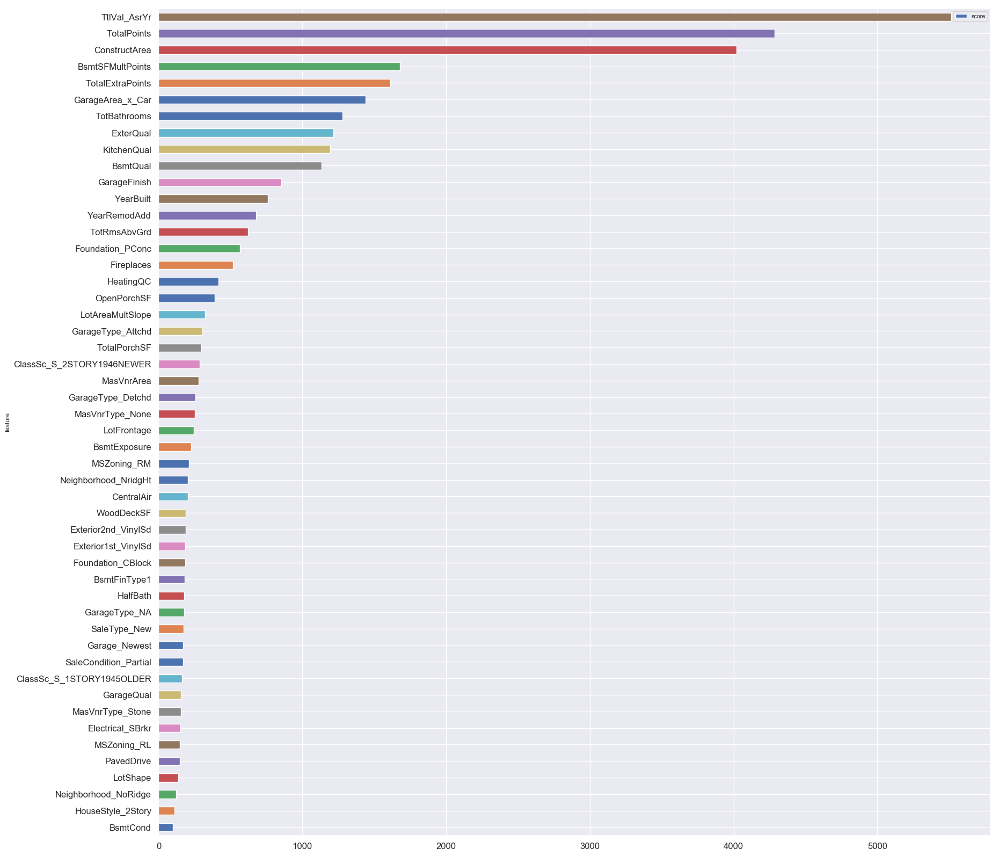

In [97]:
skb = SelectKBest(score_func=f_regression, k=50)
skb.fit(df, y_train)

select_features_kbest = skb.get_support()
kbest_FR = cols[select_features_kbest]
scores = skb.scores_[select_features_kbest]
feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], columns=['feature', 'score'])
feature_scores.sort_values(by='score', ascending=True).plot(y = 'score', x = 'feature', kind='barh', 
                                                            figsize=(20,20), fontsize=12, grid=True) 
plt.show()

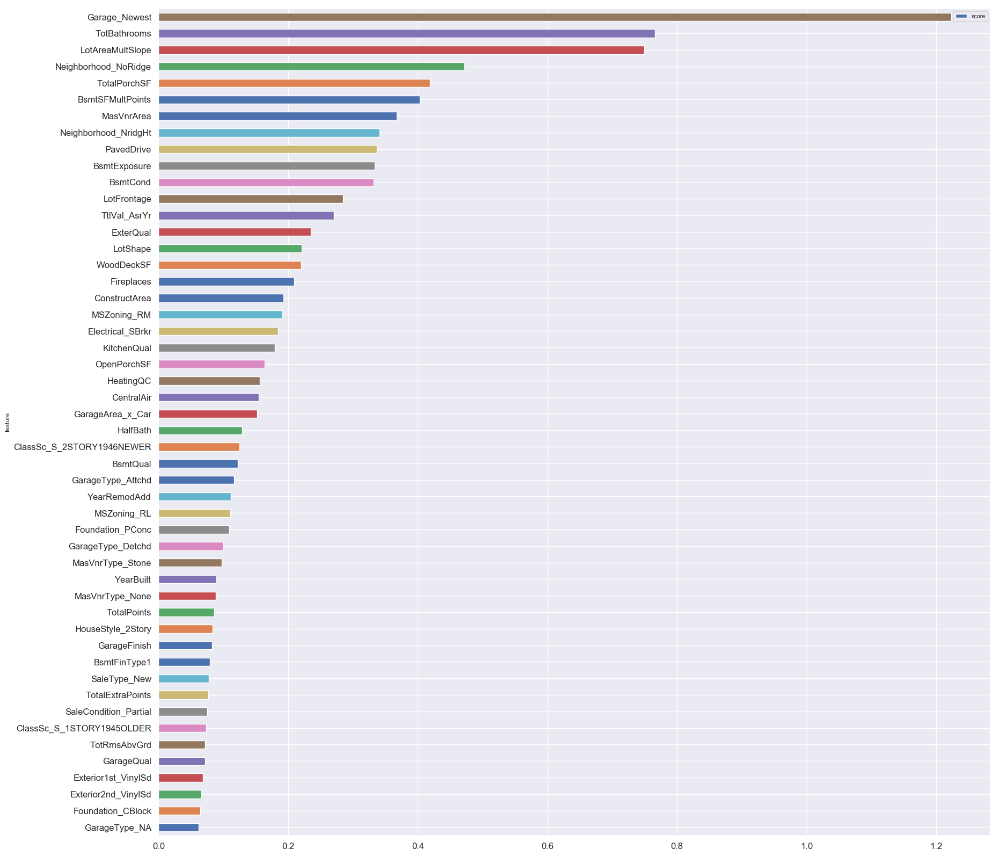

In [98]:
skb = SelectKBest(score_func=mutual_info_regression, k=50)
skb.fit(df, y_train)

select_features_kbest = skb.get_support()
kbest_MIR = cols[select_features_kbest]
scores = skb.scores_[select_features_kbest]
feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], columns=['feature', 'score'])
feature_scores.sort_values(by='score', ascending=True).plot(y = 'score', x = 'feature', kind='barh', 
                                                            figsize=(20,20), fontsize=12, grid=True) 
plt.show()

### Select Features by Embedded Methods
In addition to the return of the performance itself, some models has in their internal process some step to features select that best fit their proposal, and returns the features importance too. Thus, they provide two straightforward methods for feature selection and combine the qualities' of filter and wrapper methods. 

Some of the most popular examples of these methods are LASSO, RIDGE, SVM, Regularized trees, Memetic algorithm, and Random multinomial logit.

In the case of Random Forest, some other models base on trees, we have two basic approaches implemented in the packages:
1. Gini/Entropy Importance or Mean Decrease in Impurity (MDI)
2. Permutation Importance or Mean Decrease in Accuracy 
3. Permutation with Shadow Features
4. Gradient Boosting

Others models has concerns om **multicollinearity** problem and adding additional **constraints** or **penalty** to **regularize**. When there are multiple correlated features, as is the case with very many real life datasets, the model becomes unstable, meaning that small changes in the data can cause large changes in the model, making model interpretation very difficult on the regularization terms. 

This applies to regression models like LASSO and RIDGE. In classifier cases, you can use SGDClassifier where you can set the loss parameter to 'log' for Logistic Regression or 'hinge' for SVM. In SGDClassifier you can set the penalty to either of 'l1', 'l2' or 'elasticnet' which is a combination of both.

Let's start with more details and examples:

#### Feature Selection by Mean Decrease Impurity
There are a two things to keep in mind when using the impurity based ranking:
- Feature selection based on impurity reduction is biased towards preferring variables with more categories.
- It can lead to the incorrect conclusion that one of the features is a strong predictor while the others in the same group are unimportant, while actually they are very close in terms of their relationship with the independent variable.

The second one refers to when the dataset has two or more correlated features, then from the point of view of the model, any of these correlated features can be used as the predictor, with no concrete preference of one over the others. But once one of them is used, the importance of others is significantly reduced since effectively the impurity they can remove is already removed by the first feature. As a consequence, they will have a lower reported importance. This is not an issue when we want to use feature selection to reduce overfitting, since it makes sense to remove features that are mostly duplicated by other features. But when interpreting the data. The effect of this phenomenon is somewhat reduced thanks to random selection of features at each node creation, but in general the effect is not removed completely. 

The Random Forests is one of them, the reason is because the tree-based strategies used by random forests naturally ranks by how well they improve the purity of the node. This mean decrease in impurity over all trees, wheres for **classification**, it is typically either **Gini impurity** or **information gain/entropy** and for ***regression** it is ***variance***. Thus when training a tree, it can be computed how much each feature decreases the weighted impurity in a tree. For a forest, the impurity decrease from each feature can be averaged and the features are ranked according to this measure.

Random forests are a popular method for feature ranking, since they are so easy to apply: in general they require very little feature engineering and parameter tuning and mean decrease impurity is exposed in most random forest libraries. But they come with their own gotchas, especially when data interpretation is concerned. With correlated features, strong features can end up with low scores and the method can be biased towards variables with many categories. As long as the gotchas are kept in mind, there really is no reason not to try them out on your data.

Them, we run a quick Random Forest to select the features most importants:

In [ ]:
rf = RandomForestRegressor(max_depth = 20, min_samples_leaf = 1, min_samples_split = 2, n_estimators = 1000, 
                            criterion = 'mae', random_state=101)
rf.fit(df, y_train)

feature_importances = [(feature, score) for feature, score in zip(cols, rf.feature_importances_)]

MDI = cols[rf.feature_importances_>0.005]
print('Total features slected by Random Forest:',len(MDI))

g = pd.DataFrame(sorted(feature_importances, key=lambda x: -x[1])[:len(MDI)], columns=['Feature','Importance']).\
plot(x='Feature', kind='barh', figsize=(20,7), fontsize=18, grid=True)
plt.show()

#### Feature Selection by Mean Decrease Accuracy
The general idea is to permute the values of each feature and measure how much the permutation decreases the accuracy of the model. Clearly, for unimportant feature, the permutation should have little to no effect on model accuracy, while permuting important feature should significantly decrease it.

This method is not directly exposed in sklearn, but it is straightforward to implement it. Start record a baseline accuracy (classifier) or R<sup>2</sup> score (regressor) by passing a validation set or the out-of-bag (OOB) samples through the random forest. Permute the column values of a single predictor feature and then pass all test samples back through the random forest and recompute the accuracy or R<sup>2</sup>. The importance of that feature is the difference between the baseline and the drop in overall accuracy or R<sup>2</sup> caused by permuting the column. The permutation mechanism is much more computationally expensive than the mean decrease in impurity mechanism, but the results are more reliable.

The rfpimp package in the src dir provided it For Random Forest, let's see:

In [ ]:
X_train, X_test, y, y_test = train_test_split(df, y_train , test_size=0.20,  random_state=101)

# Add column of random numbers
X_train['random'] = np.random.random(size=len(X_train))
X_test['random'] = np.random.random(size=len(X_test))

rf = RandomForestRegressor(max_depth = 20, min_samples_leaf = 1, min_samples_split = 2, n_estimators = 1000, 
                            criterion = 'mae', n_jobs=-1, oob_score=True, random_state=101)
rf.fit(X_train, y)

imp = importances(rf, X_test, y_test, n_samples=-1) # permutation
MDA = imp[abs(imp)>=0.001].dropna().index
if 'random' in MDA:
   MDA =  MDA.drop('random')
print('%d features are selected.' % len(MDA))
plot_importances(imp[abs(imp)>=0.001].dropna(), figsize=(20,7))

#### Feature Selection by Permutation with Shadow Features
Boruta randomly permutes variables like Permutation Importance does, but performs on all variables at the same time and concatenates the shuffled features with the original ones. The concatenated result is used to fit the model.

Daniel Homola, who also wrote the Python version of Boruta, [BorutaPy](https://github.com/scikit-learn-contrib/boruta_py/blob/master/boruta/boruta_py.py), gave an wonderful overview of the Boruta algorithm in his blog post
"The shuffled features (a.k.a. shadow features) are basically noises with identical marginal distribution w.r.t the original feature. We count the times a variable performs better than the 'best' noise and calculate the confidence towards it being better than noise (the p-value) or not. Features which are confidently better are marked 'confirmed', and those which are confidently on par with noises are marked 'rejected'. Then we remove those marked features and repeat the process until all features are marked or a certain number of iteration is reached."

Although Boruta is a feature selection algorithm, we can use the order of confirmation/rejection as a way to rank the importance of features.

We will use the boruta in conjunction with the [ExtraTreesReggressor](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesRegressor.html) to see which selection of features we get from our dataset:

In [ ]:
# NOTE BorutaPy accepts numpy arrays only, hence the .values attribute
X = df.values
y = y_train.values.ravel()

etr = ExtraTreesRegressor(n_estimators = 100, criterion = 'mae', max_depth = 4, oob_score=True, bootstrap=True, 
                         n_jobs=-1, random_state=101)

# define Boruta feature selection method
feat_selector = BorutaPy(etr, n_estimators='auto', verbose=0, random_state=101)

# find all relevant features 
feat_selector.fit(X, y)

shadow = cols[feat_selector.support_]
# check selected features 
print('Features selected:',shadow)

# call transform() on X to filter it down to selected features
print('Data transformaded has %d features' % feat_selector.n_features_) #feat_selector.transform(X).shape[1])
print('Check the selector ranking:')
display(pd.concat([pd.DataFrame(cols, columns=['Columns']), 
           pd.DataFrame(feat_selector.ranking_, columns=['Rank'])], axis=1).sort_values(by=['Rank']))

#### Feature Selection by Gradient Boosting
The LightGBM model the importance is calculated from, if 'split', result contains numbers of times the feature is used in a model, if 'gain', result contains total gains of splits which use the feature.

On the [XGBoost](https://xgboost.readthedocs.io/en/latest/python/python_api.html) model the importance is calculated by:
- ‘weight’: the number of times a feature is used to split the data across all trees.
- ‘gain’: the average gain across all splits the feature is used in.
- ‘cover’: the average coverage across all splits the feature is used in.
- ‘total_gain’: the total gain across all splits the feature is used in.
- ‘total_cover’: the total coverage across all splits the feature is used in.

First measure is split-based and is very similar with the one given by for Gini Importance. But it doesn't take the number of samples into account.

The second measure is gain-based. It's basically the same as the Gini Importance implemented in R packages and in scikit-learn with Gini impurity replaced by the objective used by the gradient boosting model.

The cover, implemented exclusively in XGBoost, is counting the number of samples affected by the splits based on a feature.

get_score(fmap='', importance_type='weight')
Get feature importance of each feature. Importance type can be defined as:

The default measure of both XGBoost and LightGBM is the split-based one. I think this measure will be problematic if there are one or two feature with strong signals and a few features with weak signals. The model will exploit the strong features in the first few trees and use the rest of the features to improve on the residuals. The strong features will look not as important as they actually are. While setting lower learning rate and early stopping should alleviate the problem, also checking gain-based measure may be a good idea.

Note that these measures are purely calculated using training data, so there's a chance that a split creates no improvement on the objective in the holdout set. This problem is more severe than in the random forest since gradient boosting models are more prone to over-fitting. 

Feature importance scores can be used for feature selection in scikit-learn.

This is done using the SelectFromModel class that takes a model and can transform a dataset into a subset with selected features.

This class can take a previous trained model, such as one trained on the entire training dataset. It can then use a threshold to decide which features to select. This threshold is used when you call the transform() method on the SelectFromModel instance to consistently select the same features on the training dataset and the test dataset.

In [ ]:
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

# split data into train and test sets
X_train, X_test, y, y_test = train_test_split(df, y_train, test_size=0.30, random_state=101)

# fit model on all training data
#importance_type='gain'
model = XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0, max_delta_step=0, random_state=101,
                     min_child_weight=1, missing=None, n_jobs=3, nthread=None, scale_pos_weight=1, seed=None, silent=True, 
                     subsample=1)
model.fit(X_train, y)
fig=plt.figure(figsize=(20,20))
ax = fig.add_subplot(121)
g = plot_importance(model, height=0.5, ax=ax)

# Using each unique importance as a threshold
thresholds = np.sort(np.unique(model.feature_importances_)) #np.sort(model.feature_importances_[model.feature_importances_>0])
best = 1e36
colsbest = 31
my_model = model
threshold = 0

for thresh in thresholds:
    # select features using threshold
    selection = SelectFromModel(model, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    # train model
    selection_model =  XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0, max_delta_step=0, 
                                    random_state=101, min_child_weight=1, missing=None, n_jobs=3, nthread=None, 
                                    scale_pos_weight=1, seed=None, silent=True, subsample=1)
    selection_model.fit(select_X_train, y)
    # eval model
    select_X_test = selection.transform(X_test)
    y_pred = selection_model.predict(select_X_test)
    predictions = [round(value) for value in y_pred]
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    print("Thresh={:1.3f}, n={:d}, R2: {:2.2%} with MSE: {:.4f}".format(thresh, select_X_train.shape[1], r2, mse))
    if (best >= mse):
        best = mse
        colsbest = select_X_train.shape[1]
        my_model = selection_model
        threshold = thresh
        
ax = fig.add_subplot(122)
g = plot_importance(my_model,height=0.5, ax=ax, 
                    title='The best accuracy: {:2.2%} with {:d} features'.\
                    format(best, colsbest))

feature_importances = [(score, feature) for score, feature in zip(model.feature_importances_, cols)]
XGBest = pd.DataFrame(sorted(sorted(feature_importances, reverse=True)[:colsbest]), columns=['Score', 'Feature'])
g = XGBest.plot(x='Feature', kind='barh', figsize=(20,10), fontsize=14, grid= True,
     title='Original feature importance from selected features')
plt.tight_layout(); plt.show()
XGBestCols = XGBest.iloc[:, 1].tolist()

#### Feature Selection by Regularized Models
Regularization is a method for adding additional constraints or penalty to a model, with the goal of preventing overfitting and improving generalization. Instead of minimizing a loss function E(X,Y), the loss function to minimize becomes E(X,Y)+α∥w∥, where w is the vector of model coefficients, ∥⋅∥ is typically L1 or L2 norm and α is a tunable free parameter, specifying the amount of regularization (so α=0 implies an unregularized model). The two widely used regularization methods are L1 and L2 regularization, also called lasso and ridge.

Regularized models are a powerful set of tool for feature interpretation and selection. Lasso produces sparse solutions and as such is very useful selecting a strong subset of features for improving model performance. Ridge on the other hand can be used for data interpretation due to its stability and the fact that useful features tend to have non-zero coefficients. Since the relationship between the response variable and features in often non-linear, basis expansion can be used to convert features into a more suitable space, while keeping the simple linear models fully applicable.

Let's see how the [ElasticNetCV](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNetCV.html) , can help with this. It is a linear regression with combined L1 and L2 priors as regularizer for 0 < l1_ratio < 1,  with iterative fitting along a regularization path, wheres the best model is selected by cross-validation.

In [ ]:
X_train, X_test, y, y_test = train_test_split(df, y_train , test_size=0.20,  random_state=101)

# Add column of random numbers
X_train['random'] = np.random.random(size=len(X_train))
X_test['random'] = np.random.random(size=len(X_test))

rm = ElasticNetCV(n_alphas = 1, alphas =[0.001], l1_ratio = 0.3, max_iter = 200, selection = 'random',
                  random_state = 101, cv = 5, n_jobs = -1)
rm.fit(X_train, y)

imp = importances(rm, X_test, y_test, n_samples=-1) # permutation
RM = imp[abs(imp)>=0.001].dropna().index
if 'random' in RM:
    RM = RM.drop('random')
    
print('%d features are selected.' % len(RM))
plot_importances(imp[abs(imp)>=0.001].dropna(), figsize=(20,10))

## Combine Features Selection Methods
As each machine learning model benefits from one or another set of features selected, depending on its own method, and our dataset does in fact present few features, since we first removed the collinear and multilinear with the highest correlation and the highest degree of FIV that represents risk for our model, now we can union all selected features in a unique set, and check what features are elected exclusively by a unique method.

In [ ]:
bcols = set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_FR)).union(set(kbest_MIR)).\
            union(set(RM)).union(set(XGBestCols)).union(set(SBS)).union(set(shadow))
print('Features Selected by Filter Methods:\n')
print("Extra features select by Kbest_FR:", set(kbest_FR).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_MIR)).union(set(RM)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print("Extra features select by Kbest_MIR:", set(kbest_MIR).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_FR)).union(set(RM)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print('_'*75,'\nFeatures Selected by Wrappers Methods:\n')
print("Extra features select by pv_cols:", set(pv_cols).\
      difference(set(SBS).union(set(MDI)).union(set(MDA)).union(set(RM)).union(set(RFEcv)).union(set(shadow)).\
                 union(set(kbest_MIR)).union(set(kbest_FR)).union(set(XGBestCols))),'\n')
print("Extra features select by RFEcv:", set(RFEcv).\
      difference(set(pv_cols).union(set(MDI)).union(set(MDA)).union(set(kbest_FR)).union(set(RM)).union(set(kbest_MIR)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print("Extra features select by SBS:", set(SBS).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_MIR)).union(set(kbest_FR)).\
                 union(set(RM)).union(set(XGBestCols)).union(set(shadow))), '\n')
print('_'*75,'\nFeatures Selected by Embedded Methods:\n')
print("Extra features select by MDI:", set(MDI).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDA)).union(set(kbest_FR)).union(set(kbest_MIR)).union(set(RM)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print("Extra features select by MDA:", set(MDA).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(kbest_FR)).union(set(kbest_MIR)).union(set(RM)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print("Extra features select by shadow:", set(shadow).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(kbest_FR)).union(set(kbest_MIR)).union(set(RM)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(MDA))), '\n')
print("Extra features select by XGBestCols:", set(XGBestCols).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_MIR)).union(set(kbest_FR)).\
                 union(set(RM)).union(set(SBS)).union(set(shadow))), '\n')
print("Extra features select by RM:", set(RM).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(MDI)).union(set(MDA)).union(set(kbest_MIR)).union(set(kbest_FR)).\
                 union(set(XGBestCols)).union(set(SBS)).union(set(shadow))), '\n')
print('_'*75,'\nIntersection Features Selected:')
print(set(MDI).intersection(set(kbest_MIR)).intersection(set(RFEcv)).intersection(set(pv_cols)).intersection(set(RM)).\
               intersection(set(MDA)).intersection(set(kbest_FR)).intersection(set(XGBestCols)).intersection(set(SBS).\
               intersection(set(shadow))), '\n')
print('_'*75,'\nUnion All Features Selected:')
print('Total number of features selected:', len(bcols))
print('\n{0:2d} features removed if use the union of selections: {1:}'.\
      format(len(cols.difference(bcols)), cols.difference(bcols)))

In [ ]:
train = all_data.loc[all_data.SalePrice>0 , list(bcols)]
y_train = all_data.SalePrice[all_data.SalePrice>0]
test = all_data.loc[all_data.SalePrice==0 , list(bcols)]
TestId = all_data.Id[all_data.SalePrice==0 ]

### Feature Selection into the Pipeline
Since we have a very different selection of features selection methods, from the results it may be interesting keeping only the removal of collinear, multicollinear and most of one-hot encode results from surnames, and apply PCA around 22 or LDA to linear models, and we can still improve the results through hyper parameterization and cross-validation.

In [ ]:
class select_fetaures(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        print('Recive {0:2d} features...'.format(X.shape[1]))
        return self

    def transform(self, X):
        print('Select {0:2d} features'.format(X.loc[:, self.select_cols_].shape[1]))
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df 
        #X.loc[:, self.select_cols_]    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]
        

### Compressing Data via Dimensionality Reduction
#### PCA
**Principal component analysis** ([PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)) is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components. If there are n observations with p variables, then the number of distinct principal components is `min(n-1,p)`. This transformation is defined in such a way that the first principal component has the largest possible variance, and each succeeding component in turn has the highest variance possible under the constraint that it is orthogonal to the preceding components. The resulting vectors are an uncorrelated orthogonal basis set. PCA is sensitive to the relative scaling of the original variables.
![image.png](http://vitarts3.hospedagemdesites.ws/wp-content/uploads/2018/09/DimRed.png)

Let's see how PCA can reduce the dimensionality of our dataset with minimum of lose information:

In [ ]:
scale = RobustScaler() 
df = scale.fit_transform(train)

pca = PCA().fit(df) # whiten=True
print('With only 2 features: {:6.4%}'.format(sum(pca.explained_variance_ratio_[:2])),"%\n")

print('After PCA, {:3} features only not explained {:6.4%} of variance ratio from the original {:3}'.format(2,
                                                                                    (sum(pca.explained_variance_ratio_[2:])),
                                                                                    df.shape[1]))
#del df, explorator, all_data

## 4.  Modeling 
First, we strat to looking at different approaches to implement linear regression models, and use hiperparametrization, cross validattion and compare the results between diferents erros measures.

### Model Hiperparametrization
#### Evaluete Results
**Mean Squared Error (MSE)**
![image.png](attachment:image.png)
Which is simply the average value of the SSE cost function that we minimize to fit the linear regression model. The MSE is useful to for comparing different regression models or for tuning their parameters via a grid search and cross-validation.

**Coefficient of determination ( R2 )**
![image.png](attachment:image.png)
Which can be understood as a standardized version of the MSE, for better interpretability of the model performance. In other words, R2 is the fraction of response variance that is captured by the model. 

For the training dataset, R2 is bounded between 0 and 1, but it can become negative for the test set. If R2 =1 , the model fits the data perfectly with a corresponding MSE = 0 .

In [125]:
def get_results(model, name='NAN'):
    
    rcols = ['Name','Model', 'BestParameters', 'Scorer', 'Index', 'BestScore', 'BestScoreStd', 'MeanScore', 'MeanScoreStd', 'Best']
    res = pd.DataFrame(columns=rcols)
    
    results = model.cv_results_
    modelo = model.best_estimator_

    scoring = {'MEA': 'neg_mean_absolute_error', 'R2': 'r2', 'RMSE': 'neg_mean_squared_error'}

    for scorer in sorted(scoring):
        best_index = np.nonzero(results['rank_test_%s' % scoring[scorer]] == 1)[0][0]
        if scorer == 'RMSE': 
            best = np.expm1(np.sqrt(-results['mean_test_%s' % scoring[scorer]][best_index]))
            best_std = np.expm1(np.sqrt(results['std_test_%s' % scoring[scorer]][best_index]))
            scormean = np.expm1(np.sqrt(-results['mean_test_%s' % scoring[scorer]].mean()))
            stdmean = np.expm1(np.sqrt(results['std_test_%s' % scoring[scorer]].mean()))
        elif scorer == 'MEA':
            best = np.expm1(-results['mean_test_%s' % scoring[scorer]][best_index])
            best_std = np.expm1(results['std_test_%s' % scoring[scorer]][best_index])
            scormean = np.expm1(-results['mean_test_%s' % scoring[scorer]].mean())
            stdmean = np.expm1(results['std_test_%s' % scoring[scorer]].mean())
        else:
            best = results['mean_test_%s' % scoring[scorer]][best_index]*100
            best_std = results['std_test_%s' % scoring[scorer]][best_index]*100
            scormean = results['mean_test_%s' % scoring[scorer]].mean()*100
            stdmean = results['std_test_%s' % scoring[scorer]].mean()*100
        
        r1 = pd.DataFrame([(name, modelo, model.best_params_, scorer, best_index, best, best_std, scormean, stdmean, model.best_score_)],
                          columns = rcols)
        res = res.append(r1)
        
            
    print("Best Score: {:.6f}".format(np.expm1(np.sqrt(-model.best_score_))))
    print('---------------------------------------')
    print('Best Parameters:')
    print(model.best_params_)
    
    return res

### Residuals Plots
The plot of differences or vertical distances between the actual and predicted values. Commonly used graphical analysis for diagnosing regression models to detect nonlinearity and outliers, and to check if the errors are randomly distributed.
![image.png](attachment:image.png)
  - For a good regression model, we would expect that the errors are randomly distributed and the residuals should be randomly scattered around the centerline
  - If we see patterns in a residual plot, it means that our model is unable to capture some explanatory information
  - Detect outliers, which are represented by the points with a large deviation from the centerline.

In [126]:
def resilduals_plots(lr, X):
    y_pred = lr.predict(X)
    plt.scatter(y_pred, y_pred - y_train, c='blue', marker='o', label='Training data')
    #plt.scatter(y_test_pred, y_test_pred - y_test, c='lightgreen', marker='s', label='Test data')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    #plt.legend(loc='upper left')
    plt.hlines(y=0, xmin=10, xmax=15, lw=2, color='red')
    plt.xlim([10, 15])
    plt.show()

## Model Hiperparametrization
### Lasso (Least Absolute Shrinkage and Selection Operator)
An alternative approach that can lead to sparse models.
![image.png](attachment:image.png)
Depending on the regularization strength, certain weights can become zero, which makes the LASSO also useful as a supervised feature selection technique:

However, a limitation of the LASSO is that it selects at most n variables if m > n .

In [137]:
lasso = Pipeline([
    #('sel', select_fetaures(select_cols=list(['TotalPoints', 'TtlVal_AsrYr', 'ConstructArea']))),
    ('scl', RobustScaler()), #  StandardScaler()), # 
    #('pca', PCA(n_components=5, random_state = 101)),
    ('pol', PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)),
    ('model', Lasso(random_state = 101))
])

n_components = [2, 5, 50]
whiten = [True, False]
max_iter = [157] # np.arange(145, 166) #[50, 100, 165, 188, 200, 315, 230, 254, 300, 350, 400, 450, 522, 650, 750, 900, 1000]  
alpha = [0.0003]#, 0.0001, 0.0005, 0.05, 0.5, 1.0]
selection = ['random'] #'cyclic', 
tol = [2e-03]#,0.0003, 0.0001, 0.0005]

reg = GridSearchCV(estimator = lasso, 
                   param_grid = dict(
                      model__alpha = alpha
                      ,model__max_iter = max_iter
                      ,model__selection = selection
                      ,model__tol = tol
                      #,pca__n_components = n_components
                      #,pca__whiten = whiten 
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)
sel = ['ConstructArea', 'TotalPoints', 'TtlVal_AsrYr', 'GarageArea_x_Car', 'MasVnrArea', 'OverallCond', 'HalfBath',
       'Neighborhood_NAmes', 'Neighborhood_Crawfor', 'Neighborhood_MeadowV', 'Neighborhood_NWAmes',
       'YearBuilt', 'MSZoning_Call', 'MSZoning_RM', 'Garage_Newest', 'Fireplaces', 'BsmtUnfSF', 'Condition1_Norm',
       'KitchenAbvGr', 'BsmtFinType1', 'IsNew', 'Exterior1st_BrkFace', 'Exterior2nd_HdBoard', 'Exterior1st_HdBoard', 
       'ClassSc_S_MULTILEVELTWNHMINCLSPLITLEVFOYER', 'ClassSc_S_2STORY1946NEWER']
# 'LotAreaMultSlope', 'TotalExtraPoints', 'BsmtSFMultPoints', 'BsmtFinSF1', 'MSSubClass', 'FullBath'
# 'ExterQual', 'YearRemodAdd', 'TotalPorchSF', 'SaleCondition_Abnorml', 'SaleCondition_Normal'
# 'TotRmsAbvGrd', 'SaleType_WD', 'Functional', 'CentralAir', 'TotBathrooms','Foundation_PConc'
# 'MSZoning_RL', 'BldgType_1Fam', 'Neighborhood_NoRidge', 'OpenPorchSF', 'GarageQual', 'GarageFinish', 'ClassSc_S_NA'
# 'ClassSc_S_1STORY1946NEWERALLSTYLES', 'ClassSc_S_1STORY1945OLDER', 'ExterCond', 'ExterQual', 'SndFlrSF', 'Foundation_PConc'
# 'LotFrontage', 'BedroomAbvGr', 'HouseStyle_2Story', 'RoofStyle_Hip', 'BsmtFinType2', 'BsmtQual', 'BsmtExposure','BsmtCond'
# 'KitchenQual', 'GarageType_Attchd', 'GarageType_Detchd', 'MA_City_AMES', 'LandContour_Low', 'Exterior1st_Plywood',
# 'ClassSc_S_1STORYTWNHM1946NEWER', 'ClassSc_S_1STORY1946NEWERALLSTYLES', 'Neighborhood_SWISU','Neighborhood_BrkSide',
# 'Neighborhood_Somerst','Neighborhood_StoneBr', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 
SBS = ['Street', 'LandSlope',  'BsmtFinType2', 'SndFlrSF',  
'PavedDrive', 'ScreenPorch',  'HouseStyle_15Unf', 'HouseStyle_1Story', 
'LotConfig_CulDSac',   'Fence_MnWw', 'Fence_NA', 'Fence_GdPrv', 'Fence_GdWo', 
'Condition1_Artery', 'Condition1_Norm', 'BldgType_2fmCon', 'BldgType_Duplex', 'BldgType_Twnhs', 
'MasVnrType_BrkFace', 'Foundation_BrkTil', 'Foundation_CBlock', 'Heating_GasW', 'GarageType_BuiltIn']
 
reg.fit(train.loc[:,sel], y_train)
results = get_results(reg, 'reg lasso')
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
resilduals_plots(reg.best_estimator_, train.loc[:, np.asanyarray(pv_cols)])

Fitting 6 folds for each of 1 candidates, totalling 6 fits


JoblibValueError: JoblibValueError
___________________________________________________________________________
Multiprocessing exception:
...........................................................................
C:\ProgramData\Anaconda3\lib\runpy.py in _run_module_as_main(mod_name='ipykernel_launcher', alter_argv=1)
    188         sys.exit(msg)
    189     main_globals = sys.modules["__main__"].__dict__
    190     if alter_argv:
    191         sys.argv[0] = mod_spec.origin
    192     return _run_code(code, main_globals, None,
--> 193                      "__main__", mod_spec)
        mod_spec = ModuleSpec(name='ipykernel_launcher', loader=<_f...nda3\\lib\\site-packages\\ipykernel_launcher.py')
    194 
    195 def run_module(mod_name, init_globals=None,
    196                run_name=None, alter_sys=False):
    197     """Execute a module's code without importing it

...........................................................................
C:\ProgramData\Anaconda3\lib\runpy.py in _run_code(code=<code object <module> at 0x000002657F545ED0, fil...lib\site-packages\ipykernel_launcher.py", line 5>, run_globals={'__annotations__': {}, '__builtins__': <module 'builtins' (built-in)>, '__cached__': r'C:\ProgramData\Anaconda3\lib\site-packages\__pycache__\ipykernel_launcher.cpython-36.pyc', '__doc__': 'Entry point for launching an IPython kernel.\n\nTh...orts until\nafter removing the cwd from sys.path.\n', '__file__': r'C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py', '__loader__': <_frozen_importlib_external.SourceFileLoader object>, '__name__': '__main__', '__package__': '', '__spec__': ModuleSpec(name='ipykernel_launcher', loader=<_f...nda3\\lib\\site-packages\\ipykernel_launcher.py'), 'app': <module 'ipykernel.kernelapp' from 'C:\\ProgramD...a3\\lib\\site-packages\\ipykernel\\kernelapp.py'>, ...}, init_globals=None, mod_name='__main__', mod_spec=ModuleSpec(name='ipykernel_launcher', loader=<_f...nda3\\lib\\site-packages\\ipykernel_launcher.py'), pkg_name='', script_name=None)
     80                        __cached__ = cached,
     81                        __doc__ = None,
     82                        __loader__ = loader,
     83                        __package__ = pkg_name,
     84                        __spec__ = mod_spec)
---> 85     exec(code, run_globals)
        code = <code object <module> at 0x000002657F545ED0, fil...lib\site-packages\ipykernel_launcher.py", line 5>
        run_globals = {'__annotations__': {}, '__builtins__': <module 'builtins' (built-in)>, '__cached__': r'C:\ProgramData\Anaconda3\lib\site-packages\__pycache__\ipykernel_launcher.cpython-36.pyc', '__doc__': 'Entry point for launching an IPython kernel.\n\nTh...orts until\nafter removing the cwd from sys.path.\n', '__file__': r'C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py', '__loader__': <_frozen_importlib_external.SourceFileLoader object>, '__name__': '__main__', '__package__': '', '__spec__': ModuleSpec(name='ipykernel_launcher', loader=<_f...nda3\\lib\\site-packages\\ipykernel_launcher.py'), 'app': <module 'ipykernel.kernelapp' from 'C:\\ProgramD...a3\\lib\\site-packages\\ipykernel\\kernelapp.py'>, ...}
     86     return run_globals
     87 
     88 def _run_module_code(code, init_globals=None,
     89                     mod_name=None, mod_spec=None,

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py in <module>()
     11     # This is added back by InteractiveShellApp.init_path()
     12     if sys.path[0] == '':
     13         del sys.path[0]
     14 
     15     from ipykernel import kernelapp as app
---> 16     app.launch_new_instance()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\traitlets\config\application.py in launch_instance(cls=<class 'ipykernel.kernelapp.IPKernelApp'>, argv=None, **kwargs={})
    653 
    654         If a global instance already exists, this reinitializes and starts it
    655         """
    656         app = cls.instance(**kwargs)
    657         app.initialize(argv)
--> 658         app.start()
        app.start = <bound method IPKernelApp.start of <ipykernel.kernelapp.IPKernelApp object>>
    659 
    660 #-----------------------------------------------------------------------------
    661 # utility functions, for convenience
    662 #-----------------------------------------------------------------------------

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelapp.py in start(self=<ipykernel.kernelapp.IPKernelApp object>)
    481         if self.poller is not None:
    482             self.poller.start()
    483         self.kernel.start()
    484         self.io_loop = ioloop.IOLoop.current()
    485         try:
--> 486             self.io_loop.start()
        self.io_loop.start = <bound method BaseAsyncIOLoop.start of <tornado.platform.asyncio.AsyncIOMainLoop object>>
    487         except KeyboardInterrupt:
    488             pass
    489 
    490 launch_new_instance = IPKernelApp.launch_instance

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\tornado\platform\asyncio.py in start(self=<tornado.platform.asyncio.AsyncIOMainLoop object>)
    122         except (RuntimeError, AssertionError):
    123             old_loop = None
    124         try:
    125             self._setup_logging()
    126             asyncio.set_event_loop(self.asyncio_loop)
--> 127             self.asyncio_loop.run_forever()
        self.asyncio_loop.run_forever = <bound method BaseEventLoop.run_forever of <_Win...EventLoop running=True closed=False debug=False>>
    128         finally:
    129             asyncio.set_event_loop(old_loop)
    130 
    131     def stop(self):

...........................................................................
C:\ProgramData\Anaconda3\lib\asyncio\base_events.py in run_forever(self=<_WindowsSelectorEventLoop running=True closed=False debug=False>)
    417             sys.set_asyncgen_hooks(firstiter=self._asyncgen_firstiter_hook,
    418                                    finalizer=self._asyncgen_finalizer_hook)
    419         try:
    420             events._set_running_loop(self)
    421             while True:
--> 422                 self._run_once()
        self._run_once = <bound method BaseEventLoop._run_once of <_Windo...EventLoop running=True closed=False debug=False>>
    423                 if self._stopping:
    424                     break
    425         finally:
    426             self._stopping = False

...........................................................................
C:\ProgramData\Anaconda3\lib\asyncio\base_events.py in _run_once(self=<_WindowsSelectorEventLoop running=True closed=False debug=False>)
   1427                         logger.warning('Executing %s took %.3f seconds',
   1428                                        _format_handle(handle), dt)
   1429                 finally:
   1430                     self._current_handle = None
   1431             else:
-> 1432                 handle._run()
        handle._run = <bound method Handle._run of <Handle BaseAsyncIOLoop._handle_events(1088, 1)>>
   1433         handle = None  # Needed to break cycles when an exception occurs.
   1434 
   1435     def _set_coroutine_wrapper(self, enabled):
   1436         try:

...........................................................................
C:\ProgramData\Anaconda3\lib\asyncio\events.py in _run(self=<Handle BaseAsyncIOLoop._handle_events(1088, 1)>)
    140             self._callback = None
    141             self._args = None
    142 
    143     def _run(self):
    144         try:
--> 145             self._callback(*self._args)
        self._callback = <bound method BaseAsyncIOLoop._handle_events of <tornado.platform.asyncio.AsyncIOMainLoop object>>
        self._args = (1088, 1)
    146         except Exception as exc:
    147             cb = _format_callback_source(self._callback, self._args)
    148             msg = 'Exception in callback {}'.format(cb)
    149             context = {

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\tornado\platform\asyncio.py in _handle_events(self=<tornado.platform.asyncio.AsyncIOMainLoop object>, fd=1088, events=1)
    112             self.writers.remove(fd)
    113         del self.handlers[fd]
    114 
    115     def _handle_events(self, fd, events):
    116         fileobj, handler_func = self.handlers[fd]
--> 117         handler_func(fileobj, events)
        handler_func = <function wrap.<locals>.null_wrapper>
        fileobj = <zmq.sugar.socket.Socket object>
        events = 1
    118 
    119     def start(self):
    120         try:
    121             old_loop = asyncio.get_event_loop()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\tornado\stack_context.py in null_wrapper(*args=(<zmq.sugar.socket.Socket object>, 1), **kwargs={})
    271         # Fast path when there are no active contexts.
    272         def null_wrapper(*args, **kwargs):
    273             try:
    274                 current_state = _state.contexts
    275                 _state.contexts = cap_contexts[0]
--> 276                 return fn(*args, **kwargs)
        args = (<zmq.sugar.socket.Socket object>, 1)
        kwargs = {}
    277             finally:
    278                 _state.contexts = current_state
    279         null_wrapper._wrapped = True
    280         return null_wrapper

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _handle_events(self=<zmq.eventloop.zmqstream.ZMQStream object>, fd=<zmq.sugar.socket.Socket object>, events=1)
    445             return
    446         zmq_events = self.socket.EVENTS
    447         try:
    448             # dispatch events:
    449             if zmq_events & zmq.POLLIN and self.receiving():
--> 450                 self._handle_recv()
        self._handle_recv = <bound method ZMQStream._handle_recv of <zmq.eventloop.zmqstream.ZMQStream object>>
    451                 if not self.socket:
    452                     return
    453             if zmq_events & zmq.POLLOUT and self.sending():
    454                 self._handle_send()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _handle_recv(self=<zmq.eventloop.zmqstream.ZMQStream object>)
    475             else:
    476                 raise
    477         else:
    478             if self._recv_callback:
    479                 callback = self._recv_callback
--> 480                 self._run_callback(callback, msg)
        self._run_callback = <bound method ZMQStream._run_callback of <zmq.eventloop.zmqstream.ZMQStream object>>
        callback = <function wrap.<locals>.null_wrapper>
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    481         
    482 
    483     def _handle_send(self):
    484         """Handle a send event."""

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _run_callback(self=<zmq.eventloop.zmqstream.ZMQStream object>, callback=<function wrap.<locals>.null_wrapper>, *args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    427         close our socket."""
    428         try:
    429             # Use a NullContext to ensure that all StackContexts are run
    430             # inside our blanket exception handler rather than outside.
    431             with stack_context.NullContext():
--> 432                 callback(*args, **kwargs)
        callback = <function wrap.<locals>.null_wrapper>
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    433         except:
    434             gen_log.error("Uncaught exception in ZMQStream callback",
    435                           exc_info=True)
    436             # Re-raise the exception so that IOLoop.handle_callback_exception

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\tornado\stack_context.py in null_wrapper(*args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    271         # Fast path when there are no active contexts.
    272         def null_wrapper(*args, **kwargs):
    273             try:
    274                 current_state = _state.contexts
    275                 _state.contexts = cap_contexts[0]
--> 276                 return fn(*args, **kwargs)
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    277             finally:
    278                 _state.contexts = current_state
    279         null_wrapper._wrapped = True
    280         return null_wrapper

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in dispatcher(msg=[<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>])
    278         if self.control_stream:
    279             self.control_stream.on_recv(self.dispatch_control, copy=False)
    280 
    281         def make_dispatcher(stream):
    282             def dispatcher(msg):
--> 283                 return self.dispatch_shell(stream, msg)
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    284             return dispatcher
    285 
    286         for s in self.shell_streams:
    287             s.on_recv(make_dispatcher(s), copy=False)

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in dispatch_shell(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, msg={'buffers': [], 'content': {'allow_stdin': True, 'code': "lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': datetime.datetime(2018, 10, 2, 22, 52, 20, 303081, tzinfo=tzutc()), 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'session': 'e39b0c263b5447aca35c295a1d007035', 'username': 'username', 'version': '5.2'}, 'metadata': {}, 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'parent_header': {}})
    228             self.log.warn("Unknown message type: %r", msg_type)
    229         else:
    230             self.log.debug("%s: %s", msg_type, msg)
    231             self.pre_handler_hook()
    232             try:
--> 233                 handler(stream, idents, msg)
        handler = <bound method Kernel.execute_request of <ipykernel.ipkernel.IPythonKernel object>>
        stream = <zmq.eventloop.zmqstream.ZMQStream object>
        idents = [b'e39b0c263b5447aca35c295a1d007035']
        msg = {'buffers': [], 'content': {'allow_stdin': True, 'code': "lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': datetime.datetime(2018, 10, 2, 22, 52, 20, 303081, tzinfo=tzutc()), 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'session': 'e39b0c263b5447aca35c295a1d007035', 'username': 'username', 'version': '5.2'}, 'metadata': {}, 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'parent_header': {}}
    234             except Exception:
    235                 self.log.error("Exception in message handler:", exc_info=True)
    236             finally:
    237                 self.post_handler_hook()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in execute_request(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, ident=[b'e39b0c263b5447aca35c295a1d007035'], parent={'buffers': [], 'content': {'allow_stdin': True, 'code': "lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': datetime.datetime(2018, 10, 2, 22, 52, 20, 303081, tzinfo=tzutc()), 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'session': 'e39b0c263b5447aca35c295a1d007035', 'username': 'username', 'version': '5.2'}, 'metadata': {}, 'msg_id': 'f4d135aa18e14b92b46a45877408c9b9', 'msg_type': 'execute_request', 'parent_header': {}})
    394         if not silent:
    395             self.execution_count += 1
    396             self._publish_execute_input(code, parent, self.execution_count)
    397 
    398         reply_content = self.do_execute(code, silent, store_history,
--> 399                                         user_expressions, allow_stdin)
        user_expressions = {}
        allow_stdin = True
    400 
    401         # Flush output before sending the reply.
    402         sys.stdout.flush()
    403         sys.stderr.flush()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py in do_execute(self=<ipykernel.ipkernel.IPythonKernel object>, code="lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", silent=False, store_history=True, user_expressions={}, allow_stdin=True)
    203 
    204         self._forward_input(allow_stdin)
    205 
    206         reply_content = {}
    207         try:
--> 208             res = shell.run_cell(code, store_history=store_history, silent=silent)
        res = undefined
        shell.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = "lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])"
        store_history = True
        silent = False
    209         finally:
    210             self._restore_input()
    211 
    212         if res.error_before_exec is not None:

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\zmqshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, *args=("lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])",), **kwargs={'silent': False, 'store_history': True})
    532             )
    533         self.payload_manager.write_payload(payload)
    534 
    535     def run_cell(self, *args, **kwargs):
    536         self._last_traceback = None
--> 537         return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
        self.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        args = ("lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])",)
        kwargs = {'silent': False, 'store_history': True}
    538 
    539     def _showtraceback(self, etype, evalue, stb):
    540         # try to preserve ordering of tracebacks and print statements
    541         sys.stdout.flush()

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, raw_cell="lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", store_history=True, silent=False, shell_futures=True)
   2657         -------
   2658         result : :class:`ExecutionResult`
   2659         """
   2660         try:
   2661             result = self._run_cell(
-> 2662                 raw_cell, store_history, silent, shell_futures)
        raw_cell = "lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])"
        store_history = True
        silent = False
        shell_futures = True
   2663         finally:
   2664             self.events.trigger('post_execute')
   2665             if not silent:
   2666                 self.events.trigger('post_run_cell', result)

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in _run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, raw_cell="lasso = Pipeline([\n    #('sel', select_fetaures(...estimator_, train.loc[:, np.asanyarray(pv_cols)])", store_history=True, silent=False, shell_futures=True)
   2780                 self.displayhook.exec_result = result
   2781 
   2782                 # Execute the user code
   2783                 interactivity = 'none' if silent else self.ast_node_interactivity
   2784                 has_raised = self.run_ast_nodes(code_ast.body, cell_name,
-> 2785                    interactivity=interactivity, compiler=compiler, result=result)
        interactivity = 'last_expr'
        compiler = <IPython.core.compilerop.CachingCompiler object>
   2786                 
   2787                 self.last_execution_succeeded = not has_raised
   2788                 self.last_execution_result = result
   2789 

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_ast_nodes(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, nodelist=[<_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.Expr object>, <_ast.Assign object>, <_ast.Expr object>, <_ast.Expr object>], cell_name='<ipython-input-137-05a9f45a9e5b>', interactivity='last', compiler=<IPython.core.compilerop.CachingCompiler object>, result=<ExecutionResult object at 2650ff06940, executio...rue silent=False shell_futures=True> result=None>)
   2898 
   2899         try:
   2900             for i, node in enumerate(to_run_exec):
   2901                 mod = ast.Module([node])
   2902                 code = compiler(mod, cell_name, "exec")
-> 2903                 if self.run_code(code, result):
        self.run_code = <bound method InteractiveShell.run_code of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = <code object <module> at 0x000002651400CDB0, file "<ipython-input-137-05a9f45a9e5b>", line 48>
        result = <ExecutionResult object at 2650ff06940, executio...rue silent=False shell_futures=True> result=None>
   2904                     return True
   2905 
   2906             for i, node in enumerate(to_run_interactive):
   2907                 mod = ast.Interactive([node])

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_code(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, code_obj=<code object <module> at 0x000002651400CDB0, file "<ipython-input-137-05a9f45a9e5b>", line 48>, result=<ExecutionResult object at 2650ff06940, executio...rue silent=False shell_futures=True> result=None>)
   2958         outflag = True  # happens in more places, so it's easier as default
   2959         try:
   2960             try:
   2961                 self.hooks.pre_run_code_hook()
   2962                 #rprint('Running code', repr(code_obj)) # dbg
-> 2963                 exec(code_obj, self.user_global_ns, self.user_ns)
        code_obj = <code object <module> at 0x000002651400CDB0, file "<ipython-input-137-05a9f45a9e5b>", line 48>
        self.user_global_ns = {'ARDRegression': <class 'sklearn.linear_model.bayes.ARDRegression'>, 'Activation': <class 'keras.layers.core.Activation'>, 'Axes3D': <class 'mpl_toolkits.mplot3d.axes3d.Axes3D'>, 'BaggingRegressor': <class 'sklearn.ensemble.bagging.BaggingRegressor'>, 'BaseEstimator': <class 'sklearn.base.BaseEstimator'>, 'BayesianRidge': <class 'sklearn.linear_model.bayes.BayesianRidge'>, 'BorutaPy': <class 'boruta.boruta_py.BorutaPy'>, 'DataFrameImputer': <class '__main__.DataFrameImputer'>, 'Dense': <class 'keras.layers.core.Dense'>, 'EarlyStopping': <class 'keras.callbacks.EarlyStopping'>, ...}
        self.user_ns = {'ARDRegression': <class 'sklearn.linear_model.bayes.ARDRegression'>, 'Activation': <class 'keras.layers.core.Activation'>, 'Axes3D': <class 'mpl_toolkits.mplot3d.axes3d.Axes3D'>, 'BaggingRegressor': <class 'sklearn.ensemble.bagging.BaggingRegressor'>, 'BaseEstimator': <class 'sklearn.base.BaseEstimator'>, 'BayesianRidge': <class 'sklearn.linear_model.bayes.BayesianRidge'>, 'BorutaPy': <class 'boruta.boruta_py.BorutaPy'>, 'DataFrameImputer': <class '__main__.DataFrameImputer'>, 'Dense': <class 'keras.layers.core.Dense'>, 'EarlyStopping': <class 'keras.callbacks.EarlyStopping'>, ...}
   2964             finally:
   2965                 # Reset our crash handler in place
   2966                 sys.excepthook = old_excepthook
   2967         except SystemExit as e:

...........................................................................
C:\Projetos\DataScience\house\<ipython-input-137-05a9f45a9e5b> in <module>()
     43 'PavedDrive', 'ScreenPorch',  'HouseStyle_15Unf', 'HouseStyle_1Story', 
     44 'LotConfig_CulDSac',   'Fence_MnWw', 'Fence_NA', 'Fence_GdPrv', 'Fence_GdWo', 
     45 'Condition1_Artery', 'Condition1_Norm', 'BldgType_2fmCon', 'BldgType_Duplex', 'BldgType_Twnhs', 
     46 'MasVnrType_BrkFace', 'Foundation_BrkTil', 'Foundation_CBlock', 'Heating_GasW', 'GarageType_BuiltIn']
     47  
---> 48 reg.fit(train.loc[:,sel], y_train)
     49 results = get_results(reg, 'reg lasso')
     50 display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
     51 resilduals_plots(reg.best_estimator_, train.loc[:, np.asanyarray(pv_cols)])

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py in fit(self=GridSearchCV(cv=6, error_score='raise',
       e...eg_mean_absolute_error', 'r2'],
       verbose=1), X=      ConstructArea  TotalPoints  TtlVal_AsrYr  ...                  NaN  

[1449 rows x 26 columns], y=0       12.247699
1       12.109016
2       12.3...590
Name: SalePrice, Length: 1449, dtype: float64, groups=None, **fit_params={})
    634                                   return_train_score=self.return_train_score,
    635                                   return_n_test_samples=True,
    636                                   return_times=True, return_parameters=False,
    637                                   error_score=self.error_score)
    638           for parameters, (train, test) in product(candidate_params,
--> 639                                                    cv.split(X, y, groups)))
        cv.split = <bound method _BaseKFold.split of KFold(n_splits=6, random_state=None, shuffle=False)>
        X =       ConstructArea  TotalPoints  TtlVal_AsrYr  ...                  NaN  

[1449 rows x 26 columns]
        y = 0       12.247699
1       12.109016
2       12.3...590
Name: SalePrice, Length: 1449, dtype: float64
        groups = None
    640 
    641         # if one choose to see train score, "out" will contain train score info
    642         if self.return_train_score:
    643             (train_score_dicts, test_score_dicts, test_sample_counts, fit_time,

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in __call__(self=Parallel(n_jobs=3), iterable=<generator object BaseSearchCV.fit.<locals>.<genexpr>>)
    784             if pre_dispatch == "all" or n_jobs == 1:
    785                 # The iterable was consumed all at once by the above for loop.
    786                 # No need to wait for async callbacks to trigger to
    787                 # consumption.
    788                 self._iterating = False
--> 789             self.retrieve()
        self.retrieve = <bound method Parallel.retrieve of Parallel(n_jobs=3)>
    790             # Make sure that we get a last message telling us we are done
    791             elapsed_time = time.time() - self._start_time
    792             self._print('Done %3i out of %3i | elapsed: %s finished',
    793                         (len(self._output), len(self._output),

---------------------------------------------------------------------------
Sub-process traceback:
---------------------------------------------------------------------------
ValueError                                         Tue Oct  2 19:52:24 2018
PID: 5436                 Python 3.6.5: C:\ProgramData\Anaconda3\python.exe
...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in __call__(self=<sklearn.externals.joblib.parallel.BatchedCalls object>)
    126     def __init__(self, iterator_slice):
    127         self.items = list(iterator_slice)
    128         self._size = len(self.items)
    129 
    130     def __call__(self):
--> 131         return [func(*args, **kwargs) for func, args, kwargs in self.items]
        self.items = [(<function _fit_and_score>, (Pipeline(memory=None,
     steps=[('scl', Robust...lection='random', tol=0.002, warm_start=False))]),       ConstructArea            ...              ...                    NaN

[1449 rows x 26 columns], 0       12.247699
1       12.109016
2       12.3...590
Name: SalePrice, Length: 1449, dtype: float64, {'neg_mean_absolute_error': make_scorer(mean_absolute_error, greater_is_better=False), 'neg_mean_squared_error': make_scorer(mean_squared_error, greater_is_better=False), 'r2': make_scorer(r2_score)}, array([ 242,  243,  244, ..., 1446, 1447, 1448]), array([  0,   1,   2,   3,   4,   5,   6,   7,  ...,
       234, 235, 236, 237, 238, 239, 240, 241]), 1, {'model__alpha': 0.0003, 'model__max_iter': 157, 'model__selection': 'random', 'model__tol': 0.002}), {'error_score': 'raise', 'fit_params': {}, 'return_n_test_samples': True, 'return_parameters': False, 'return_times': True, 'return_train_score': 'warn'})]
    132 
    133     def __len__(self):
    134         return self._size
    135 

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in <listcomp>(.0=<list_iterator object>)
    126     def __init__(self, iterator_slice):
    127         self.items = list(iterator_slice)
    128         self._size = len(self.items)
    129 
    130     def __call__(self):
--> 131         return [func(*args, **kwargs) for func, args, kwargs in self.items]
        func = <function _fit_and_score>
        args = (Pipeline(memory=None,
     steps=[('scl', Robust...lection='random', tol=0.002, warm_start=False))]),       ConstructArea            ...              ...                    NaN

[1449 rows x 26 columns], 0       12.247699
1       12.109016
2       12.3...590
Name: SalePrice, Length: 1449, dtype: float64, {'neg_mean_absolute_error': make_scorer(mean_absolute_error, greater_is_better=False), 'neg_mean_squared_error': make_scorer(mean_squared_error, greater_is_better=False), 'r2': make_scorer(r2_score)}, array([ 242,  243,  244, ..., 1446, 1447, 1448]), array([  0,   1,   2,   3,   4,   5,   6,   7,  ...,
       234, 235, 236, 237, 238, 239, 240, 241]), 1, {'model__alpha': 0.0003, 'model__max_iter': 157, 'model__selection': 'random', 'model__tol': 0.002})
        kwargs = {'error_score': 'raise', 'fit_params': {}, 'return_n_test_samples': True, 'return_parameters': False, 'return_times': True, 'return_train_score': 'warn'}
    132 
    133     def __len__(self):
    134         return self._size
    135 

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py in _fit_and_score(estimator=Pipeline(memory=None,
     steps=[('scl', Robust...lection='random', tol=0.002, warm_start=False))]), X=      ConstructArea            ...              ...                    NaN

[1449 rows x 26 columns], y=0       12.247699
1       12.109016
2       12.3...590
Name: SalePrice, Length: 1449, dtype: float64, scorer={'neg_mean_absolute_error': make_scorer(mean_absolute_error, greater_is_better=False), 'neg_mean_squared_error': make_scorer(mean_squared_error, greater_is_better=False), 'r2': make_scorer(r2_score)}, train=array([ 242,  243,  244, ..., 1446, 1447, 1448]), test=array([  0,   1,   2,   3,   4,   5,   6,   7,  ...,
       234, 235, 236, 237, 238, 239, 240, 241]), verbose=1, parameters={'model__alpha': 0.0003, 'model__max_iter': 157, 'model__selection': 'random', 'model__tol': 0.002}, fit_params={}, return_train_score='warn', return_parameters=False, return_n_test_samples=True, return_times=True, error_score='raise')
    453 
    454     try:
    455         if y_train is None:
    456             estimator.fit(X_train, **fit_params)
    457         else:
--> 458             estimator.fit(X_train, y_train, **fit_params)
        estimator.fit = <bound method Pipeline.fit of Pipeline(memory=No...ection='random', tol=0.002, warm_start=False))])>
        X_train =       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns]
        y_train = 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64
        fit_params = {}
    459 
    460     except Exception as e:
    461         # Note fit time as time until error
    462         fit_time = time.time() - start_time

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\pipeline.py in fit(self=Pipeline(memory=None,
     steps=[('scl', Robust...lection='random', tol=0.002, warm_start=False))]), X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], y=242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64, **fit_params={})
    243         Returns
    244         -------
    245         self : Pipeline
    246             This estimator
    247         """
--> 248         Xt, fit_params = self._fit(X, y, **fit_params)
        Xt = undefined
        fit_params = {}
        self._fit = <bound method Pipeline._fit of Pipeline(memory=N...ection='random', tol=0.002, warm_start=False))])>
        X =       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns]
        y = 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64
    249         if self._final_estimator is not None:
    250             self._final_estimator.fit(Xt, y, **fit_params)
    251         return self
    252 

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\pipeline.py in _fit(self=Pipeline(memory=None,
     steps=[('scl', Robust...lection='random', tol=0.002, warm_start=False))]), X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], y=242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64, **fit_params={})
    208                 else:
    209                     cloned_transformer = clone(transformer)
    210                 # Fit or load from cache the current transfomer
    211                 Xt, fitted_transformer = fit_transform_one_cached(
    212                     cloned_transformer, None, Xt, y,
--> 213                     **fit_params_steps[name])
        fit_params_steps = {'model': {}, 'pol': {}, 'scl': {}}
        name = 'scl'
    214                 # Replace the transformer of the step with the fitted
    215                 # transformer. This is necessary when loading the transformer
    216                 # from the cache.
    217                 self.steps[step_idx] = (name, fitted_transformer)

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\joblib\memory.py in __call__(self=NotMemorizedFunc(func=<function _fit_transform_one at 0x000001F255CF6EA0>), *args=(RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), None,       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64), **kwargs={})
    357     # Should be a light as possible (for speed)
    358     def __init__(self, func):
    359         self.func = func
    360 
    361     def __call__(self, *args, **kwargs):
--> 362         return self.func(*args, **kwargs)
        self.func = <function _fit_transform_one>
        args = (RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), None,       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64)
        kwargs = {}
    363 
    364     def call_and_shelve(self, *args, **kwargs):
    365         return NotMemorizedResult(self.func(*args, **kwargs))
    366 

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\pipeline.py in _fit_transform_one(transformer=RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), weight=None, X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], y=242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64, **fit_params={})
    576 
    577 
    578 def _fit_transform_one(transformer, weight, X, y,
    579                        **fit_params):
    580     if hasattr(transformer, 'fit_transform'):
--> 581         res = transformer.fit_transform(X, y, **fit_params)
        res = undefined
        transformer.fit_transform = <bound method TransformerMixin.fit_transform of ..., with_centering=True,
       with_scaling=True)>
        X =       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns]
        y = 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64
        fit_params = {}
    582     else:
    583         res = transformer.fit(X, y, **fit_params).transform(X)
    584     # if we have a weight for this transformer, multiply output
    585     if weight is None:

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py in fit_transform(self=RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], y=242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64, **fit_params={})
    515         if y is None:
    516             # fit method of arity 1 (unsupervised transformation)
    517             return self.fit(X, **fit_params).transform(X)
    518         else:
    519             # fit method of arity 2 (supervised transformation)
--> 520             return self.fit(X, y, **fit_params).transform(X)
        self.fit = <bound method RobustScaler.fit of RobustScaler(c..., with_centering=True,
       with_scaling=True)>
        X =       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns]
        y = 242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64
        fit_params.transform = undefined
    521 
    522 
    523 class DensityMixin(object):
    524     """Mixin class for all density estimators in scikit-learn."""

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py in fit(self=RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], y=242     11.277216
243     11.695255
244     12.2...590
Name: SalePrice, Length: 1207, dtype: float64)
   1041             The data used to compute the median and quantiles
   1042             used for later scaling along the features axis.
   1043         """
   1044         if sparse.issparse(X):
   1045             raise TypeError("RobustScaler cannot be fitted on sparse inputs")
-> 1046         X = self._check_array(X, self.copy)
        X =       ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns]
        self._check_array = <bound method RobustScaler._check_array of Robus..., with_centering=True,
       with_scaling=True)>
        self.copy = True
   1047         if self.with_centering:
   1048             self.center_ = np.median(X, axis=0)
   1049 
   1050         if self.with_scaling:

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py in _check_array(self=RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True), X=      ConstructArea            ...              ...                    NaN

[1207 rows x 26 columns], copy=True)
   1021         self.copy = copy
   1022 
   1023     def _check_array(self, X, copy):
   1024         """Makes sure centering is not enabled for sparse matrices."""
   1025         X = check_array(X, accept_sparse=('csr', 'csc'), copy=self.copy,
-> 1026                         estimator=self, dtype=FLOAT_DTYPES)
        self = RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)
   1027 
   1028         if sparse.issparse(X):
   1029             if self.with_centering:
   1030                 raise ValueError(

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py in check_array(array=array([[2.409e+03, 5.600e+01, 1.072e+05, ..., 0...., ..., 1.000e+00, 0.000e+00,
              nan]]), accept_sparse=('csr', 'csc'), dtype=<class 'numpy.float64'>, order=None, copy=True, force_all_finite=True, ensure_2d=True, allow_nd=False, ensure_min_samples=1, ensure_min_features=1, warn_on_dtype=False, estimator=RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True))
    448             array = array.astype(np.float64)
    449         if not allow_nd and array.ndim >= 3:
    450             raise ValueError("Found array with dim %d. %s expected <= 2."
    451                              % (array.ndim, estimator_name))
    452         if force_all_finite:
--> 453             _assert_all_finite(array)
        array = array([[2.409e+03, 5.600e+01, 1.072e+05, ..., 0...., ..., 1.000e+00, 0.000e+00,
              nan]])
    454 
    455     shape_repr = _shape_repr(array.shape)
    456     if ensure_min_samples > 0:
    457         n_samples = _num_samples(array)

...........................................................................
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py in _assert_all_finite(X=array([[2.409e+03, 5.600e+01, 1.072e+05, ..., 0...., ..., 1.000e+00, 0.000e+00,
              nan]]))
     39     # everything is finite; fall back to O(n) space np.isfinite to prevent
     40     # false positives from overflow in sum method.
     41     if (X.dtype.char in np.typecodes['AllFloat'] and not np.isfinite(X.sum())
     42             and not np.isfinite(X).all()):
     43         raise ValueError("Input contains NaN, infinity"
---> 44                          " or a value too large for %r." % X.dtype)
        X.dtype = dtype('float64')
     45 
     46 
     47 def assert_all_finite(X):
     48     """Throw a ValueError if X contains NaN or infinity.

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').
___________________________________________________________________________

### XGBRegressor

In [ ]:
XGBR = Pipeline([
    ('scl', RobustScaler()),
    ('model', XGBRegressor(base_score=0.5, colsample_bylevel=1,
       colsample_bytree=1, gamma=0, max_delta_step=0, random_state=101,
       min_child_weight=1, missing=None, n_jobs=3, nthread=None, 
       scale_pos_weight=1, seed=None, silent=True, subsample=1))])

n_est = [3000] # [500, 750, 1000, 2000, 2006] # np.arange(1997, 2009, 3) # 
max_depth = [3, 2, 4]
learning_rate = [0.01, 0.001] #, 0.1, 0.05
reg_lambda = [0.1] # 1, 1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 1e-01, 0.0] 
reg_alpha= [0.005]#, 0.001] #, 0.001] # , 0.5, 1, 0.0]
booster = ['dart'] #,'gblinear'] #  estora
objective = ['reg:tweedie'] # , 'reg:linear', 'reg:gamma']

reg2 = GridSearchCV(estimator = XGBR, 
                   param_grid = dict(
                      model__n_estimators= n_est
                      #,pca__n_components = n_components
                      #,pca__whiten = whiten 
                      ,model__booster = booster
                      ,model__objective = objective
                      ,model__learning_rate = learning_rate
                      ,model__reg_lambda = reg_lambda
                      ,model__reg_alpha = reg_alpha
                      ,model__max_depth = max_depth
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=2, n_jobs=3)

reg2.fit(train, y_train)
res = get_results(reg2, 'reg2 XGBRegressor')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

### Random Forest Regressor Hiperparametrization

In [ ]:
RF = Pipeline([
    ('scl', RobustScaler()),
    ('model', RandomForestRegressor(criterion = 'mae', random_state=101))
    ])

n_estimators = [100, 1000] #np.arange(50, 90, 2) 
max_depth  = [2, 3, 5] #, 3, 4, 5, 10] # 
min_samples_split = [2] #, 3, 4]
min_samples_leaf = [1] #, 2 , 3]

reg3 = GridSearchCV(estimator = RF, param_grid = dict(
                      model__n_estimators = n_estimators 
                      ,model__max_depth = max_depth
                      ,model__min_samples_split = min_samples_split
                      ,model__min_samples_leaf = min_samples_leaf
                        ) 
                      ,refit = 'neg_mean_squared_error'
                      , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                      ,cv=6, verbose=1, n_jobs=3)

reg3.fit(train, y_train)

res = get_results(reg3, 'reg3 RF')
results = pd.concat([results, res], axis=0)

res.loc[:, 'Scorer' : 'MeanScoreStd']

###  Gradient Boosting Regressor

In [ ]:
'''
Other Parameters: min_samples_split=2, loss='ls', subsample=1.0, criterion='friedman_mse', 
     min_samples_leaf=1, min_weight_fraction_leaf=0.0, min_impurity_decrease=0.0, min_impurity_split=None, 
     init=None, max_features=None, alpha=0.9, max_leaf_nodes=None, warm_start=False, presort='auto'
loss = ['ls', 'lad', 'huber', 'quantile'] huber is de combination of ls and land, ls is the default
If int, then consider max_features features at each split.
If float, then max_features is a percentage and int(max_features * n_features) features are considered at each split.
If “auto”, then max_features=n_features.
If “sqrt”, then max_features=sqrt(n_features).
If “log2”, then max_features=log2(n_features).
If None, then max_features=n_features.
'''
my_model = Pipeline([
    #('scl', RobustScaler()),
    ('model', GradientBoostingRegressor(random_state=101))
    ])

n_est = [100, 1625, 2000] #[1620, 1625, 1630] # np.arange(1621, 1630, 1)  
learning_rate = [0.05 , 0.01, 0.1] #, 0.005]#, 0.001]
loss = ['huber'] #, 'ls', 'lad', 'quantile']
max_features = ['sqrt'] #, 'auto', 'log2']
max_depth = [3, 2 , 4] # , 5]
min_samples_split = [4, 2, 3, 10] 
min_samples_leaf = [2, 15] # , 3, 2 ,4 ]
criterion = ['friedman_mse'] #, 'mse', 'mae']
alpha = [0.889] #, 0.89, 0.888]

reg4 = GridSearchCV(estimator = my_model, param_grid = dict(
                       model__n_estimators= n_est 
                      ,model__learning_rate = learning_rate
                      ,model__loss = loss
                      ,model__criterion = criterion
                      ,model__max_depth = max_depth
                      ,model__alpha = alpha
                      ,model__max_features = max_features
                      ,model__min_samples_split = min_samples_split
                      ,model__min_samples_leaf = min_samples_leaf
                       )
                      ,refit = 'neg_mean_squared_error'
                      , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                      ,cv=6, verbose=1, n_jobs=3)

reg4.fit(train, y_train)
res = get_results(reg4, 'reg4 GBR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

### ElasticNet
- Has a L1 penalty to generate sparsity. if we set l1_ratio to 1.0, the ElasticNet regressor would be equal to LASSO regression. Currently, l1_ratio <= 0.01 is not reliable, unless you supply your own sequence of alpha.
- alpha: Constant that multiplies the penalty terms. 
- Has a L2 penalty to overcome some of the limitations of the LASSO, such as the number of selected variables.
![image.png](attachment:image.png)


If you are interested in controlling the L1 and L2 penalty separately, keep in mind that this is equivalent to::

        a * L1 + b * L2    where:  alpha = a + b and l1_ratio = a / (a + b)

In [ ]:
ELA = Pipeline([
    ('scl', RobustScaler()),
    ('model', ElasticNet(random_state=101))
])

max_iter =  np.arange(86, 115) # [75, 85, 100, 115, 125, 135, 145, 155, 165, 175]  # 
alpha = [0.001, 0.01, 0.003, 0.00001] 
l1_ratio = [0.3, 0.5, 0.2] 
selection = ['random', 'cyclic']

reg5 = GridSearchCV(estimator = ELA, 
                   param_grid = dict(
                      model__max_iter= max_iter
                      #,pca__n_components = n_components
                      #,pca__whiten = whiten 
                      ,model__alpha = alpha
                      ,model__l1_ratio = l1_ratio
                      ,model__selection = selection
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg5.fit(train, y_train)

res = get_results(reg5, 'reg5 ELA')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

### BayesianRidge
Ridge regression is an L2 penalized model where we simply add the squared sum of the weights to our least-squares cost function:
![image.png](attachment:image.png)
By increasing the value of the hyperparameter λ , we increase the regularization strength and shrink the weights of our model. Please note that we don't regularize the intercept term w0.

Bayesian ridge regression fit a Bayesian ridge model and optimize the regularization parameters lambda (precision of the weights) and alpha (precision of the noise).

To obtain a fully probabilistic model, the output y is assumed to be Gaussian distributed around X w:

p(y|X,w,\alpha) = \mathcal{N}(y|X w,\alpha)

Alpha is again treated as a random variable that is to be estimated from the data.

The advantages of Bayesian Regression are:
- It adapts to the data at hand.
- It can be used to include regularization parameters in the estimation procedure.
The disadvantages of Bayesian regression include:
- Inference of the model can be time consuming.

In [ ]:
BayR = Pipeline([
    ('scl', RobustScaler()),
    ('model', BayesianRidge())
])

n_iter=  [5] #25, 50, 70, 100, 200, 300, 500, 700, 1000] #  np.arange(2, 50) # 
alpha_1 = [1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 0.1]
alpha_2 = [0.1, 1e-02, 1e-06, 1e-04, 1e-03, 1e-02, 0.01]
lambda_1 = [0.1, 1e-06, 1e-04, 1e-03, 1e-02, 1e-05] 
lambda_2 = [0.01, 1e-06, 1e-04, 1e-03, 1e-02, 1e-01]

reg6 = GridSearchCV(estimator = BayR, 
                   param_grid = dict(
                       model__n_iter = n_iter
                      ,model__alpha_1 = alpha_1
                      ,model__alpha_2 = alpha_2
                      ,model__lambda_1 = lambda_1
                      ,model__lambda_2 = lambda_2
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg6.fit(train, y_train)
res = get_results(reg6, 'reg6 BayR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## LinearRegression

In [ ]:
LR = Pipeline([
    ('scl', RobustScaler()), # StandardScaler()), #
    ('pca', PCA(random_state=101)),
    ('model', LinearRegression())
])

n_components= [75, 176, 190, 214]
whiten = [True, False]

reg7 = GridSearchCV(estimator = LR, 
                   param_grid = dict(
                       pca__n_components = n_components,
                       pca__whiten = whiten
                       #model__fit_intercept = [True]
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg7.fit(train, y_train)

res = get_results(reg7, 'reg7 LR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## OrthogonalMatchingPursuit

In [ ]:
ORT = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state=101)),
    ('model', OrthogonalMatchingPursuit())
])

n_components= [75, 176, 190, 214]
whiten = [True, False]

tol = [0.00005, 0.0001, 0.00000, 0.002]

reg8 = GridSearchCV(estimator = ORT, 
                   param_grid = dict(
                       model__tol = tol
                       ,pca__n_components = n_components
                       ,pca__whiten = whiten
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg8.fit(train, y_train)
res = get_results(reg8, 'reg8 ORT')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## HuberRegressor

In [ ]:
Hub = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state=101)),
    ('model', HuberRegressor())
])

n_components= [176]
whiten = [True]

max_iter = [30, 1000] # [105, 115, 125, 150] # 
alpha = [0.01, 0.00005, 0.0005, 0.5, 0.001, 0.0001] #, 1.0]
epsilon = [1.005, 1.01, 1.001, 1.05] 
tol = [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06] # 1.0] # 

reg9 = GridSearchCV(estimator = Hub, 
                   param_grid = dict(
                      model__max_iter= max_iter
                      ,pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__alpha = alpha
                      ,model__epsilon = epsilon
                      ,model__tol = tol
                   ) 
                   ,refit = 'neg_mean_squared_error'
                    ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg9.fit(train, y_train)

res = get_results(reg9, 'reg9 Hub')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## ARDRegression

In [ ]:
ARDR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', ARDRegression())
])

n_components= [75, 176, 191, 214]
whiten = [False, True] 


n_iter=  [4] # [12, 300] # [25, 50, 70] # np.arange(2, 70)
alpha_1 = [1e-06, 1e-05, 1e-03]
alpha_2 = [1e-01, 1e-2, 1e-06]#, 1e-04, 1e-03]
lambda_1 = [0.1, 1e-02, 1e-3]#, 1e-04, 1e-05]
lambda_2 = [1e-3, 1e-02, 1e-06]#, 1e-04, 0.1]

reg10 = GridSearchCV(estimator = ARDR, 
                   param_grid = dict(
                       pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__n_iter = n_iter
                      ,model__alpha_1 = alpha_1
                      ,model__alpha_2 = alpha_2
                      ,model__lambda_1 = lambda_1
                      ,model__lambda_2 = lambda_2
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg10.fit(train, y_train)
res = get_results(reg10, 'reg10 ARDR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## PassiveAggressiveRegressor

In [ ]:
n_components= [176]
whiten = [True] 

loss = ['squared_epsilon_insensitive', 'epsilon_insensitive']
C = [0.00005]#, 0.0005, 0.00001]
max_iter = [255] # 
epsilon = [0.003, 0.001, 0.0005] # If the difference between the current prediction and the correct label is below this threshold, the model is not updated.
tol = [1e-03, 1e-05,1e-02, 1e-01, 1e-04, 1e-06]
n_inter = [10] # eprecated, will be removed in 0.21.

PAR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', PassiveAggressiveRegressor(random_state = 101))
])

reg11 = GridSearchCV(estimator = PAR, 
                   param_grid = dict(
                      pca__n_components = n_components
                      ,pca__whiten = whiten, 
                      model__loss = loss
                      ,model__epsilon = epsilon
                      ,model__C = C
                      ,model__tol = tol
                      ,model__max_iter = max_iter
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg11.fit(train, y_train)
res = get_results(reg11, 'reg11 PassR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## RANSACRegressor

In [ ]:
'''
min_samples = None # Minimum number of samples chosen randomly from original data. The default is n rows + 1
residual_threshold = None # Maximum residual for a data sample to be classified as an inlier. By default the threshold is chosen as the MAD (median absolute deviation) of the target values y.
max_skips = inf # Maximum number of iterations that can be skipped due to finding zero inliers or invalid data defined by is_data_valid or invalid models defined by is_model_valid.
stop_n_inliers = inf # Stop iteration if at least this number of inliers are found.
stop_score = inf # Stop iteration if score is greater equal than this threshold.
stop_probability=0.99
'''
max_trials = [50, 100] # Maximum number of iterations for random sample selection.
loss = ['absolute_loss', 'squared_loss']

n_components= [75, 176, 191, 214]
whiten = [True, False]
  
RANSACR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', RANSACRegressor(base_estimator = reg, random_state = 101))
])

reg13 = GridSearchCV(estimator = RANSACR, 
                   param_grid = dict(
                       pca__n_components = n_components
                      ,pca__whiten = whiten 
                      ,model__max_trials = max_trials
                      #,model__loss = loss
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg13.fit(train, y_train)
res = get_results(reg13, 'reg13 RANSACR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## SGDRegressor

In [ ]:
'''
‘constant’: eta = eta0
‘optimal’: eta = 1.0 / (alpha * (t + t0)) 
‘invscaling’: eta = eta0 / pow(t, power_t)

max_iter = None # epochs
'''
loss = ['squared_loss', 'huber'] #, 'squared_epsilon_insensitive', 'epsilon_insensitive']
penalty = ['elasticnet', 'l2' ]#, 'l1']
l1_ratio = [0.2, 0.5, 0.03]
learning_rate = ['invscaling'] # , 'constant', 'optimal']
alpha = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05]
epsilon = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05]
tol = [0.001] # , 0.003] #, 0.0001, 0.01]
eta0 = [1e-01, 1e-2, 1e-03, 1e-4, 1e-05] 
power_t = [0.25] #, 0.5]
#max_iter = [10, 15, 12, None]

n_components= [176] #75, 176, 191, 214]
whiten = [True]
 
SGDR = Pipeline([
    ('scl', RobustScaler()),
    ('pca', PCA(random_state = 101)),
    ('model', SGDRegressor(random_state = 101))
])

reg14 = GridSearchCV(estimator = SGDR, 
                   param_grid = dict(
                       pca__n_components = n_components
                       ,pca__whiten = whiten, 
                       model__penalty = penalty
                       ,model__l1_ratio = l1_ratio
                       ,model__loss = loss
                       ,model__alpha = alpha
                       ,model__epsilon = epsilon
                       ,model__tol = tol
                       ,model__eta0 = eta0
                       ,model__power_t = power_t
                       #,model__max_iter = max_iter
                       ,model__learning_rate = learning_rate
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=6, verbose=1, n_jobs=3)

reg14.fit(train, y_train)
res = get_results(reg14, 'reg14 SGDR')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## BaggingRegressor

In [ ]:
'''
 max_samples=1.0,
 max_features=1.0,
 bootstrap=True,
 bootstrap_features=False,
 oob_score=False,

'''
n_estimators = [30] # Maximum number of iterations for random sample selection.

BAG = Pipeline([
    ('scl', RobustScaler()),
    ('model', BaggingRegressor(base_estimator = reg, random_state = 101, warm_start=False))
])

reg15 = GridSearchCV(estimator = BAG, 
                   param_grid = dict(
                      model__n_estimators = n_estimators
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg15.fit(train, y_train)
res = get_results(reg15, 'reg15 BAG')
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## AdaBoostRegressor
AdaBoost stands for Adaptive Boosting, and this is a technique that is used to boost the accuracy of the results from another system. This combines the outputs from different versions of the algorithms, called weak learners, using a weighted summation to get the final output. The information that's collected at each stage of the AdaBoost algorithm is fed back into the system so that the learners at the latter stages focus on training samples that are difficult to classify. This
is the way it increases the accuracy of the system.

In other words AdaBoost uses the complete training set to train the weak learners where the training samples are reweighted in each iteration to build a strong classifier that learns from the mistakes of the previous weak learners in the ensemble.

In [ ]:
n_estimators = [1000] # Maximum number of iterations for random sample selection.
learning_rate= [0.05] # 0.001, 0.01, 
loss= ['linear', 'square', 'exponential']

n_components= [45, 156, 197]
whiten = [True, False]

AdaBR = Pipeline([
    ('scl', RobustScaler()),
    #('pca', PCA(random_state = 101)),
    ('model', AdaBoostRegressor(base_estimator = reg, random_state = 101))
])

reg16 = GridSearchCV(estimator = AdaBR, 
                   param_grid = dict(
#                       pca__n_components = n_components
#                      ,pca__whiten = whiten, 
                      model__n_estimators = n_estimators
                      ,model__learning_rate = learning_rate
#                      ,model__loss = loss
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg16.fit(train, y_train)
res = get_results(reg16, 'reg16 AdaBR')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

## Ordinary Least Squares (OLS)
Method to estimate the parameters of the regression line that minimizes the sum of the squared vertical distances (residuals or errors) to the sample points.
The artificial neuron uses a linear activation function and we defined a cost function J (<i>w</i>) , which we minimized to learn the weights via optimization algorithms, such as Gradient Descent (GD) and Stochastic Gradient Descent (SGD). This cost function in Adaline is the Sum of Squared Errors (SSE). This is identical to the OLS cost function that we defined:
![image.png](attachment:image.png)
Essentially, OLS linear regression can be understood as Adaline without the unit step function (withou quantizer)so that we obtain continuous target values instead of the class labels -1 and 1. 

In [ ]:
class LinearRegressionGD(object):

    def __init__(self, eta=0.001, n_iter=20):
        self.eta = eta
        self.n_iter = n_iter

    def fit(self, X, y):
        self.w_ = np.zeros(1 + X.shape[1])
        self.cost_ = []

        for i in range(self.n_iter):
            output = self.net_input(X)
            errors = (y - output)
            self.w_[1:] += self.eta * X.T.dot(errors)
            self.w_[0] += self.eta * errors.sum()
            cost = (errors**2).sum() / 2.0
            self.cost_.append(cost)
            print('Iteration:',i, '   Cost:', cost)
        return self

    def net_input(self, X):
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def predict(self, X):
        return self.net_input(X)

In [ ]:
# We will scale the features for better convergence of the GD algorithm.
scale = StandardScaler()

y_std = scale.fit_transform(y_train.reshape(-1, 1))

# we can simply apply the inverse_transform method of the StandardScaler: y_std.inverse_transform(price_std)

n_iter = [10]#, 20] # Maximum number of iterations for random sample selection.
eta = [0.001, 0.003]

n_components= [45, 156, 197]
whiten = [True, False]

OLS = Pipeline([
    ('scl', RobustScaler()),  
#    ('pca', PCA(random_state = 101)),
    ('model', LinearRegressionGD())
])

reg17 = GridSearchCV(estimator = OLS, 
                   param_grid = dict(
#                       pca__n_components = n_components
#                      ,pca__whiten = whiten, 
                      model__n_iter = n_iter
                      ,model__eta = eta
                   ) 
                   ,refit = 'neg_mean_squared_error'
                   ,scoring=list(['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)

reg17.fit(train, y_std)
res = get_results(reg17, 'reg17 OLS')
#results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']


''' 
# plot the cost against the number of epochs to check if the linear regression has converged:
plt.plot(range(1, reg17.n_iter+1), lr.cost_)
plt.ylabel('SSE')
plt.xlabel('Epoch')
plt.show()
''' 

## Tensorflow

In [ ]:
# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column.  Is it really this hard? :(
    target_type = df[target].dtypes
    target_type = target_type[0] if hasattr(target_type, '__iter__') else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        return df.as_matrix(result).astype(np.float32), dummies.as_matrix().astype(np.float32)
    else:
        # Regression
        return df.as_matrix(result).astype(np.float32), df.as_matrix([target]).astype(np.float32)
    
scaler = RobustScaler()
X = pd.DataFrame(data=scaler.fit_transform(train), index = train.index, columns = train.columns )
#X_TEST = pd.DataFrame(data=scaler.transform(test), index = test.index, columns = test.columns )

y_train = pd.DataFrame(y_train)
y_train.columns = ['SalePrice']

X = pd.concat([X, y_train], axis=1)

'''# Shuffle
np.random.seed(101)
X = X.reindex(np.random.permutation(X.index))
X.reset_index(inplace=True, drop=True)
'''
x,y = to_xy(X,'SalePrice')


In [ ]:
# Cross-Validate
kf = KFold(5)
    
oos_y = []
oos_pred = []
fold = 0
for Train, test in kf.split(x):
    fold+=1
    print("Fold #{}".format(fold))
        
    x_train = x[Train]
    y_train = y[Train]
    x_test = x[Train]
    y_test = y[Train]
    
    model = Sequential()
    model.add(Dense(258, input_dim=x.shape[1], activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(16))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    model.fit(x_train,y_train,validation_data=(x_test,y_test),callbacks=[monitor],verbose=0,epochs=1000)
    
    pred = model.predict(x_test)
    
    oos_y.append(y_test)
    oos_pred.append(pred)        

    # Measure this fold's RMSE
    score = np.sqrt(mean_squared_error(pred,y_test))
    print("Fold score (RMSE): {}".format(score))    
    
# Build the oos prediction list and calculate the error.
oos_y = np.concatenate(oos_y)
oos_pred = np.concatenate(oos_pred)
score = np.sqrt(mean_squared_error(oos_pred,oos_y))
print("Final, out of sample score (RMSE): {}".format(score))    
    
# Write the cross-validated prediction
oos_y = pd.DataFrame(oos_y)
oos_pred = pd.DataFrame(oos_pred)
oosDF = pd.concat( [df, oos_y, oos_pred],axis=1 )
oosDF.to_csv(filename_write,index=False)

## Stacking the Models

### Validation Function and Averagin Models

In [ ]:
n_folds = 6

def RMSLE_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=101).get_n_splits(train.values)
    rmse= np.expm1(np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", verbose=1, cv = kf)))
    #r2 = cross_val_score(model, train.values, y_train, scoring="r2", verbose = 1, cv = kf)
    return(rmse)

class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)   

### Check the best results from the models hiperparametrization 

In [ ]:
results.loc[results.Scorer=='RMSE', ['Name','BestScore', 'BestScoreStd']].sort_values(by='BestScore', ascending=True)

### Make Pipeline of best models:

In [ ]:
lasso = reg.best_estimator_   
ELA = reg5.best_estimator_     
BAG = reg15.best_estimator_  
PassR = reg11.best_estimator_ 
BayR = reg6.best_estimator_   
GBR = reg4.best_estimator_  
Hub = reg9.best_estimator_    
SGDR = reg14.best_estimator_   
'''
LR = reg7.best_estimator_     
ORT = reg8.best_estimator_    
#XgbR = reg3.best_estimator_   
#ARDR = reg10.best_estimator_  
#AdaB = reg16.best_estimator_  
'''
# Averaged base models score
averaged_models = AveragingModels(models = (lasso, BAG, ELA, Hub, PassR, BayR, GBR)) #, SGDR , LR, ORT, ARDR, AdaB, XgbR

score = RMSLE_cv(averaged_models)

In [ ]:
print(" Averaged base models score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

# Final training and prediction of the stacked regressor

In [ ]:
#defining RMSLE evaluation function
def RMSLE (y, y_pred):
    return np.expm1(np.sqrt(mean_squared_error(y, y_pred)))

averaged_models.fit(train.values, y_train) 
stacked_train_pred = averaged_models.predict(train)

stacked_pred = np.expm1(averaged_models.predict(test))
rmsle = RMSLE(y_train,stacked_train_pred)

In [ ]:
print('RMSLE score on the train data: {:.4f}'.format(rmsle))

print('Accuracy score: {:.6%}'.format(averaged_models.score(train.values, y_train)))

# Create Submission File:

In [ ]:
# Preper Submission File
ensemble = stacked_pred *1
submit = pd.DataFrame()
submit['id'] = Test_ID
submit['SalePrice'] = ensemble
# ----------------------------- Create File to Submit --------------------------------
submit.to_csv('SalePrice_E_submission.csv', index = False)
submit.head()

In [ ]:
(ensemble.max())

-----------
## Graphic Result Analisys